In [2]:

import numpy as np
from numpy import matlib
import matplotlib.pyplot as plt
import scipy
import matplotlib
import tqdm
from scipy import integrate, fft, sparse
import pandas as pd
import seaborn as sns
import random
import anndata
import os
from sklearn.metrics import confusion_matrix
import loompy as lp

import anndata
import scanpy as sc

from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import kneighbors_graph

import igraph as ig
import leidenalg as la


In [3]:
import sys
import importlib
sys.path.insert(0, '/home/tchari/monod/src/')

In [4]:
import monod
#importlib.reload(monod)
from monod import preprocess, extract_data, cme_toolbox, inference, analysis, mminference

In [5]:
import warnings
warnings.filterwarnings('ignore', category=PendingDeprecationWarning) 

In [6]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## **Import data**

In [7]:
tokeep = ['Tcells','Monocytes','Bcells']

chosen = [tokeep] #[['L5_IT','L2-3_IT','L6_IT'],['L6_CT','L2-3_IT','L6_IT']] 
individs = []
for names in chosen:
    individs += [[i] for i in names]

In [8]:
num_ks = 5
ks = [1,3,5,10,15] #1,4,10

In [9]:
dataset_meta = ['pbmc_10k_v3']

subcluster_names = []
for r in range(len(chosen)):
    subcluster_names += [chosen[r]]*num_ks

subcluster_names += individs

sub_names_only = ['_'.join(n) for n in subcluster_names]
for i in range(len(ks)):
    sub_names_only[i] = sub_names_only[i]+'_k'+str(ks[i])
    
cluster_names = []

#cluster_names = ['Tcells','Monocytes','Bcells']

dataset_names = [x+'_'+y for x in dataset_meta for y in sub_names_only]  
raw_data_locations = [x for x in dataset_meta for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3'

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/10x_pbmcs/loom/'+x+'.loom' for x in raw_data_locations] 
n_datasets = len(loom_filepaths)

In [10]:
dataset_names

['pbmc_10k_v3_Tcells_Monocytes_Bcells_k1',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k3',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k5',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k10',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k15',
 'pbmc_10k_v3_Tcells',
 'pbmc_10k_v3_Monocytes',
 'pbmc_10k_v3_Bcells']

In [11]:
# markers = ['CD3D', 'CD3G','CD3E','CD247','CD2','TCF7','CD4','CD69','CCL5',
#       'CD93','CSTA','FPR1','CD14','CD36',
#       'CD79A','CD22','BLK','IGHD','VPREB3']

#From Cell Atlas - cite Angel/Sina
all_marks = pd.read_csv('/home/tchari/metadata/all_pbmc_markers.csv')
print(all_marks.head())

#From lit + https://satijalab.org/seurat/articles/pbmc3k_tutorial.html
toplot_marks = ['CD300E','FCGR2B','CD40',
                'CD69','MS4A1','CD79A','PTPRC',
                'CD3D','IL7R','LEF1','TRAC','CD4','CD3D', 'CD3G','CD3E','CD247','CD2','TCF7','CD4','CD69','CCL5',
      'CD93','CSTA','FPR1','CD14','CD36',
      'CD79A','CD22','BLK','IGHD','VPREB3','CD28','IRF4','CCR6','GATA3','IL2RA','FOXP1','CD38',
               'CX3CR1','CD86','ADGRE1'] + ['CD14','FCGR3A','FCGR3B','CCR2','CCR5','CCR7',
'CD69','ITGAE','CTLA4','NCAM1','FOXP3','STAT4', 'TCF7','IL26',
'IL22','IL13','KLRB1','CXCR3','CD38',
'CLEC9A','ITGAX','XCR1','CD1C','CD207','ITGAM', 'NOTCH2',
'BATF3','CCR7','CD8A','CD8B',
'BCL2','BCL6','CD5','CD27','CD79B','SDC1','TLR9','XBP1','GZMB','IL3RA','CD74',
'IL7R', 'CCR7','LYZ','S100A4','GNLY', 'NKG7','FCER1A', 'CST3','PPBP','PF4'] 

markers = list(all_marks['gene_name']) + toplot_marks #Added

markers = list(np.unique(markers)) #Added

print(len(markers))

  gene_name  num_cell_types
0     PTPRC              28
1      CD14              27
2     IL-7R              24
3      CD3D              24
4    FCG3RA              23
2357


In [12]:
annots=pd.read_csv('/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3',delim_whitespace=True,header=None)
print(annots.head())

filt_markers = [m for m in markers if m in list(annots[0])]
len(filt_markers)

       0      1    2   3   4   5   6   7   8   9   ...  39  40  41  42  43  \
0    TNMD  14950   48  23  10   5   2   2   2   2  ...   0   0   0   0   0   
1    DPM1  23689   98  38  25  17  10   6   5   5  ...   0   0   0   0   0   
2   SCYL3  44637  132  51  20  13   9   7   6   4  ...   0   0   0   0   0   
3  TSPAN6  12884   43  18  13   8   3   2   2   1  ...   0   0   0   0   0   
4     FGR  23122   41  18   8   4   1   1   1   1  ...   0   0   0   0   0   

   44  45  46  47  48  
0   0   0   0   0   0  
1   0   0   0   0   0  
2   0   0   0   0   0  
3   0   0   0   0   0  
4   0   0   0   0   0  

[5 rows x 49 columns]


2011

In [13]:
dups = ['FCGR2C','GGTA1P', 'ANKRD36BP1', 'HSPA7','HLA-DRB4','HLA-DRB3','HLA-DPB2','GVINP1',
'ANXA2P2','DENND10P1','CES1P1','CORO7-PAM16','CRYM-AS1','WHAMMP3','SUZ12P1','STING1', 
'STAG3L1','STAG3L3','STAG3L4', 'TM4SF19-TCTEX1D2','KDM5D','LCT-AS1','KIR2DS2','KIR2DS5',
'KIR3DS1','PMS2P5','PALM2AKAP2','NCF1B','NCF1C']
filt_markers = [i for i in filt_markers if i not in dups]
len(filt_markers)

1982

In [14]:
len([i for i in toplot_marks if i in filt_markers])

92

In [16]:
#Filter again for acceptable U/S bounds
#Read in loom + layers
ds = lp.connect('/home/tchari/counts/10x_pbmcs/loom/pbmc_10k_v3.loom')
s = ds.layers['spliced'][:,:]
u = ds.layers['unspliced'][:,:]
g_names = ds.ra['gene_name']

filt_param={
        "min_U_mean": 0.01,
        "min_S_mean": 0.01,
        "max_U_max": 400,
        "max_S_max": 400,
        "min_U_max": 3,
        "min_S_max": 3,
    }

expr_filt = monod.preprocess.threshold_by_expression(s,u,filt_param)
ds.close()

In [17]:
fin_markers = set(filt_markers).intersection(list(g_names[expr_filt]))
len(fin_markers)

1082

In [18]:
len([i for i in toplot_marks if i in fin_markers])

58

In [19]:
fin_markers = list(fin_markers)

In [20]:
print(np.mean(s.T[:,list(g_names).index('CD14')]))

print(np.mean(u.T[:,list(g_names).index('CD14')]))

2.32443
0.0030622662


## **Filter Cells/Barcodes**

In [21]:
cluster_annotations = []
for k in range(len(dataset_meta)):
    cluster_assignments = pd.read_csv(f'/home/tchari/metadata/{dataset_meta[k]}_analysis/analysis/clustering/kmeans_4_clusters/clusters.csv')
    print(cluster_assignments['Barcode'].str[-1:].unique())
    cluster_assignments['Barcode'] = cluster_assignments['Barcode'].str[:-2]
    cluster_annotations.append(cluster_assignments)

['1']


In [22]:
clus_names = dict(zip([1,2,3,4],['Tcells','Monocytes','Bcells','Other']))
clus_names

{1: 'Tcells', 2: 'Monocytes', 3: 'Bcells', 4: 'Other'}

In [23]:
cluster_annotations[0]['Cluster_name'] = [clus_names[i] for i in cluster_annotations[0]['Cluster']]
cluster_annotations[0].head()

,Barcode,Cluster,Cluster_name
0,AAACCCAAGCGCCCAT,1,Tcells
1,AAACCCAAGGTTCCGC,2,Monocytes
2,AAACCCACAGAGTTGG,2,Monocytes
3,AAACCCACAGGTATGG,1,Tcells
4,AAACCCACATAGTCAC,3,Bcells


Dataset pbmc_10k_v3. 
	11756 barcodes in loom, 11171 pass filter. 11769 in annotations; of these, 11536 in loom and 11121 in filtered loom.
	['Tcells', 'Monocytes', 'Bcells']: 10999 cells in annotations. 10997 in loom. 10913 pass filter.
	['Tcells', 'Monocytes', 'Bcells']: 10999 cells in annotations. 10997 in loom. 10913 pass filter.
	['Tcells', 'Monocytes', 'Bcells']: 10999 cells in annotations. 10997 in loom. 10913 pass filter.
	['Tcells', 'Monocytes', 'Bcells']: 10999 cells in annotations. 10997 in loom. 10913 pass filter.
	['Tcells', 'Monocytes', 'Bcells']: 10999 cells in annotations. 10997 in loom. 10913 pass filter.
	['Tcells']: 5376 cells in annotations. 5375 in loom. 5339 pass filter.
	['Monocytes']: 3973 cells in annotations. 3972 in loom. 3933 pass filter.
	['Bcells']: 1650 cells in annotations. 1650 in loom. 1641 pass filter.


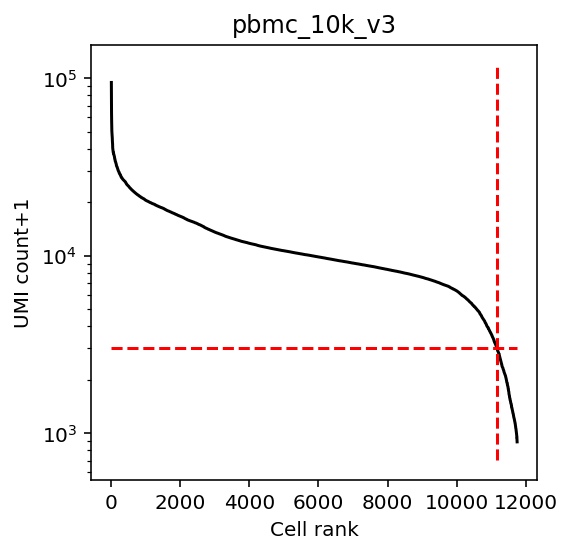

In [24]:
cf = []
thr_lb = [3e3]
fig1,ax1 = plt.subplots(1,1,figsize=(4,4))

for k in range(len(dataset_meta)):
    filename = loom_filepaths[len(subcluster_names)*k ]
    dataset_name = raw_data_locations[len(subcluster_names)*k ]
    
    clusters = cluster_annotations[k]
    
    with lp.connect(filename,mode='r') as ds:
        S = ds.layers[spliced_layer][:]
        U = ds.layers[unspliced_layer][:]
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
        n_cells = S.shape[1]
        monod.preprocess.knee_plot(S+U,ax1,viz=True,thr=thr_lb[k])
        cf_ = ((S+U).sum(0)>thr_lb[k])
        
        n_annot_bcs = len(clusters)
        annot_bcs_in_loom = clusters['Barcode'].isin(bcs).sum()
        annot_bcs_in_filt_loom = clusters['Barcode'].isin(bcs[cf_]).sum()
        print(f'Dataset {dataset_name}. \n\t{len(bcs)} barcodes in loom, {cf_.sum()} pass filter. {n_annot_bcs} in annotations; of these, {annot_bcs_in_loom} in loom and {annot_bcs_in_filt_loom} in filtered loom.')
        
        for j,cluster in enumerate(subcluster_names):
            annot_bcs = clusters[clusters['Cluster_name'].isin(cluster)]['Barcode']
            cf.append(np.isin(bcs,annot_bcs) & cf_)
            print(f'\t{cluster}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom. {cf[-1].sum()} pass filter.')

    ax1.set_title(dataset_name)

In [25]:
all_assigns = [list(clusters['Cluster_name'][clusters['Barcode'] == i])[0] for i in bcs[cf[0]]]
print(len(all_assigns)) 

10913


In [26]:
len(bcs[cf[0]])

10913

In [235]:
# #Select for hvgs
# adata = sc.read_loom('/home/tchari/counts/10x_pbmcs/loom/pbmc_10k_v3.loom') #sc
# bars = bcs[cf[0]]
# adata_sub = adata[adata.obs['barcode'].isin(bars)]
# adata_sub
#

In [102]:
# sc.pp.normalize_total(adata_sub, target_sum=1e4)
# sc.pp.log1p(adata_sub)
# sc.pp.highly_variable_genes(adata_sub, n_top_genes=2000, min_mean=0.0125, max_mean=3, min_disp=0.5)

# # Subset to highly variable genes
# adata_hvg = adata_sub[:, adata_sub.var.highly_variable]

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [103]:
# #adata_hvg = adata_sub
# adata_hvg.layers['spliced'].shape

(10913, 1999)

In [104]:
# hvgs = adata.var['gene_name'][adata_sub.var.highly_variable]
# len(hvgs)

1999

## **Gene Filtering**

In [27]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1 already exists.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k1
INFO:root:10913 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:5814 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1 already exists.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k3
INFO:root:10913 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:5814 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k3 already exists.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k5
INFO:root:10913 cells detected.
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:5814 genes retained

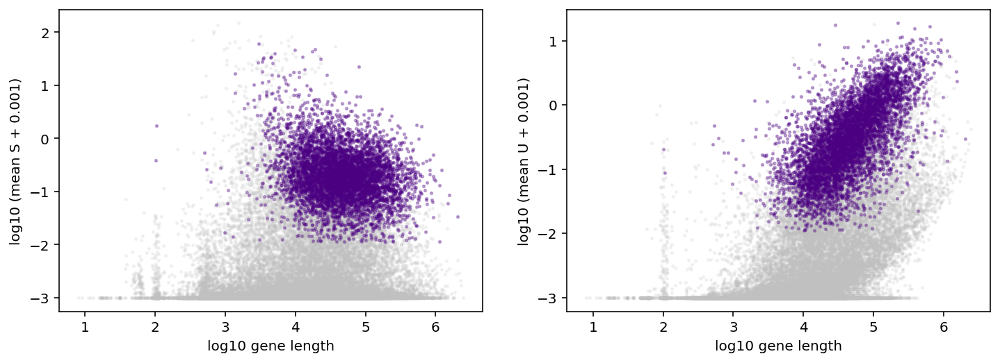

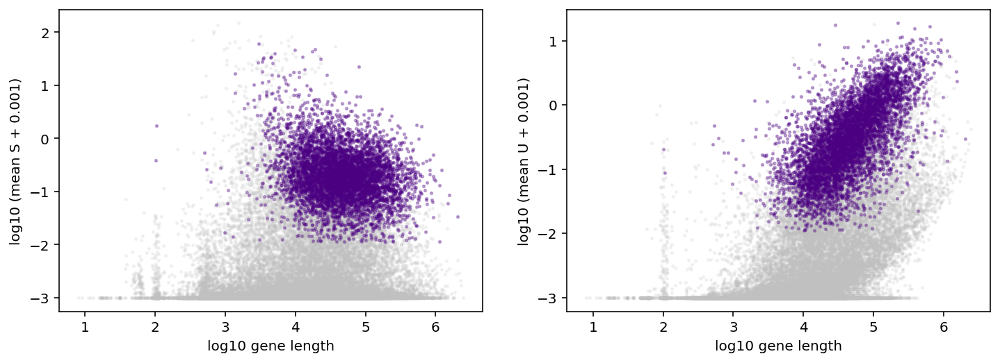

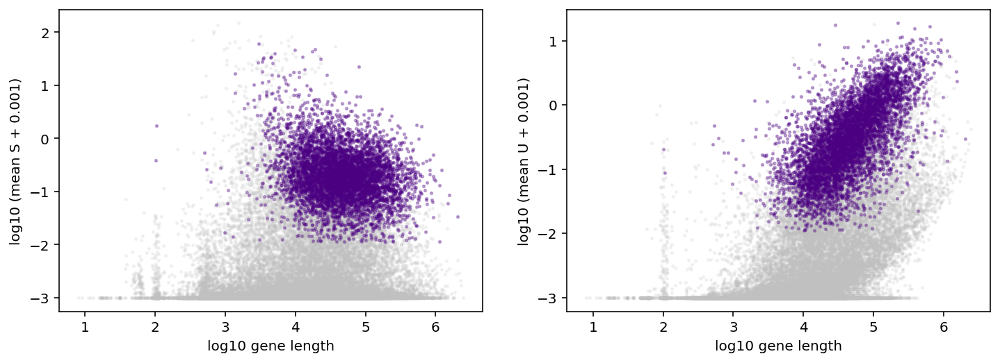

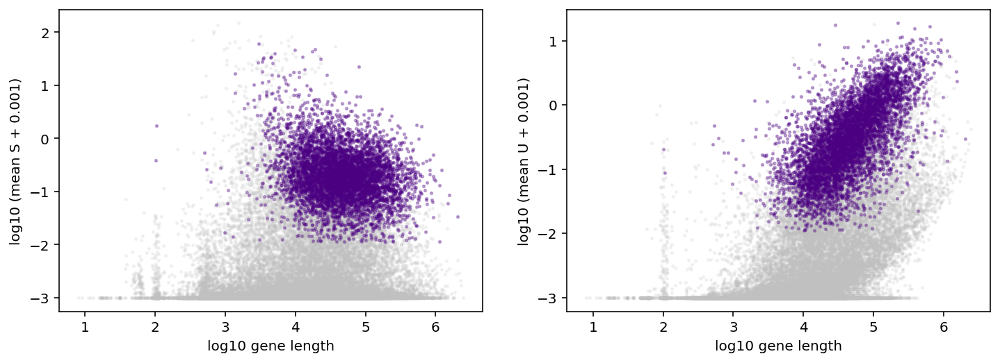

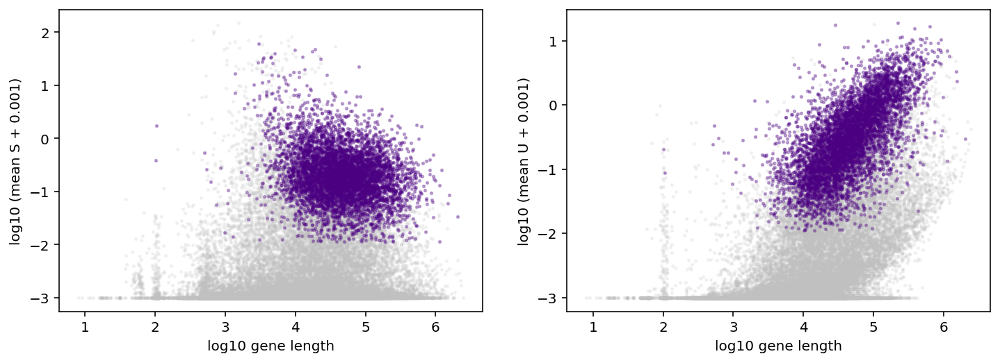

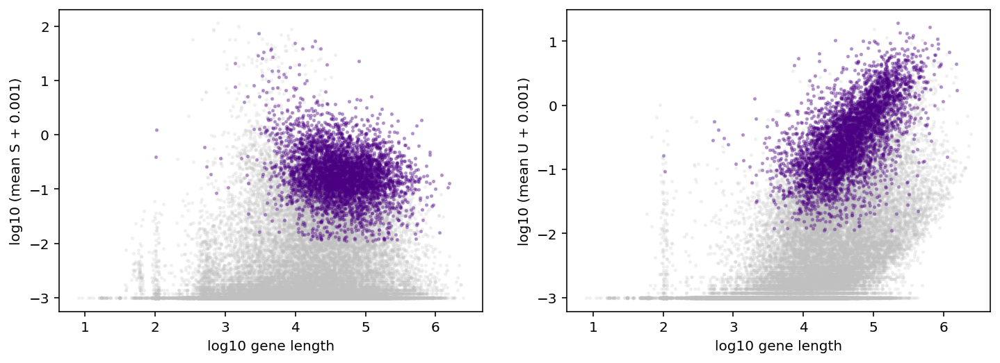

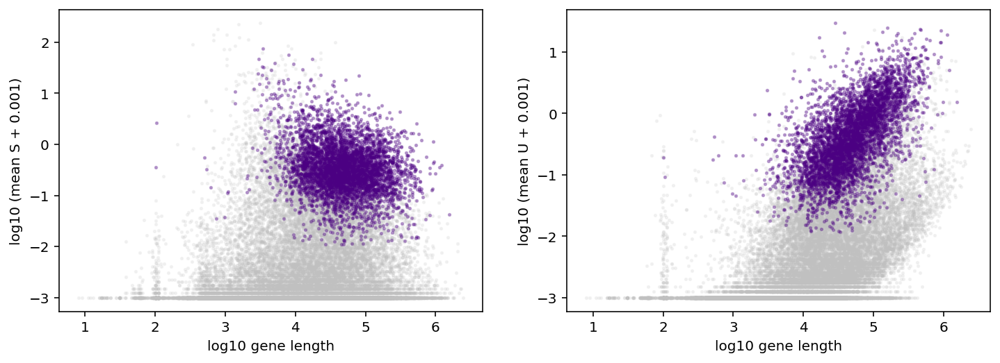

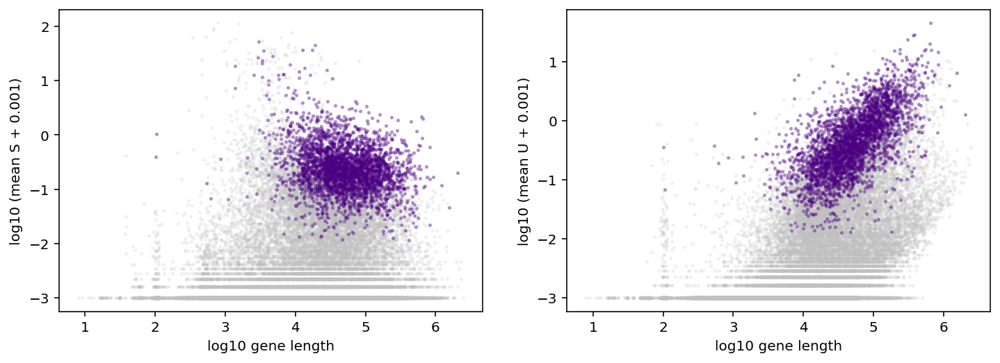

In [709]:
#Get genes.csv
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='pbmc_MM',batch_id=1,\
                                             datestring='230501', n_genes=1000,\
                                             exp_filter_threshold=None,cf=cf) 
#hvgs,1900, 2000

In [28]:
dir_string = './fits/gg_230501_025_pbmc_MM_1' #230426,230425
dataset_strings = [ dir_string+'/'+item for item in dataset_names]
print(dataset_strings)

['./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k3', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k5', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k10', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes', './fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells']


Make genes.csv with known markers as well

In [711]:
sel_genes = pd.read_csv('./fits/gg_230501_025_pbmc_MM_1/genes.csv',header=None) #fin_markers
sel_genes.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,VPS13D,KCNAB2,KLHL20,DHDDS,COPA,RNF11,RABGAP1L,NOTCH2,PUM1,RC3H1,...,SASH3,TRAPPC2,ZMAT1,APOOL,BRWD3,CYSLTR1,OGT,PDK3,SH3KBP1,PRPS2


In [712]:
first_sel = list(sel_genes.iloc[0])

In [713]:
remain = list((set(first_sel)^set(fin_markers))&set(first_sel))
for i in range(len(fin_markers)):
    sel_genes[i] = fin_markers[i]
    
# for i in range(len(fin_markers),1500): #For now ,remove extra genes from Monod selection
#     sel_genes[i] = remain[i-len(fin_markers)]
    
sel_genes.head()

,0,1,2,3,4,5,6,7,8,9,...,1072,1073,1074,1075,1076,1077,1078,1079,1080,1081
0,SPATA5,TMPO,CEP170,ADGRE2,MIS18A,EVL,SORL1,ATAD2,SPTBN1,TSHZ2,...,NCR1,CSNK1E,NECAP2,IL2RG,DDOST,RIDA,TRAC,HERPUD1,SCARF1,ISG20


In [714]:
sel_genes.to_csv('./fits/gg_230501_025_pbmc_MM_1/genes.csv',header=None,index=None)

In [715]:
#Check looks ok
test = pd.read_csv('./fits/gg_230501_025_pbmc_MM_1/genes.csv',header=None)
test.head()

,0,1,2,3,4,5,6,7,8,9,...,1072,1073,1074,1075,1076,1077,1078,1079,1080,1081
0,SPATA5,TMPO,CEP170,ADGRE2,MIS18A,EVL,SORL1,ATAD2,SPTBN1,TSHZ2,...,NCR1,CSNK1E,NECAP2,IL2RG,DDOST,RIDA,TRAC,HERPUD1,SCARF1,ISG20


Check k-means inits

In [57]:
all_groups_kmeans = []

INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/raw.sd.
(10913, 1082)
(10913, 1082)
(10913, 1082)
(10913, 1082)
(10913, 1082)


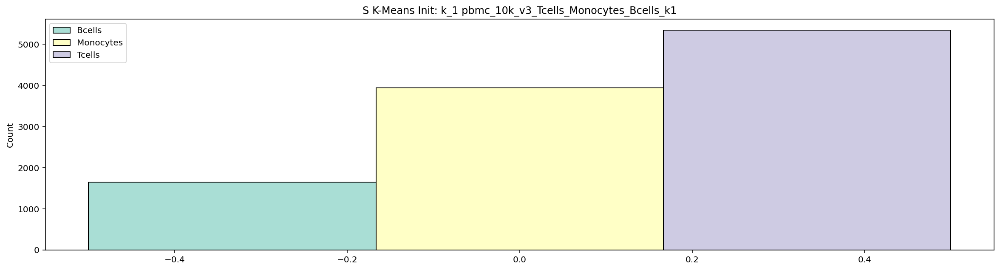

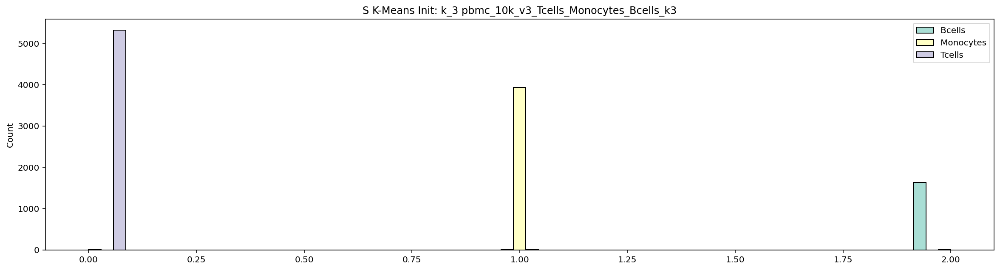

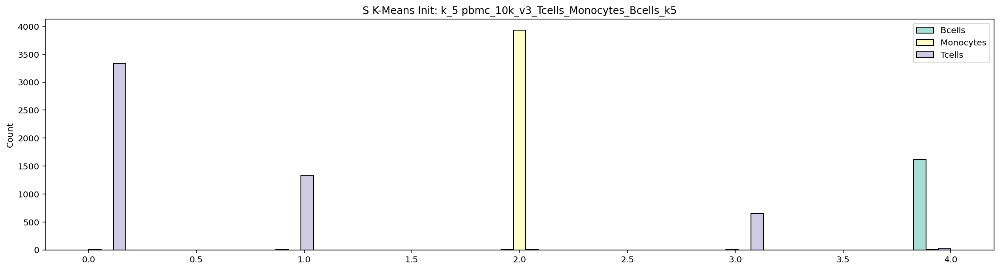

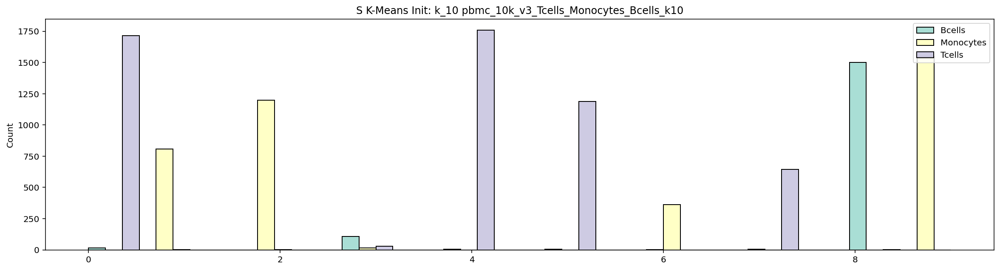

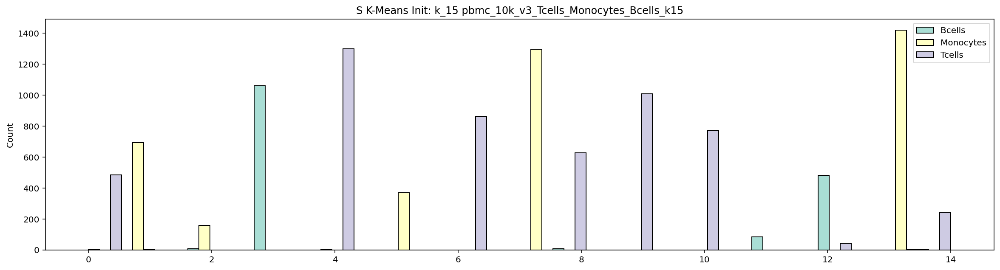

In [58]:
#For easier demonstration
#Check initializations of clusters
which = 0
search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
                dataset_strings[which], dir_string, viz=False,dataset_attr_names=attribute_names,cf=cf[which])

for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False,dataset_attr_names=attribute_names,cf=cf[which])

    S = search_data.layers[1,:,:]
    S_t = S.T
    tots = np.sum(S_t,axis=1)
    divids = (1e4/tots)[:,None]
    S_t = S_t*divids
    S_t = np.log1p(S_t)
    print(S_t.shape)

    kmeans = KMeans(n_clusters=ks[which], random_state=0).fit(S_t)
    labs = kmeans.labels_


    labels = labs
    all_groups_kmeans += [labs]
    
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('S K-Means Init: '+'k_'+str(ks[which])+' '+dataset_names[which])




(10913, 1082)
(10913, 1082)
(10913, 1082)
(10913, 1082)
(10913, 1082)


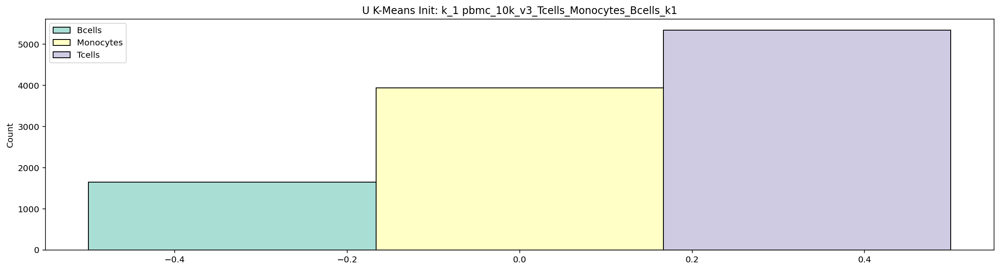

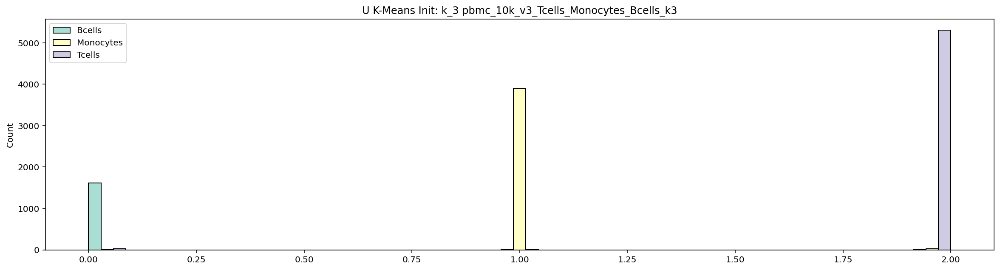

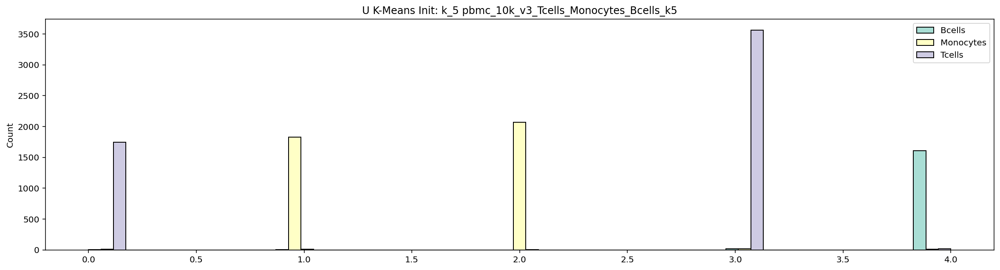

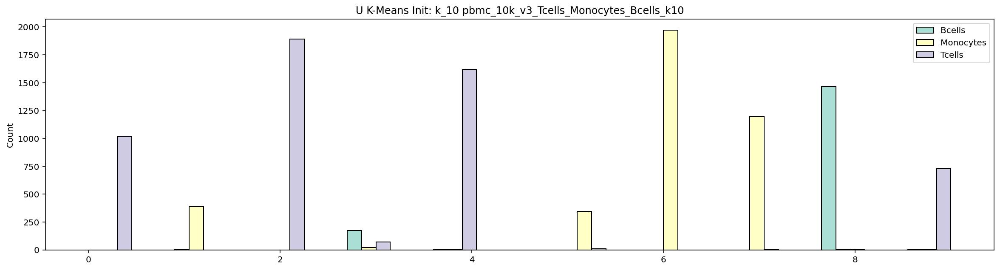

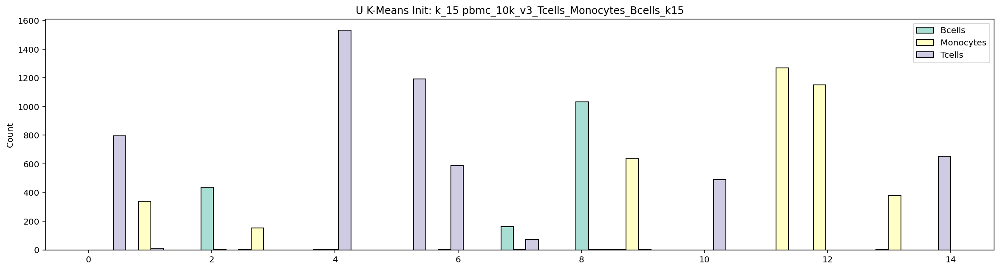

In [59]:
for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False,dataset_attr_names=attribute_names,cf=cf[which])

    S = search_data.layers[0,:,:]
    S_t = S.T
    tots = np.sum(S_t,axis=1)+1
    divids = (1e4/tots)[:,None]
    S_t = S_t*divids
    S_t = np.log1p(S_t)
    print(S_t.shape)

    kmeans = KMeans(n_clusters=ks[which], random_state=0).fit(S_t)
    labs = kmeans.labels_


    labels = labs
    all_groups_kmeans += [labs] 
    
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('U K-Means Init: '+'k_'+str(ks[which])+' '+dataset_names[which])


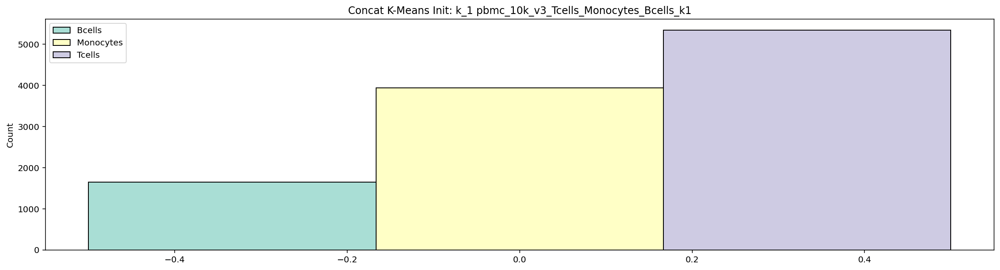

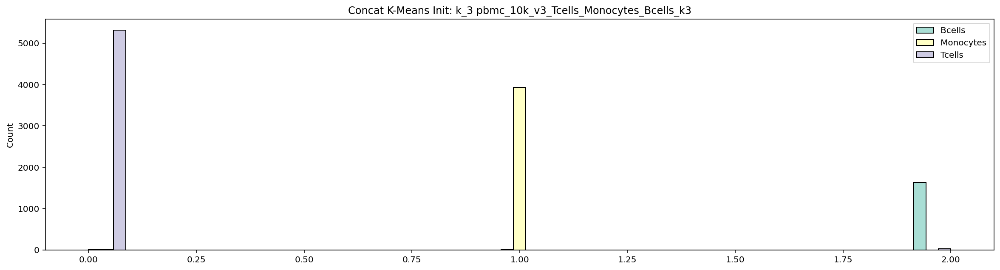

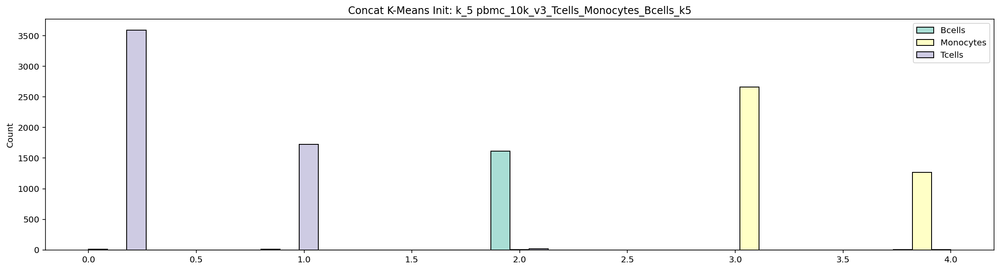

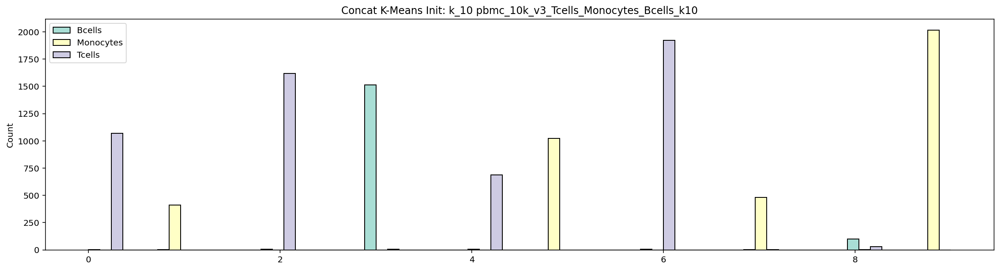

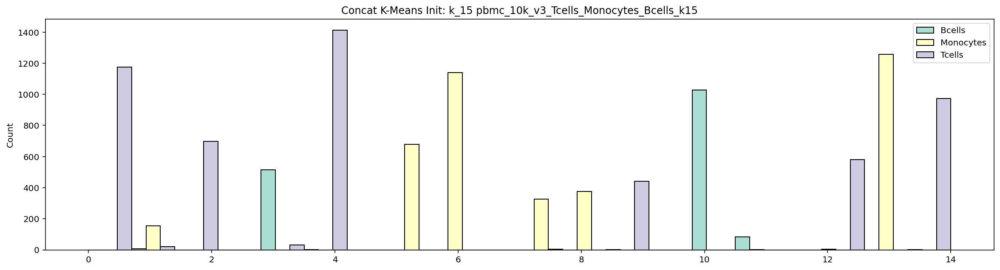

In [60]:
for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[which])
    
    U = search_data.layers[0,:,:]
    U_t = U.T
    S = search_data.layers[1,:,:]
    S_t = S.T
    
    concat = np.concatenate((U_t, S_t), axis=1)

    tots = np.sum(concat,axis=1)
    divids = (1e4/tots)[:,None]
    concat = concat*divids
    concat = np.log1p(concat)

    
    
    kmeans = KMeans(n_clusters=ks[which], random_state=0).fit(concat)
    labs = kmeans.labels_

    labels = labs
    all_groups_kmeans += [labs]
    
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('Concat K-Means Init: '+'k_'+str(ks[which])+' '+dataset_names[i])

    
    

In [70]:
#compare overlap of all k-means assignments

num_per_set = num_ks

pairs = [(0,1),(0,2),(1,2)]
labs = [('Spliced','Unspliced'),('Spliced','Both'),('Unspliced','Both')]
#Plot confmats
fig, ax = plt.subplots(nrows=num_per_set, ncols=len(pairs), figsize=(90,60))
    
for i in range(0,num_per_set):
    
    for j in range(len(pairs)):
        
        p = pairs[j]
        
        assign = all_groups_kmeans[p[1]*(num_per_set)+i]
        true = all_groups_kmeans[p[0]*(num_per_set)+i]

        true_copy = list(true)
        assign_copy = list(assign)

        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    true_copy += [a]
                    assign_copy += [a]


        conmat = confusion_matrix(true_copy, assign_copy)
        val = np.mat(conmat) 
        classnames = list(set(true_copy))
        df_cm = pd.DataFrame(

                val, index=classnames, columns=classnames, 

            )


        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    print(df_cm.shape)
                    df_cm.loc[a,a] = df_cm.loc[a,a]-1


        heatmap = sns.heatmap(df_cm, annot=True, 
                              cmap=sns.color_palette("light:#5A9", as_cmap=True),ax=ax[i,j],
                             square=True,linewidths=1, cbar_kws={"shrink": 0.75})
        heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
        heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)
        
        heatmap.axhline(y=0, color='k',linewidth=2)
        heatmap.axhline(y=val.shape[1], color='k',linewidth=2)
        heatmap.axvline(x=0, color='k',linewidth=2)
        heatmap.axvline(x=val.shape[0], color='k',linewidth=2)

        ax[i,j].set_ylabel(labs[j][0])
        ax[i,j].set_xlabel(labs[j][1])

    
plt.show()

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see ht

Leiden Clusters

In [62]:
neigh = 30
all_groups = []
res = [0.25,0.5,1,1.5,2.0]

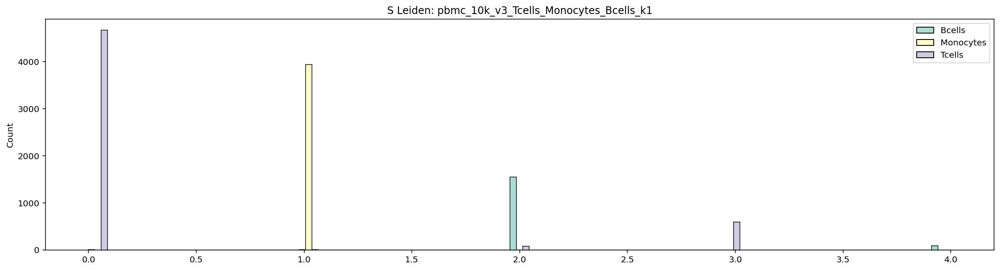

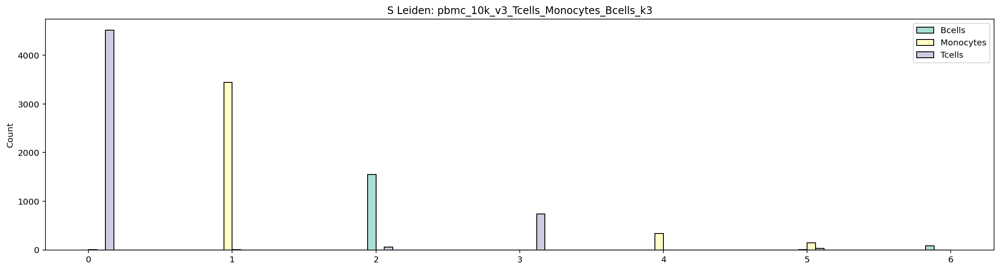

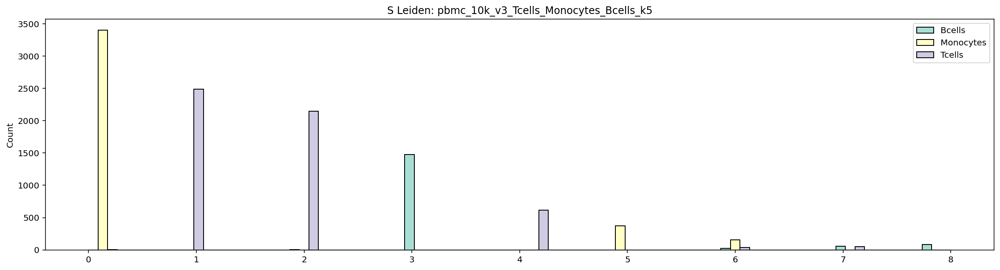

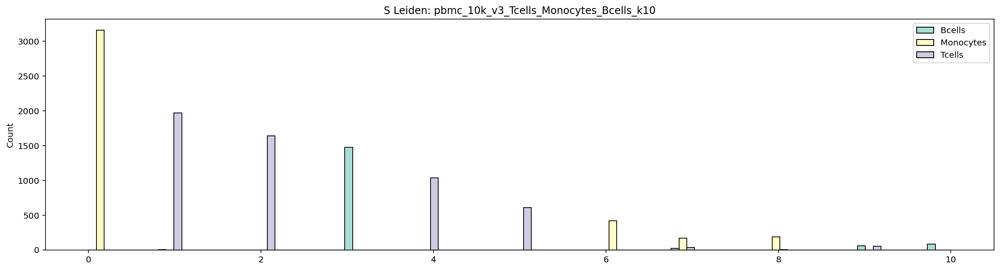

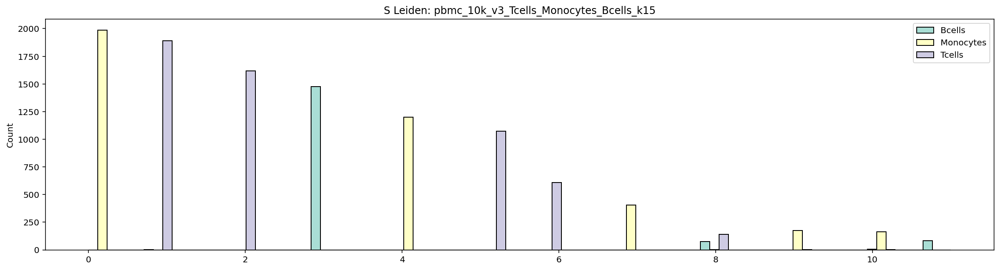

In [63]:
#From https://github.com/scverse/scanpy/blob/ed3b277b2f498e3cab04c9416aaddf97eec8c3e2/scanpy/tools/_leiden.py#L24-L177
for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[which])
    #Spliced
    S = search_data.layers[1,:,:]
    S_t = S.T
    tots = np.sum(S_t,axis=1)
    divids = (1e4/tots)[:,None]
    S_t = S_t*divids
    S_t = np.log1p(S_t)

    A = kneighbors_graph(S_t, neigh, mode='connectivity', include_self=True)
    sources, targets = A.nonzero()
    weights = A[sources, targets]
    if isinstance(weights, np.matrix):
        weights = weights.A1
    g = ig.Graph(directed=False) #True in scanpy, which is odd
    g.add_vertices(A.shape[0])  # this adds adjacency.shape[0] vertices
    g.add_edges(list(zip(sources, targets)))

    g.es['weight'] = weights
    
    partition_type = la.RBConfigurationVertexPartition
    
    
    part = la.find_partition(g, partition_type, 
                                    weights=np.array(g.es['weight']).astype(np.float64), 
                                    n_iterations=-1, resolution_parameter=res[i%num_ks])

    all_groups += [np.array(part.membership)]
    
    labels = np.array(part.membership)
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('S Leiden: '+dataset_names[i])
    
    
    


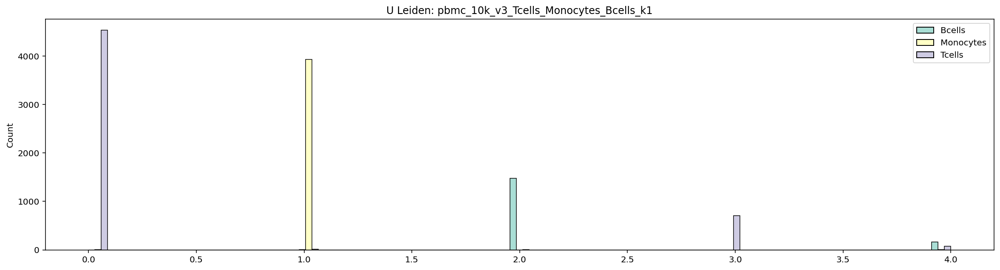

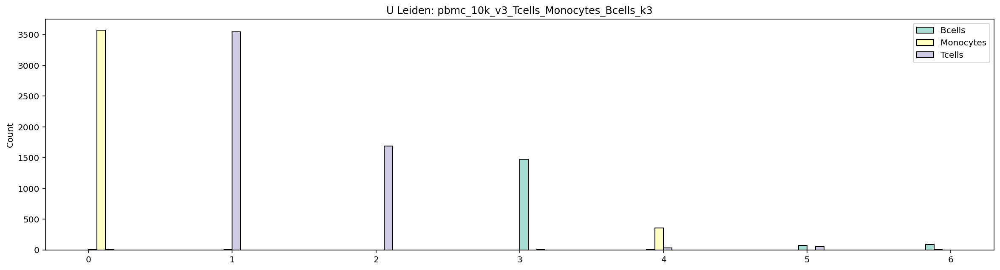

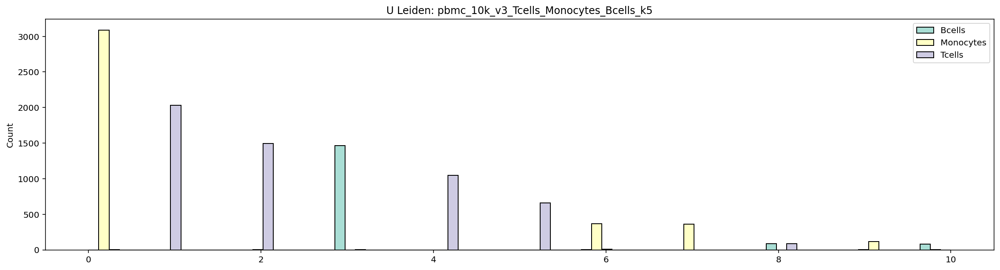

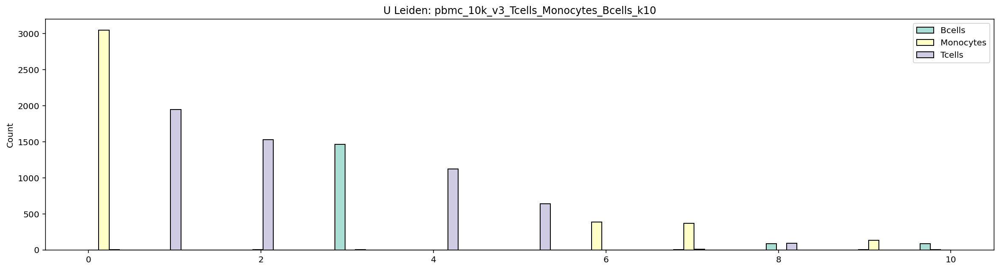

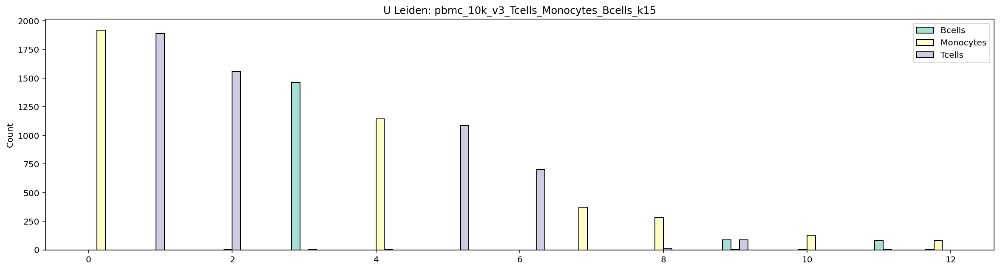

In [64]:
#From https://github.com/scverse/scanpy/blob/ed3b277b2f498e3cab04c9416aaddf97eec8c3e2/scanpy/tools/_leiden.py#L24-L177
for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[which])
    #Spliced
    S = search_data.layers[0,:,:]
    S_t = S.T
    tots = np.sum(S_t,axis=1)
    divids = (1e4/tots)[:,None]
    S_t = S_t*divids
    S_t = np.log1p(S_t)

    A = kneighbors_graph(S_t, neigh, mode='connectivity', include_self=True)
    sources, targets = A.nonzero()
    weights = A[sources, targets]
    if isinstance(weights, np.matrix):
        weights = weights.A1
    g = ig.Graph(directed=False) #True in scanpy, which is odd
    g.add_vertices(A.shape[0])  # this adds adjacency.shape[0] vertices
    g.add_edges(list(zip(sources, targets)))

    g.es['weight'] = weights
    
    partition_type = la.RBConfigurationVertexPartition
    
    
    part = la.find_partition(g, partition_type, 
                                    weights=np.array(g.es['weight']).astype(np.float64), 
                                    n_iterations=-1, resolution_parameter=res[i%num_ks])

    all_groups += [np.array(part.membership)]
    
    labels = np.array(part.membership)
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('U Leiden: '+dataset_names[i])
    
    
    


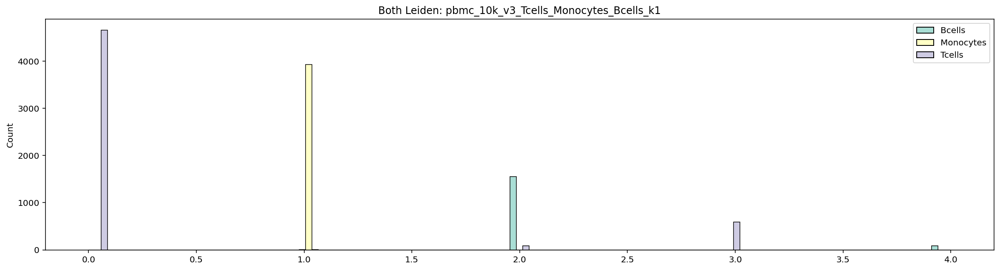

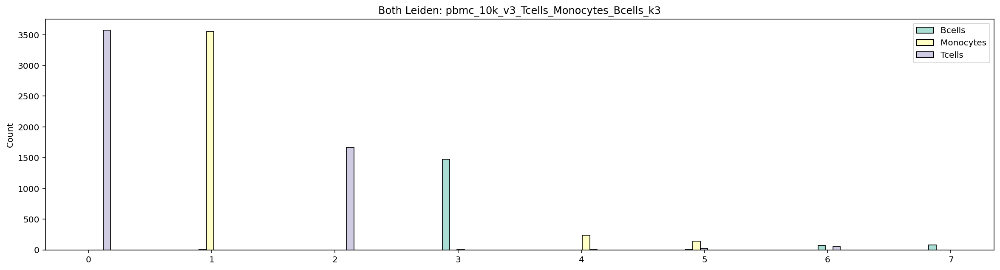

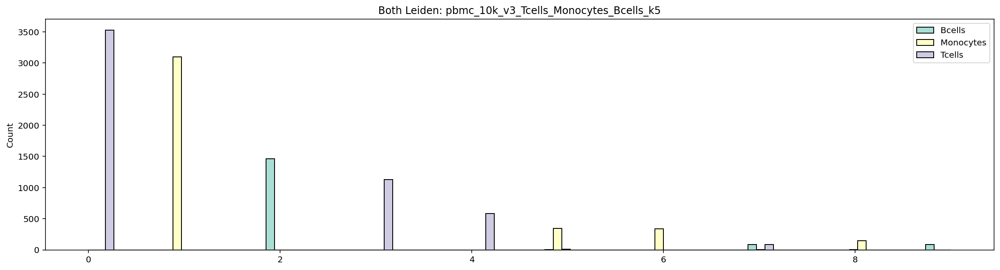

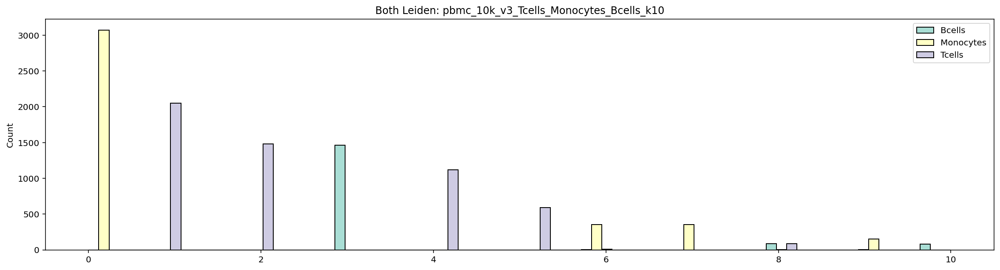

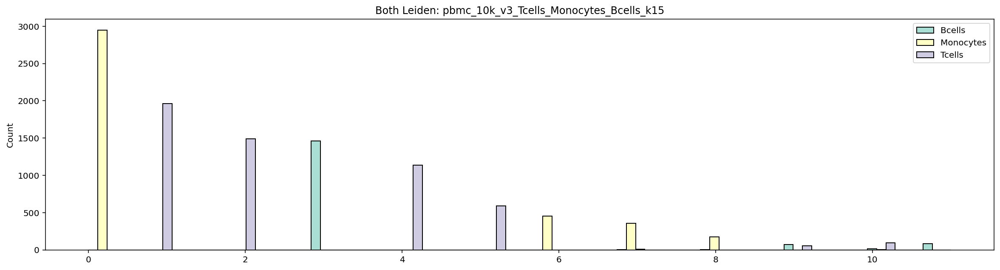

In [65]:
#From https://github.com/scverse/scanpy/blob/ed3b277b2f498e3cab04c9416aaddf97eec8c3e2/scanpy/tools/_leiden.py#L24-L177
for i in range(num_ks):
    which = i
#     search_data = monod.extract_data.extract_data(loom_filepaths[which], transcriptome_filepath, dataset_names[which],
#                 dataset_strings[which], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[which])
    U = search_data.layers[0,:,:]
    U_t = U.T
    S = search_data.layers[1,:,:]
    S_t = S.T
    
    concat = np.concatenate((U_t, S_t), axis=1)

    tots = np.sum(concat,axis=1)
    divids = (1e4/tots)[:,None]
    concat = concat*divids
    concat = np.log1p(concat)

    A = kneighbors_graph(concat, neigh, mode='connectivity', include_self=True)
    sources, targets = A.nonzero()
    weights = A[sources, targets]
    if isinstance(weights, np.matrix):
        weights = weights.A1
    g = ig.Graph(directed=False) #True in scanpy, which is odd
    g.add_vertices(A.shape[0])  # this adds adjacency.shape[0] vertices
    g.add_edges(list(zip(sources, targets)))

    g.es['weight'] = weights
    
    partition_type = la.RBConfigurationVertexPartition
    
    
    part = la.find_partition(g, partition_type, 
                                    weights=np.array(g.es['weight']).astype(np.float64), 
                                    n_iterations=-1, resolution_parameter=res[i%num_ks])

    all_groups += [np.array(part.membership)]
    
    labels = np.array(part.membership)
    plt.figure(figsize=(20,5))
    sns.histplot(x=labels,hue=pd.Categorical(all_assigns), kde=False,palette='Set3',multiple="dodge")
    plt.title('Both Leiden: '+dataset_names[i])
    
    
    


In [69]:
#compare overlap of all k-means assignments

num_per_set = num_ks

pairs = [(0,1),(0,2),(1,2)]
labs = [('Spliced','Unspliced'),('Spliced','Both'),('Unspliced','Both')]
#Plot confmats
fig, ax = plt.subplots(nrows=num_per_set, ncols=len(pairs), figsize=(90,60))
    
for i in range(0,num_per_set):
    
    for j in range(len(pairs)):
        
        p = pairs[j]
        
        assign = all_groups[p[1]*(num_per_set)+i]
        true = all_groups[p[0]*(num_per_set)+i]

        true_copy = list(true)
        assign_copy = list(assign)

        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    true_copy += [a]
                    assign_copy += [a]


        conmat = confusion_matrix(true_copy, assign_copy)
        val = np.mat(conmat) 
        classnames = list(set(true_copy))
        df_cm = pd.DataFrame(

                val, index=classnames, columns=classnames, 

            )


        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    print(df_cm.shape)
                    df_cm.loc[a,a] = df_cm.loc[a,a]-1


        heatmap = sns.heatmap(df_cm, annot=True, 
                              cmap=sns.color_palette("light:#5A9", as_cmap=True),ax=ax[i,j],
                             square=True,linewidths=1, cbar_kws={"shrink": 0.75})
        heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
        heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)
        
        heatmap.axhline(y=0, color='k',linewidth=2)
        heatmap.axhline(y=val.shape[1], color='k',linewidth=2)
        heatmap.axvline(x=0, color='k',linewidth=2)
        heatmap.axvline(x=val.shape[0], color='k',linewidth=2)

        ax[i,j].set_ylabel(labs[j][0])
        ax[i,j].set_xlabel(labs[j][1])

    
plt.show()

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see ht

(8, 8)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(8, 8)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(11, 11)
(11, 11)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(10, 10)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see ht

(13, 13)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


## **Run MM/Monod Inference**

v----------- Only Run Once -----------v

In [29]:
#Define bounds, 
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [10,11]


In [30]:
len(dataset_names)

8

In [728]:
# dataset_names

In [729]:
#Run Monod as control on separate groups
result_strings = []
#for i in range(1,2): #n_datasets
for i in range(len(dataset_names)-3,len(dataset_names)): 

    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')

    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':1})

    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string,viz=False, dataset_attr_names=attribute_names,cf=cf[i])

    full_result_string = inference_parameters.fit_all_grid_points(30,search_data)

    result_strings.append(full_result_string)

INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [14:48<00:00,  8.08s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 892.9 seconds.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Monocytes
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [17:09<00:00,  9.36s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 1034.5 seconds.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Bcells
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [13:37<00:00,  7.43s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 822.6 seconds.


In [730]:
result_strings = [i+'/Bursty_Poisson_10x11/grid_scan_results.res' for i in dataset_strings[(len(dataset_names)-3):]]


INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_10x11/grid_scan_results.res.
INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_10x11/grid_scan_results.res.
(-6.222222222222222, -1.25)
(-5.666666666666666, -0.6999999999999997)
(-5.666666666666666, -0.6999999999999997)


Text(0, 0.5, '$\\log_{10} \\lambda_M$')

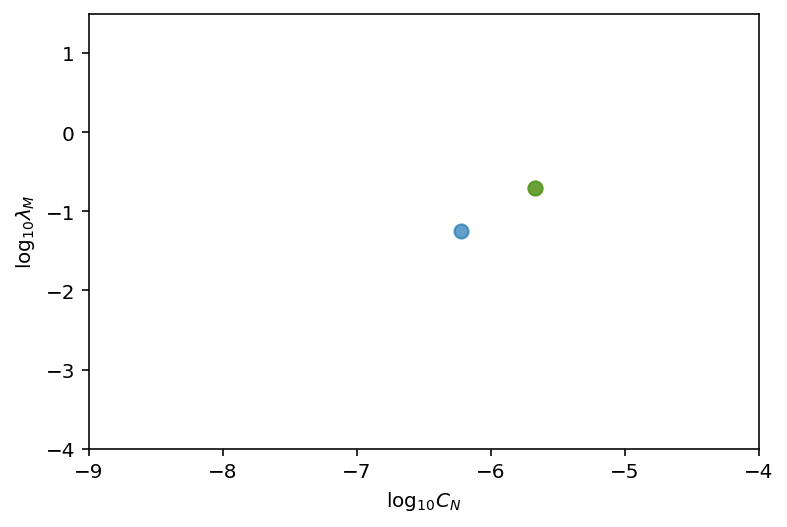

In [731]:
sr = [monod.analysis.load_search_results(i) for i in result_strings]
plt.figure()
for r in sr:
    r.find_sampling_optimum()
    print(r.samp_optimum)
    plt.scatter(r.samp_optimum[0],r.samp_optimum[1],alpha=0.7,s=50)
    
plt.xlim([-9,-4])
plt.ylim([-4,1.5])

plt.xlabel(r'$\log_{10} C_N$')
plt.ylabel(r'$\log_{10} \lambda_M$')

In [733]:
#Find closest technical param in grid, to centroid of technical params on plot
arbitrary_params = np.asarray([-5.8,-0.9]) #-8,-2.5
arbitrary_ind = np.argmin(((sr[0].sp.sampl_vals-arbitrary_params)**2).sum(1))
arbitrary_pars = sr[0].sp.sampl_vals[arbitrary_ind]
print(arbitrary_pars)

(-5.666666666666666, -0.6999999999999997)


^----------- Only Run Once -----------^

In [31]:
dataset_names

['pbmc_10k_v3_Tcells_Monocytes_Bcells_k1',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k3',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k5',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k10',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k15',
 'pbmc_10k_v3_Tcells',
 'pbmc_10k_v3_Monocytes',
 'pbmc_10k_v3_Bcells']

In [32]:
#Define bounds, choose 'centroid'
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-5.666666666666666, -0.6999999999999997] 
samp_ub = [-5.666666666666666, -0.6999999999999997] 
# gridsize = [5,6]
gridsize = [1,1]

In [736]:
#Run Monod as control on separate groups 
result_strings = []
#for i in range(1,2): #n_datasets
for i in range(len(dataset_names)-3,len(dataset_names)):

    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')

    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':1})

    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[i])

    full_result_string = inference_parameters.fit_all_grid_points(30,search_data)

    result_strings.append(full_result_string)
    

INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:37<00:00, 157.24s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_1x1/analysis_figures already exists.
INFO:root:Runtime: 161.3 seconds.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Monocytes
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:07<00:00, 127.10s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_1x1/analysis_figures already exists.
INFO:root:Runtime: 131.1 seconds.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Bcells
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:07<00:00, 127.72s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_1x1/analysis_figures already exists.
INFO:root:Runtime: 131.8 seconds.


In [33]:
result_strings = [i+'/Bursty_Poisson_1x1/grid_scan_results.res' for i in dataset_strings[len(dataset_names)-3:]]

In [34]:
sr = [monod.analysis.load_search_results(i) for i in result_strings]
sr

INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/Bursty_Poisson_1x1/grid_scan_results.res.
INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/Bursty_Poisson_1x1/grid_scan_results.res.
INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/Bursty_Poisson_1x1/grid_scan_results.res.


In [35]:
#Raw ds files (with spliced/unspliced counts)
raws = [i+'/raw.sd' for i in dataset_strings[len(dataset_names)-3:]] #0:len(chosen)*num_ks
sd = [monod.analysis.load_search_data(i) for i in raws]
sd

INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Monocytes/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Bcells/raw.sd.


**Run Mixture Model**

In [36]:
epochs = 30 

In [741]:
result_strings = []
for i in [4,3,2,1,0]: 
    
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    
    inference_parameters = monod.mminference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,k=ks[i],epochs=epochs,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':1})
    
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[i])
    
    inference_parameters.fit_all_grid_points(50,search_data)


INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k15
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/raw.sd.
INFO:root:Starting non-parallelized grid scan.
INFO:root:M Step Initial Run: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [05:45<00:00, 23.01s/it]


INFO:root:Parallelized MLE fits complete.
INFO:root:EM Epoch 1/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [05:39<00:00, 24.22s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.04324563e-01 4.97596003e-02 3.60701749e-03 1.02069675e-01
 2.22225508e-01 3.38787159e-03 9.69440746e-05 1.33830587e-01
 4.34536837e-02 1.08135324e-01 6.64133680e-03 7.36706428e-03
 3.35391699e-02 1.73546397e-01 8.01525743e-03]
Q Function:  -19209995.00404793

INFO:root:EM Epoch 2/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [05:30<00:00, 23.61s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [9.79923393e-02 4.22768085e-02 4.03187046e-03 1.02717124e-01
 2.30932830e-01 1.27368223e-04 1.00228715e-02 1.43380228e-01
 4.92845359e-02 1.11748033e-01 9.16338311e-11 6.96417125e-03
 3.27214034e-02 1.66777049e-01 1.02336743e-03]
Q Function:  -18009384.384952623

INFO:root:EM Epoch 3/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [06:47<00:00, 33.92s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [7.13543714e-02 3.34398724e-02 5.22313638e-03 1.03885118e-01
 2.63989233e-01 9.16338311e-11 8.32955390e-03 1.61469021e-01
 4.86797032e-02 1.07226722e-01 9.16338311e-11 6.96417125e-03
 3.15479536e-02 1.57891143e-01 9.16338311e-11]
Q Function:  -18057370.57278627

INFO:root:EM Epoch 4/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [04:53<00:00, 24.48s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [5.86131024e-02 2.47758384e-02 6.41436808e-03 1.18154933e-01
 2.74255429e-01 9.16338311e-11 8.52695561e-03 1.60884457e-01
 5.02206899e-02 1.08069065e-01 9.16338311e-11 6.96417125e-03
 1.68211053e-02 1.66299885e-01 9.16338311e-11]
Q Function:  -18090644.298284013

INFO:root:EM Epoch 5/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [05:23<00:00, 26.96s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [5.35645433e-02 1.92161263e-02 6.41436827e-03 1.27421335e-01
 2.78859327e-01 9.16338311e-11 6.14377898e-03 1.58311394e-01
 5.15059934e-02 1.07787027e-01 9.16338311e-11 6.96419173e-03
 7.35031086e-03 1.76461603e-01 9.16338311e-11]
Q Function:  -18046201.94973887

INFO:root:EM Epoch 6/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [05:33<00:00, 27.83s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [4.56611058e-02 1.19116674e-02 6.41436827e-03 1.32218203e-01
 2.84634779e-01 9.16338311e-11 3.27916621e-03 1.50541557e-01
 5.08793930e-02 1.10442947e-01 9.16338311e-11 7.13507973e-03
 2.82898643e-03 1.94052747e-01 9.16338311e-11]
Q Function:  -18020508.72185807

INFO:root:EM Epoch 7/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [05:54<00:00, 32.22s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [4.33684971e-02 9.16339230e-05 6.58470800e-03 1.33690197e-01
 2.87720227e-01 9.16338311e-11 9.16377518e-11 1.49277224e-01
 5.07401601e-02 1.11267530e-01 9.16338311e-11 7.23907275e-03
 9.17247716e-05 2.09929026e-01 9.16338311e-11]
Q Function:  -18015743.634932965

INFO:root:EM Epoch 8/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [04:37<00:00, 30.82s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.86279960e-02 9.16338311e-11 6.59763593e-03 1.33558066e-01
 2.96511884e-01 9.16338311e-11 9.16338311e-11 1.29533226e-01
 5.08992951e-02 1.07177671e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.29855153e-01 9.16338311e-11]
Q Function:  -18035540.771002032

INFO:root:EM Epoch 9/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [06:20<00:00, 42.31s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.71987760e-02 9.16338311e-11 6.59718075e-03 1.33250731e-01
 3.02307599e-01 9.16338311e-11 9.16338311e-11 1.16940368e-01
 5.18130231e-02 1.02022463e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.42630787e-01 9.16338311e-11]
Q Function:  -18043087.76179319

INFO:root:EM Epoch 10/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [05:27<00:00, 36.41s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.51073658e-02 9.16338311e-11 6.59761259e-03 1.33280888e-01
 3.05157259e-01 9.16338311e-11 9.16338311e-11 1.18921140e-01
 5.44935033e-02 9.84614934e-02 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.40741664e-01 9.16338311e-11]
Q Function:  -17996222.745789517

INFO:root:EM Epoch 11/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [04:52<00:00, 32.52s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.36880701e-02 9.16338311e-11 6.58462477e-03 1.33241356e-01
 3.01303742e-01 9.16338311e-11 9.16338311e-11 1.15234422e-01
 5.30683498e-02 1.05211997e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.44428365e-01 9.16338311e-11]
Q Function:  -17986557.041709695

INFO:root:EM Epoch 12/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [05:24<00:00, 36.08s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.45227308e-02 9.16338311e-11 6.33790529e-03 1.33144401e-01
 2.99300046e-01 9.16338311e-11 9.16338311e-11 1.06693360e-01
 5.29539984e-02 1.06839067e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.52969418e-01 9.16338311e-11]
Q Function:  -18026731.84731494

INFO:root:EM Epoch 13/30: 
INFO:root:Starting parallelized MLE param fits for EM.


  0%|                                                                                                                                | 0/9 [00:00<?, ?it/s]

INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [05:52<00:00, 39.12s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.33255553e-02 9.16338311e-11 6.03037719e-03 1.33333003e-01
 2.91821470e-01 9.16338311e-11 9.16338311e-11 9.75693550e-02
 5.14270857e-02 1.17252414e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.62001665e-01 9.16338311e-11]
Q Function:  -18017788.4737743

INFO:root:EM Epoch 15/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [04:47<00:00, 31.91s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31709041e-02 9.16338311e-11 5.95619911e-03 1.33333458e-01
 2.91304378e-01 9.16338311e-11 9.16338311e-11 9.38154725e-02
 5.14819722e-02 1.17953705e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.65744838e-01 9.16338311e-11]
Q Function:  -18038840.75517628

INFO:root:EM Epoch 16/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [03:39<00:00, 24.44s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31742579e-02 9.16338311e-11 5.95613770e-03 1.33325262e-01
 2.90840857e-01 9.16338311e-11 9.16338311e-11 9.31180359e-02
 5.15279851e-02 1.18365101e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.66453290e-01 9.16338311e-11]
Q Function:  -18032895.581709933

INFO:root:EM Epoch 17/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:52<00:00, 19.13s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31710423e-02 9.16338311e-11 5.95613770e-03 1.33325410e-01
 2.90806396e-01 9.16338311e-11 9.16338311e-11 9.05234626e-02
 5.15216087e-02 1.18499293e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.68957577e-01 9.16338311e-11]
Q Function:  -18034358.53406585

INFO:root:EM Epoch 18/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:49<00:00, 18.83s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714349e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658690e-01 9.16338311e-11 9.16338311e-11 9.17425934e-02
 5.15290213e-02 1.18640749e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.67736926e-01 9.16338311e-11]
Q Function:  -18031948.037554666

INFO:root:EM Epoch 19/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:42<00:00, 18.08s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714370e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658194e-01 9.16338311e-11 9.16338311e-11 9.05683342e-02
 5.15289902e-02 1.18641274e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.68911185e-01 9.16338311e-11]
Q Function:  -18042078.833981737

INFO:root:EM Epoch 20/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:40<00:00, 17.80s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658193e-01 9.16338311e-11 9.16338311e-11 8.98347365e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.69644783e-01 9.16338311e-11]
Q Function:  -18036903.53016124

INFO:root:EM Epoch 21/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:24<00:00, 16.03s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.79127166e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.71566803e-01 9.16338311e-11]
Q Function:  -18038908.77710799

INFO:root:EM Epoch 22/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:22<00:00, 15.86s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.66529798e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.72826540e-01 9.16338311e-11]
Q Function:  -18039661.516127437

INFO:root:EM Epoch 23/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:16<00:00, 15.20s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.50591489e-02
 5.15289900e-02 1.18641277e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.74420369e-01 9.16338311e-11]
Q Function:  -18041543.191414997

INFO:root:EM Epoch 24/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:18<00:00, 15.40s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.53775477e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.74101972e-01 9.16338311e-11]
Q Function:  -18037742.01212723

INFO:root:EM Epoch 25/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:14<00:00, 14.94s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.53119837e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.74167536e-01 9.16338311e-11]
Q Function:  -18042815.947185494

INFO:root:EM Epoch 26/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:13<00:00, 14.82s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.48376896e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.74641830e-01 9.16338311e-11]
Q Function:  -18046381.042859893

INFO:root:EM Epoch 27/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:25<00:00, 16.22s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.88784913e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.70601028e-01 9.16338311e-11]
Q Function:  -18023930.15673076

INFO:root:EM Epoch 28/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:15<00:00, 15.10s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.56705955e-02
 5.15289900e-02 1.18641280e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.73808920e-01 9.16338311e-11]
Q Function:  -18041973.414025854

INFO:root:EM Epoch 29/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:15<00:00, 15.03s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658192e-01 9.16338311e-11 9.16338311e-11 8.56347089e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.73844811e-01 9.16338311e-11]
Q Function:  -18043554.743879158

INFO:root:EM Epoch 30/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:15<00:00, 15.10s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [3.31714371e-02 9.16338311e-11 5.95613770e-03 1.33325374e-01
 2.90658193e-01 9.16338311e-11 9.16338311e-11 8.57124406e-02
 5.15289900e-02 1.18641276e-01 9.16338311e-11 7.23907275e-03
 9.16338311e-11 2.73767079e-01 9.16338311e-11]
Q Function:  -18044597.872979306

INFO:root:Non-parallelized grid scan complete.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k10/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k10/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k10
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocy

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:17<00:00, 13.76s/it]


INFO:root:Parallelized MLE fits complete.
INFO:root:EM Epoch 1/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:07<00:00, 12.78s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.14269827 0.05586196 0.08674639 0.01119165 0.18802209 0.11300663
 0.01332585 0.04675026 0.13576002 0.20663687]
Q Function:  -18842651.88901962

INFO:root:EM Epoch 2/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.86s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.12425246 0.05788638 0.07726257 0.01295279 0.19761563 0.12157191
 0.01902277 0.04671086 0.13501078 0.20771386]
Q Function:  -17983171.413655497

INFO:root:EM Epoch 3/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:12<00:00, 13.26s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.0841722  0.0535873  0.07448841 0.01347024 0.24414342 0.1137179
 0.02213862 0.04903223 0.13461006 0.21063963]
Q Function:  -18012839.053026192

INFO:root:EM Epoch 5/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:07<00:00, 12.76s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.07947011 0.04985843 0.07409904 0.01329849 0.24832577 0.11599689
 0.0230563  0.04787591 0.13442693 0.21359212]
Q Function:  -17999933.81595036

INFO:root:EM Epoch 6/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.88s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.07999223 0.04867588 0.07410579 0.01292038 0.24943337 0.11625361
 0.02562325 0.04649278 0.13423747 0.21226526]
Q Function:  -17975857.534774683

INFO:root:EM Epoch 7/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.81s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.07489789 0.04872261 0.07687696 0.01279911 0.25035366 0.11902576
 0.02514764 0.04817216 0.13408068 0.20992353]
Q Function:  -17976436.36532993

INFO:root:EM Epoch 8/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:11<00:00, 13.15s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.06797655 0.05375727 0.08575518 0.01273713 0.2569366  0.11987074
 0.02504075 0.04774698 0.134061   0.1961178 ]
Q Function:  -17931204.80371292

INFO:root:EM Epoch 9/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.86s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.06572745 0.05326991 0.0831144  0.01273786 0.26525899 0.11129675
 0.02481317 0.05033876 0.13396916 0.19947355]
Q Function:  -17967241.10241064

INFO:root:EM Epoch 10/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:10<00:00, 13.04s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.06565137 0.0476665  0.0816905  0.0127323  0.26797435 0.10842102
 0.02449423 0.05112273 0.13351892 0.20672807]
Q Function:  -17976411.52111601

INFO:root:EM Epoch 11/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:10<00:00, 13.05s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.06403046 0.0495674  0.08049739 0.01264443 0.26754461 0.11070713
 0.02391469 0.05101941 0.13342588 0.20664861]
Q Function:  -17951621.639343195

INFO:root:EM Epoch 12/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:11<00:00, 13.12s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.06287291 0.04626585 0.07995041 0.01163461 0.26833267 0.11207113
 0.02259452 0.05107393 0.13333213 0.21187184]
Q Function:  -17979994.363539215

INFO:root:EM Epoch 13/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:06<00:00, 12.64s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.05642625 0.04571674 0.08085307 0.01160725 0.27364358 0.1133173
 0.02289963 0.0510902  0.13324467 0.21120131]
Q Function:  -17981575.716353264

INFO:root:EM Epoch 14/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:14<00:00, 13.48s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.051165   0.04640689 0.08056324 0.01127108 0.27556493 0.11697547
 0.02264031 0.05110626 0.13317008 0.21113674]
Q Function:  -17970593.341222905

INFO:root:EM Epoch 15/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.84s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04939408 0.04464741 0.08043453 0.01072337 0.27771703 0.11761375
 0.02286481 0.05093467 0.13281292 0.21285743]
Q Function:  -17974167.82453244

INFO:root:EM Epoch 16/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:11<00:00, 13.13s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.0458316  0.04462876 0.08126223 0.01010571 0.2855376  0.11268572
 0.02263656 0.0522097  0.13277524 0.21232689]
Q Function:  -17988105.595540754

INFO:root:EM Epoch 17/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:09<00:00, 12.98s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04079971 0.0446888  0.0809325  0.00934433 0.29654846 0.10750772
 0.02290334 0.05189744 0.13302619 0.21235151]
Q Function:  -17999631.89420478

INFO:root:EM Epoch 18/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:04<00:00, 12.45s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03902046 0.04468683 0.08126215 0.00868386 0.29503945 0.11321012
 0.02263537 0.05004811 0.13305233 0.21236131]
Q Function:  -17985109.24691228

INFO:root:EM Epoch 19/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:09<00:00, 12.95s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03865047 0.04467429 0.08186534 0.00843031 0.29638276 0.11165255
 0.02284157 0.05097578 0.13296252 0.2115644 ]
Q Function:  -17979936.239570986

INFO:root:EM Epoch 20/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:05<00:00, 12.59s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03889644 0.04452077 0.08198294 0.00818069 0.29688542 0.11117344
 0.02263375 0.05108689 0.13285304 0.21178662]
Q Function:  -17988735.213028822

INFO:root:EM Epoch 21/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:06<00:00, 12.66s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03907945 0.04098835 0.0820045  0.00769724 0.29789177 0.10995522
 0.02281902 0.05157213 0.13285853 0.2151338 ]
Q Function:  -17988670.807630487

INFO:root:EM Epoch 22/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:06<00:00, 12.69s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03927133 0.04135189 0.08279319 0.00751397 0.29745625 0.11084211
 0.02261234 0.0512145  0.13266454 0.21427987]
Q Function:  -17957078.49692245

INFO:root:EM Epoch 23/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:12<00:00, 13.26s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04002193 0.04091775 0.08251595 0.00742234 0.29263272 0.11611264
 0.02280259 0.05038817 0.13238506 0.21480086]
Q Function:  -17959738.67325826

INFO:root:EM Epoch 24/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:09<00:00, 12.95s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.0396794  0.04442666 0.08420389 0.00733071 0.29660752 0.11152725
 0.02253115 0.05140846 0.13240937 0.20987559]
Q Function:  -17940256.764851112

INFO:root:EM Epoch 25/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:16<00:00, 13.65s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03988533 0.04431311 0.09362603 0.00733071 0.29636119 0.11096109
 0.02151594 0.05201394 0.13241045 0.2015822 ]
Q Function:  -17945540.01522291

INFO:root:EM Epoch 26/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:11<00:00, 13.16s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04003233 0.04083241 0.08999555 0.00733071 0.2962181  0.11105403
 0.02293    0.05202596 0.13239302 0.20718789]
Q Function:  -17976922.382507965

INFO:root:EM Epoch 27/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:09<00:00, 12.99s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04017051 0.04275886 0.09057982 0.00733071 0.29624615 0.11188864
 0.02232101 0.0509192  0.13240749 0.2053776 ]
Q Function:  -17981316.14716675

INFO:root:EM Epoch 28/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:11<00:00, 13.12s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04023378 0.04160394 0.09045373 0.00733071 0.29751987 0.11228739
 0.022233   0.04918668 0.13240428 0.20674662]
Q Function:  -17999875.416177437

INFO:root:EM Epoch 29/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:22<00:00, 14.25s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.04016072 0.03133912 0.08753156 0.00733071 0.29805842 0.11070461
 0.021187   0.05048223 0.13250218 0.22070346]
Q Function:  -17986124.258440863

INFO:root:EM Epoch 30/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:17<00:00, 13.76s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.03971095 0.03247091 0.0897895  0.00733071 0.29905507 0.10914964
 0.02133617 0.05140179 0.13249783 0.21725745]
Q Function:  -17956923.49502105

INFO:root:Non-parallelized grid scan complete.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k5/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k5/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k5
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k5/raw.sd.
INFO:root:Starting non-parallelized grid scan.
INFO:root:M Step Initial Run: 
INFO:root:Starting pa

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:17<00:00, 27.41s/it]


INFO:root:Parallelized MLE fits complete.
INFO:root:EM Epoch 1/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:20<00:00, 28.09s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.33549959 0.0874422  0.34542501 0.07871229 0.15292092]
Q Function:  -18615700.304487396

INFO:root:EM Epoch 2/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:28<00:00, 29.71s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32325634 0.09444271 0.34054702 0.08953104 0.15222289]
Q Function:  -18261644.774708547

INFO:root:EM Epoch 3/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:28<00:00, 29.69s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.31904518 0.09452916 0.33247845 0.10254311 0.1514041 ]
Q Function:  -18310478.96288694

INFO:root:EM Epoch 4/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:31<00:00, 30.23s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32239532 0.08665346 0.32450897 0.11514509 0.15129717]
Q Function:  -18318169.056460526

INFO:root:EM Epoch 5/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:35<00:00, 31.02s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32234752 0.08678192 0.31644949 0.12384361 0.15057745]
Q Function:  -18337873.658934236

INFO:root:EM Epoch 6/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:49<00:00, 33.91s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32424379 0.08738924 0.30959255 0.1283482  0.15042623]
Q Function:  -18313591.172599737

INFO:root:EM Epoch 7/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:39<00:00, 31.93s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.3212721  0.09965249 0.30427157 0.12453069 0.15027316]
Q Function:  -18313549.330891818

INFO:root:EM Epoch 8/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:36<00:00, 31.31s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32596577 0.09734785 0.29612692 0.13004602 0.15051344]
Q Function:  -18321520.099529628

INFO:root:EM Epoch 9/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:44<00:00, 32.81s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.31398359 0.13330717 0.29038962 0.11114609 0.15117354]
Q Function:  -18251644.761785723

INFO:root:EM Epoch 10/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.66s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.31286281 0.16390063 0.27559967 0.09547897 0.15215792]
Q Function:  -18195938.63326215

INFO:root:EM Epoch 11/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:42<00:00, 32.41s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.31568709 0.16374114 0.26711098 0.10073575 0.15272505]
Q Function:  -18151118.101460475

INFO:root:EM Epoch 12/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:41<00:00, 32.22s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.31849835 0.16115291 0.2770315  0.08992431 0.15339293]
Q Function:  -18176504.201526552

INFO:root:EM Epoch 13/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:30<00:00, 30.08s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32025003 0.15936145 0.27854997 0.08826046 0.15357809]
Q Function:  -18185248.45383326

INFO:root:EM Epoch 14/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:41<00:00, 32.39s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32071204 0.15889984 0.27864872 0.0879966  0.1537428 ]
Q Function:  -18190428.97755214

INFO:root:EM Epoch 15/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:45<00:00, 33.02s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32106756 0.15854385 0.27441188 0.09212343 0.15385327]
Q Function:  -18151817.85558655

INFO:root:EM Epoch 16/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:39<00:00, 31.99s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32122455 0.15847849 0.28222697 0.08416067 0.15390932]
Q Function:  -18200261.416124385

INFO:root:EM Epoch 17/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:45<00:00, 33.00s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32127952 0.15842354 0.28293824 0.08342695 0.15393175]
Q Function:  -18172393.295935057

INFO:root:EM Epoch 18/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:41<00:00, 32.26s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32156428 0.15813883 0.27701215 0.08943154 0.1538532 ]
Q Function:  -18166395.059366785

INFO:root:EM Epoch 19/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:42<00:00, 32.42s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32035012 0.15935273 0.27880183 0.08749429 0.15400103]
Q Function:  -18148119.8607474

INFO:root:EM Epoch 20/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:43<00:00, 32.61s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32077184 0.15893092 0.27732263 0.08902943 0.15394518]
Q Function:  -18161796.337012716

INFO:root:EM Epoch 21/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:45<00:00, 33.18s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32071353 0.15898957 0.28017652 0.08626725 0.15385313]
Q Function:  -18177876.474075936

INFO:root:EM Epoch 22/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:42<00:00, 32.56s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32030191 0.15940118 0.27479298 0.09155909 0.15394483]
Q Function:  -18156033.564026993

INFO:root:EM Epoch 23/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:41<00:00, 32.23s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32070773 0.15899534 0.27855829 0.08788427 0.15385437]
Q Function:  -18161578.096576244

INFO:root:EM Epoch 24/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:42<00:00, 32.45s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32060818 0.1590949  0.27892696 0.08742514 0.15394483]
Q Function:  -18175859.25147574

INFO:root:EM Epoch 25/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:40<00:00, 32.17s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32102266 0.15868044 0.28419762 0.08224217 0.1538571 ]
Q Function:  -18206148.79516958

INFO:root:EM Epoch 26/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:39<00:00, 31.93s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32036167 0.15934114 0.28294064 0.08341104 0.1539455 ]
Q Function:  -18187034.025694847

INFO:root:EM Epoch 27/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:41<00:00, 32.22s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32083731 0.15886579 0.27815397 0.08828973 0.1538532 ]
Q Function:  -18172938.708856482

INFO:root:EM Epoch 28/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:42<00:00, 32.42s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32061711 0.15908546 0.27452534 0.09179971 0.15397239]
Q Function:  -18134222.594366226

INFO:root:EM Epoch 29/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:37<00:00, 31.53s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32023633 0.15946677 0.28247066 0.08397286 0.15385338]
Q Function:  -18201667.01055839

INFO:root:EM Epoch 30/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.77s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.32006449 0.15963856 0.28262746 0.08372458 0.15394491]
Q Function:  -18183256.78138454

INFO:root:Non-parallelized grid scan complete.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k3/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k3/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k3
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k3/raw.sd.
INFO:root:Starting non-parallelized grid scan.
INFO:root:M Step Initial Run: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:18<00:00, 46.15s/it]


INFO:root:Parallelized MLE fits complete.
INFO:root:EM Epoch 1/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:22<00:00, 47.47s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48158515 0.35433098 0.16408387]
Q Function:  -18618842.14787357

INFO:root:EM Epoch 2/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:29<00:00, 49.97s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.4807609  0.35521014 0.16402896]
Q Function:  -18423411.594596993

INFO:root:EM Epoch 3/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:28<00:00, 49.59s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48046059 0.35561876 0.16392065]
Q Function:  -18421597.747765385

INFO:root:EM Epoch 4/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:42<00:00, 54.18s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034444 0.35646426 0.16319131]
Q Function:  -18426937.366979547

INFO:root:EM Epoch 5/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:19<00:00, 46.46s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034442 0.35648341 0.16317216]
Q Function:  -18422845.35408035

INFO:root:EM Epoch 6/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:24<00:00, 48.06s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034421 0.35632057 0.16333522]
Q Function:  -18414086.0879092

INFO:root:EM Epoch 7/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:33<00:00, 51.19s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034439 0.35594523 0.16371038]
Q Function:  -18422156.60214461

INFO:root:EM Epoch 8/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:32<00:00, 50.75s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48033926 0.35549397 0.16416677]
Q Function:  -18420508.453074314

INFO:root:EM Epoch 9/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:30<00:00, 50.13s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034445 0.35571783 0.16393772]
Q Function:  -18425065.136054195

INFO:root:EM Epoch 10/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:28<00:00, 49.66s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034448 0.35662909 0.16302642]
Q Function:  -18420250.422323566

INFO:root:EM Epoch 11/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:31<00:00, 50.53s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034424 0.35664887 0.16300689]
Q Function:  -18419853.20696988

INFO:root:EM Epoch 12/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:26<00:00, 48.95s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.4803426  0.35607036 0.16358703]
Q Function:  -18423946.30757208

INFO:root:EM Epoch 13/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:30<00:00, 50.15s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48034351 0.35564107 0.16401542]
Q Function:  -18424825.85252374

INFO:root:EM Epoch 14/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:26<00:00, 48.99s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.4803429  0.35524556 0.16441154]
Q Function:  -18425418.21983129

INFO:root:EM Epoch 15/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:29<00:00, 49.75s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48017165 0.35456191 0.16526644]
Q Function:  -18406894.390610542

INFO:root:EM Epoch 16/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:35<00:00, 51.85s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48016127 0.35416121 0.16567752]
Q Function:  -18422230.767074246

INFO:root:EM Epoch 17/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:29<00:00, 49.89s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48014016 0.35386677 0.16599307]
Q Function:  -18409370.767044537

INFO:root:EM Epoch 18/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:30<00:00, 50.19s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48015872 0.35361212 0.16622916]
Q Function:  -18413143.778590444

INFO:root:EM Epoch 19/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:32<00:00, 50.79s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48015832 0.35370051 0.16614117]
Q Function:  -18413307.24340174

INFO:root:EM Epoch 20/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:32<00:00, 50.82s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48015769 0.35351272 0.16632958]
Q Function:  -18416287.23177895

INFO:root:EM Epoch 21/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:27<00:00, 49.10s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48015049 0.35330035 0.16654916]
Q Function:  -18410588.180183955

INFO:root:EM Epoch 22/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:32<00:00, 50.79s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48015112 0.35310941 0.16673947]
Q Function:  -18417012.992510423

INFO:root:EM Epoch 23/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:28<00:00, 49.64s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48006976 0.35258296 0.16734728]
Q Function:  -18413948.293243892

INFO:root:EM Epoch 24/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:35<00:00, 51.89s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.48004674 0.35308006 0.16687321]
Q Function:  -18413170.36636703

INFO:root:EM Epoch 25/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:28<00:00, 49.60s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.47996806 0.35215089 0.16788104]
Q Function:  -18406298.819896292

INFO:root:EM Epoch 26/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:31<00:00, 50.56s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.47997696 0.35260071 0.16742233]
Q Function:  -18413301.73522993

INFO:root:EM Epoch 27/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:35<00:00, 51.72s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.4799784  0.35296407 0.16705753]
Q Function:  -18409541.187791668

INFO:root:EM Epoch 28/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:34<00:00, 51.47s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.4799635  0.35272187 0.16731463]
Q Function:  -18412213.497884177

INFO:root:EM Epoch 29/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:33<00:00, 51.20s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.47997776 0.35284157 0.16718067]
Q Function:  -18416586.18647949

INFO:root:EM Epoch 30/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [02:36<00:00, 52.31s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [0.47996311 0.35300342 0.16703347]
Q Function:  -18409118.077692106

INFO:root:Non-parallelized grid scan complete.
INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k1
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/raw.sd.
INFO:root:Starting non-parallelized grid scan.
INFO:root:M Step Initial Run: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:43<00:00, 163.83s/it]


INFO:root:Parallelized MLE fits complete.
INFO:root:EM Epoch 1/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.76s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 2/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:38<00:00, 158.63s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 3/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.24s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 4/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.01s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 5/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:31<00:00, 151.92s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 6/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:30<00:00, 150.78s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 7/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.47s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 8/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.70s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 9/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.38s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 10/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.60s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 11/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:54<00:00, 174.33s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 12/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:54<00:00, 174.30s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 13/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.50s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 14/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.58s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 15/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.33s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 16/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.37s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 17/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:31<00:00, 151.98s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 18/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.32s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 19/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.37s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 20/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.82s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 21/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.36s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 22/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.14s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 23/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.63s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 24/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.95s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 25/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.62s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 26/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.14s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 27/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.95s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 28/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:33<00:00, 153.63s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 29/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:32<00:00, 152.94s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:EM Epoch 30/30: 
INFO:root:Starting parallelized MLE param fits for EM.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [02:31<00:00, 151.87s/it]


INFO:root:Parallelized MLE fits complete.
mstep self.weights:  [1.]
Q Function:  -19884034.154972482

INFO:root:Non-parallelized grid scan complete.


## **Analysis of Results**

In [37]:
def check_at_bounds(phys_params,thr=0.01):
    #Check for genes where parameter fits are close to boundary of grid
    x = np.any(np.logical_or(
        np.array(phys_lb)+thr > phys_params,
        np.array(phys_ub)-thr < phys_params) ,1)
    return x

In [38]:
#Plot cluster concordance with true labels and distribution of clusters 
from matplotlib.colors import LogNorm
def vis_assign(true,assign,title='',figsize=(18, 5)):
    true_copy = list(true)
    assign_copy = list(assign)
    if np.max(assign) > np.max(true): #FIX
        for a in np.unique(assign):
            if a > np.max(true):
                true_copy += [a]
                assign_copy += [a]
    true_copy = np.array(true_copy)
    assign_copy = np.array(assign_copy)
    
    conmat = confusion_matrix(true_copy, assign_copy)
    val = np.mat(conmat) 
    classnames = list(set(true_copy))
    df_cm = pd.DataFrame(

            val, index=classnames, columns=classnames, 

        )
    
    if np.max(assign) > np.max(true): #FIX
        for a in np.unique(assign):
            if a > np.max(true):
                print(df_cm.shape)
                df_cm.loc[a,a] = df_cm.loc[a,a]-1

    #Plot assignment distributions
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    
    g= sns.histplot(x=assign,hue=true, kde=False,ax=ax[0],
                    palette='tab20',multiple="dodge",shrink=0.6,
                    discrete=True)
    ax[0].set_xlabel('MM Assignment')
    ax[0].set_title(title)
    
    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

    
    #Plot confusion matrix
    heatmap = sns.heatmap(df_cm, annot=True, cmap=sns.color_palette("light:#5A9", as_cmap=True),
                          ax=ax[1],linewidths=1, cbar_kws={"shrink": 1},
                         annot_kws={"size":6}) #norm=LogNorm()
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)
    
    heatmap.axhline(y=0, color='k',linewidth=2)
    heatmap.axhline(y=val.shape[1], color='k',linewidth=2)
    heatmap.axvline(x=0, color='k',linewidth=2)
    heatmap.axvline(x=val.shape[0], color='k',linewidth=2)

    ax[1].set_ylabel('Original label')
    ax[1].set_xlabel('Assigned label')
    
    plt.tight_layout()
    plt.show()

    

In [39]:
#Plot  aics and loss over time for each k iteration

def vis_metrics(results,title,ks,figsize=(18, 5),s=50):
    num_ks = len(results)
    sets = []
    nlls = []
    res = pd.DataFrame()
    aics = pd.DataFrame()
    klds = pd.DataFrame()
    
    aic = []
    fin_k = []
    kls = []
    
    epoch = len(results[0].all_qs)
    epos = list(range(1,epoch+1))*num_ks
    
    for i in range(num_ks):
        
        nlls += list(-1*np.array(results[i].all_qs))
        sets += [ks[i]]*epoch
        aic += [results[i].aic] #-2*n_cells*clus
        fin_k += [len(np.unique(results[i].assigns))]
        #kls += [np.mean([np.mean(results[i].klds[:,k]) for k in np.unique(results[i].assigns)])]
        
        kls += list(np.mean(np.sum(np.array(results[i].all_klds)[:,:,list(np.unique(results[i].assigns))],axis=1),axis=1))
        
        
    
    
    
    res['NLL'] = nlls
    res['KLD'] = kls
    res['epoch'] = epos
    res['setting'] = ['k='+str(j) for j in sets]
    
    aics['AIC'] = aic
    aics['k'] = [str(j) for j in ks ]
    aics['fin_k'] = fin_k
    

    
    
    #Plot klds over time
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=figsize)
    
    sns.lineplot(data=res,x='epoch',y='NLL',hue='setting', 
                    ax=ax[0],palette='Dark2',
                   alpha=0.7,legend=False)
    sns.scatterplot(data=res,x='epoch',y='NLL',hue='setting', 
                    ax=ax[0],palette='Dark2',s=s,
                   alpha=0.7,edgecolor='black')
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('NLL')
    ax[0].set_title(title)
    
    
    #Plot klds
    sns.lineplot(data=res,x='epoch',y='KLD',hue='setting', 
                    ax=ax[1],palette='Dark2',
                   alpha=0.7,legend=False)
    sns.scatterplot(data=res,x='epoch',y='KLD',hue='setting', 
                    ax=ax[1],palette='Dark2',s=s,
                   alpha=0.7,edgecolor='black')
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('KLD')

    
    
    #Plot aics
    sns.scatterplot(data=aics,x='fin_k',y='AIC',hue='k', ax=ax[2],palette='Dark2',s=s,
                   alpha=0.7,edgecolor='black')
    ax[2].set_xlabel('Final k')
    ax[2].set_ylabel('-AIC')
    ax[2].legend(
          title='k')
    
    
 
    plt.show()
    
    
    


In [40]:
#Plot param distributions for specified clusters

def vis_params(param_estimates,assigns_toplot = [],title='',figsize=(18, 5),to_filt=True):
    
    #Plot param distributions
    pal = sns.color_palette('tab20')
    palette = {0:pal[0], 1:pal[1] ,2:pal[2] , 3:pal[3] , 4:pal[4] , 
               5:pal[5] , 6:pal[6] , 7:pal[7] , 8:pal[8] , 9:pal[9],
              10:pal[10], 11:pal[11] ,12:pal[12] , 13:pal[13] , 14:pal[14] , 
               15:pal[15] , 16:pal[16] , 17:pal[17] , 18:pal[18] , 19:pal[19]}

    if len(assigns_toplot) < 1:
        assigns_toplot = range(param_estimates.shape[2])
        
       
    bs = []
    betas = []
    gammas = []
    clus = []
    for a in assigns_toplot:
        if to_filt:
            filt = ~check_at_bounds(param_estimates[:,:,a] ,thr=0.01)
        else:
            filt = np.array([True]*param_estimates[:,:,a].shape[0])
        bs += list(param_estimates[filt,0,a])
        betas += list(param_estimates[filt,1,a])
        gammas += list(param_estimates[filt,2,a])
        clus += [a]*param_estimates[filt,0,a].shape[0]
        
    res = pd.DataFrame()
    res['b'] = bs
    res['beta'] = betas
    res['gamma'] = gammas
    res['Assignment'] = clus
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=figsize)
    
    sns.histplot(data=res, x='b',hue='Assignment', kde=True,ax=ax[0],
                 palette=palette,multiple="dodge")
    ax[0].set_xlabel('b')
    ax[0].set_title(title)
    
    sns.histplot(data=res, x='beta',hue='Assignment', kde=True,ax=ax[1],
                 palette=palette,multiple="dodge")
    ax[1].set_xlabel('beta')
    
    sns.histplot(data=res, x='gamma',hue='Assignment', kde=True,ax=ax[2],
                 palette=palette,multiple="dodge")
    ax[2].set_xlabel('gamma')
    
    return res
    

**Read in result files**

In [41]:
#Mixture Model results
import pickle 
results = [i+'/Bursty_Poisson_1x1/grid_point_0.gp' for i in dataset_strings[0:num_ks]] #0:len(chosen)*num_ks
grid_point_results = []
for r in results:
    with open(r, "rb") as ipfs:
        grid_point_results += [pickle.load(ipfs)]

    

**TESTING SEARCHRESULTS**

In [46]:
for i in [4]: 
    
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    
    inference_parameters = monod.mminference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,k=ks[i],epochs=epochs,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':1})
    
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, viz=False, dataset_attr_names=attribute_names,cf=cf[i])

INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: pbmc_10k_v3_Tcells_Monocytes_Bcells_k15
INFO:root:36601 features observed, 36169 match genome annotations. 35727 were unique.
INFO:root:Gene list extracted from ./fits/gg_230501_025_pbmc_MM_1/genes.csv.
INFO:root:Search data stored to ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/raw.sd.


In [42]:
test = grid_point_results[-1]
test.param_estimates.shape

(1082, 3, 15)

In [47]:
raw = dataset_strings[0]+'/raw.sd' #0:len(chosen)*num_ks
sd2 = monod.analysis.load_search_data(raw)
results = monod.mminference.SearchResults(inference_parameters,sd2, 2)


INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/raw.sd.


In [51]:
results.aggregate_grid_points(clean=False)

INFO:root:Directory ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1/analysis_figures_2 created.


In [53]:
full_result_string = results.store_on_disk()

In [54]:
full_result_string

'./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1/grid_scan_results_2.res'

In [56]:
test2 = monod.analysis.load_search_results(full_result_string)

INFO:root:Grid scan results loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k15/Bursty_Poisson_1x1/grid_scan_results_2.res.


In [72]:
test2.filt.shape

(10913,)

In [ ]:
#Test chisquared and rejection

**---------------------------------**

In [41]:
#Assign numerical labels to 'original' cell types, for confusion matrix vis
assign_dict = dict(zip(np.unique(list(all_assigns)),range(len(np.unique(list(all_assigns))))))
new_assigns = [assign_dict[x] for x in all_assigns]
print(assign_dict)

{'Bcells': 0, 'Monocytes': 1, 'Tcells': 2}


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


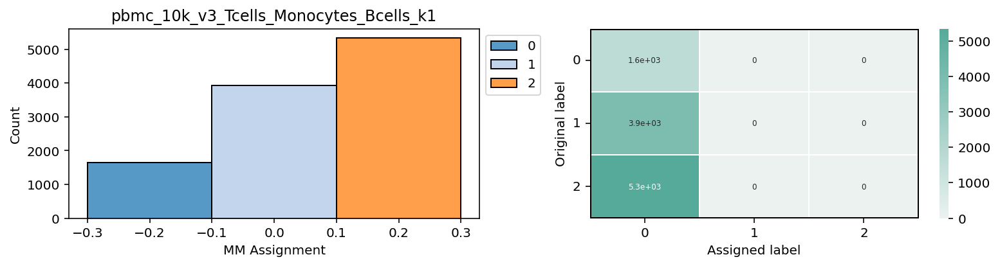

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


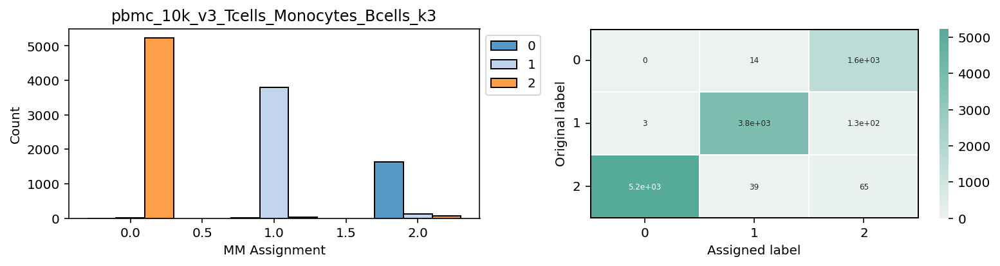

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(5, 5)
(5, 5)


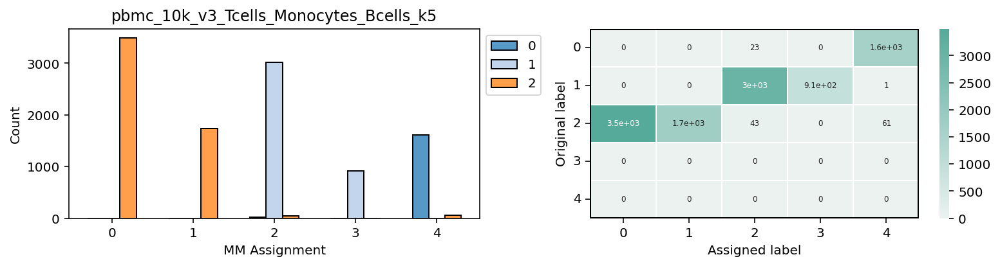

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)


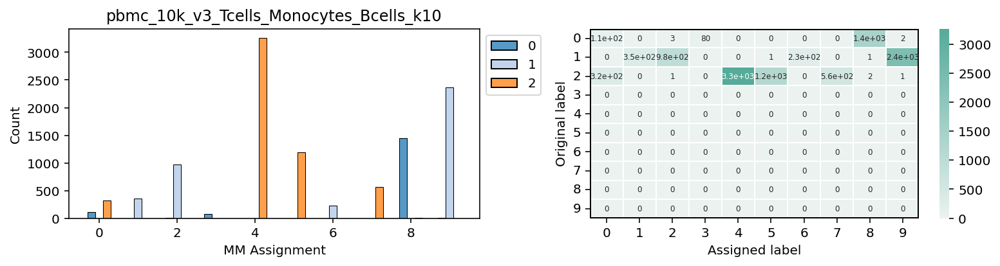

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)
(10, 10)


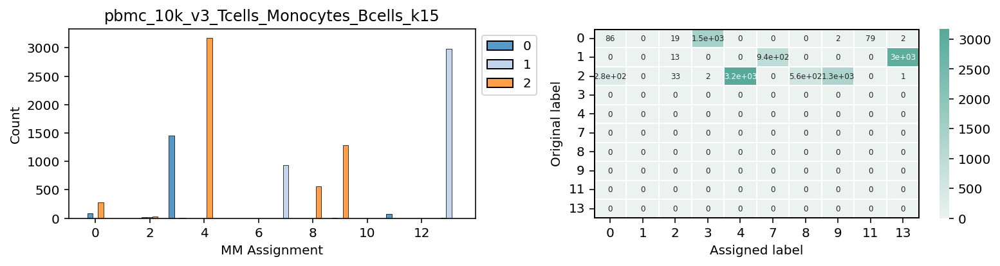

In [114]:
for i in range(len(grid_point_results)):
    r = grid_point_results[i]
    title = r.inference_string.replace('./fits/gg_230501_025_pbmc_MM_1/','') #g_230426_025_pbmc_MM_1
    title = title.replace('/Bursty_Poisson_1x1','')
    vis_assign(np.array(new_assigns),r.assigns,title,figsize=(11,3))


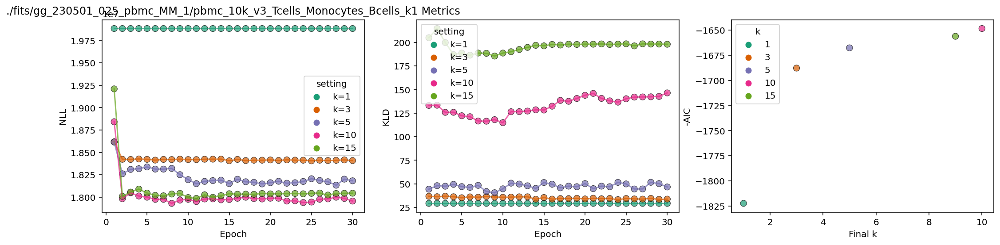

In [54]:
for i in range(0, len(grid_point_results), num_ks):
    r = grid_point_results[i:i+num_ks]
    title = dataset_strings[i]+' Metrics'
    vis_metrics(r,title,ks[0:num_ks],figsize=(18,4))

Compare cluster assignments to k-means/Leiden assignments

In [71]:
for i in range(len(grid_point_results)):
    r = grid_point_results[i]
    all_groups_kmeans += [r.assigns]



In [72]:
for i in range(len(grid_point_results)):
    r = grid_point_results[i]
    all_groups += [r.assigns]



In [73]:
len(all_groups_kmeans)

20

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see ht

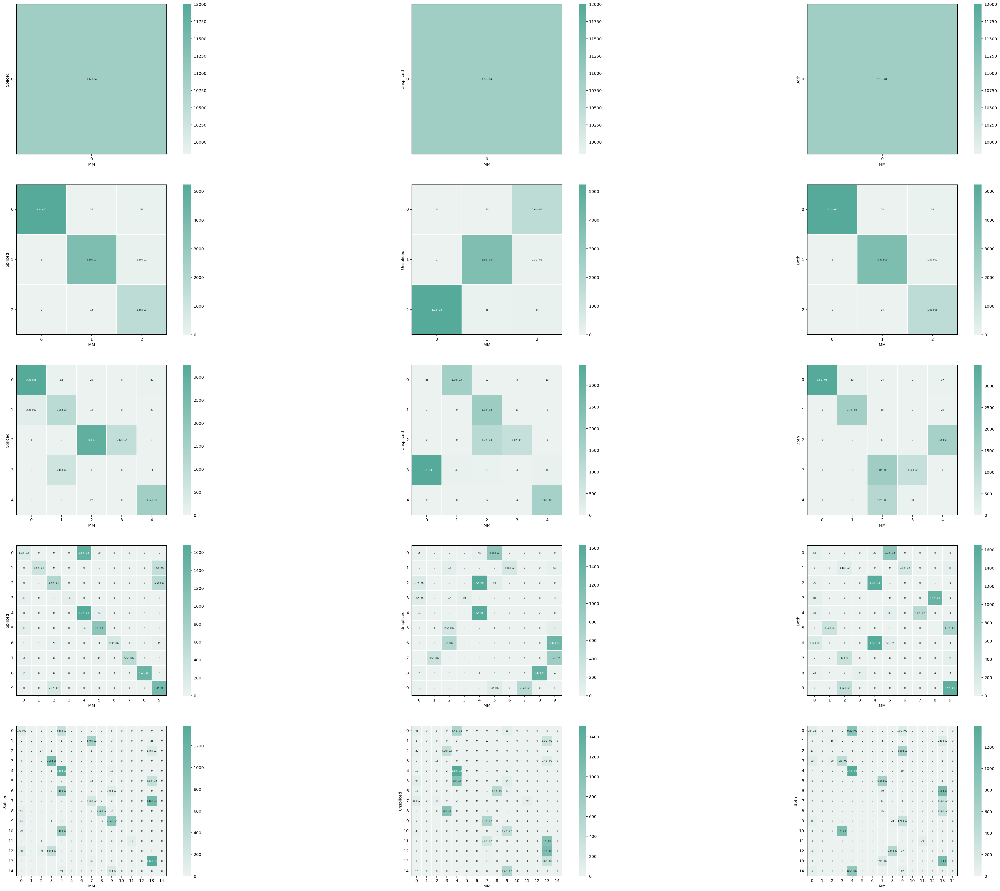

In [75]:
#Compare assignments to k-means inits
#compare overlap of all k-means assignments

num_per_set = num_ks

pairs = [(0,3),(1,3),(2,3)]
labs = [('Spliced','MM'),('Unspliced','MM'),('Both','MM')]
#Plot confmats
fig, ax = plt.subplots(nrows=num_per_set, ncols=len(pairs), figsize=(50,40))
    
for i in range(0,num_per_set):
    
    for j in range(len(pairs)):
        
        p = pairs[j]
        
        assign = all_groups_kmeans[p[1]*(num_per_set)+i]
        true = all_groups_kmeans[p[0]*(num_per_set)+i]

        true_copy = list(true)
        assign_copy = list(assign)

        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    true_copy += [a]
                    assign_copy += [a]


        conmat = confusion_matrix(true_copy, assign_copy)
        val = np.mat(conmat) 
        classnames = list(set(true_copy))
        df_cm = pd.DataFrame(

                val, index=classnames, columns=classnames, 

            )


        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    print(df_cm.shape)
                    df_cm.loc[a,a] = df_cm.loc[a,a]-1


#         heatmap = sns.heatmap(df_cm, annot=True, 
#                               cmap=sns.color_palette("light:#5A9", as_cmap=True),ax=ax[i,j])
#         heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
#         heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)

#         ax[i,j].set_ylabel(labs[j][0])
#         ax[i,j].set_xlabel(labs[j][1])
        
        
        heatmap = sns.heatmap(df_cm, annot=True, cmap=sns.color_palette("light:#5A9", as_cmap=True),
                          ax=ax[i,j],linewidths=1, cbar_kws={"shrink": 1},square=True,
                         annot_kws={"size":6}) #norm=LogNorm()
        heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
        heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)

        heatmap.axhline(y=0, color='k',linewidth=2)
        heatmap.axhline(y=val.shape[1], color='k',linewidth=2)
        heatmap.axvline(x=0, color='k',linewidth=2)
        heatmap.axvline(x=val.shape[0], color='k',linewidth=2)

        ax[i,j].set_ylabel(labs[j][0])
        ax[i,j].set_xlabel(labs[j][1])

    
plt.show()


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see ht

(13, 13)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(14, 14)


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:69: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(13, 13)


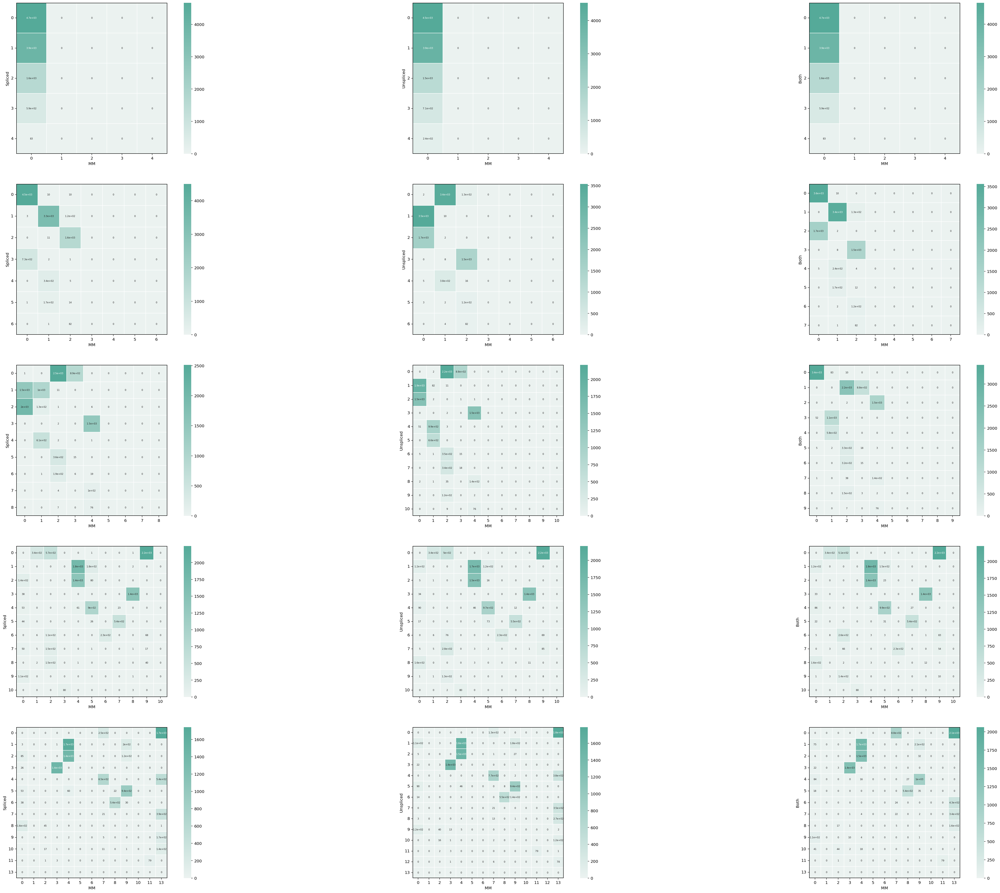

In [77]:
#Compare assignments to Leiden assigns
num_per_set = num_ks

pairs = [(0,3),(1,3),(2,3)]
labs = [('Spliced','MM'),('Unspliced','MM'),('Both','MM')]
#Plot confmats
fig, ax = plt.subplots(nrows=num_per_set, ncols=len(pairs), figsize=(50,40))
    
for i in range(0,num_per_set):
    
    for j in range(len(pairs)):
        
        p = pairs[j]
        
        assign = all_groups[p[1]*(num_per_set)+i]
        true = all_groups[p[0]*(num_per_set)+i]

        true_copy = list(true)
        assign_copy = list(assign)

        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    true_copy += [a]
                    assign_copy += [a]


        conmat = confusion_matrix(true_copy, assign_copy)
        val = np.mat(conmat) 
        classnames = list(set(true_copy))
        df_cm = pd.DataFrame(

                val, index=classnames, columns=classnames, 

            )


        if np.max(assign) > np.max(true): #FIX
            for a in np.unique(assign):
                if a > np.max(true):
                    print(df_cm.shape)
                    df_cm.loc[a,a] = df_cm.loc[a,a]-1


        heatmap = sns.heatmap(df_cm, annot=True, cmap=sns.color_palette("light:#5A9", as_cmap=True),
                          ax=ax[i,j],linewidths=1, cbar_kws={"shrink": 1},square=True,
                         annot_kws={"size":6}) #norm=LogNorm()
        heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right')
        heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0)

        heatmap.axhline(y=0, color='k',linewidth=2)
        heatmap.axhline(y=val.shape[1], color='k',linewidth=2)
        heatmap.axvline(x=0, color='k',linewidth=2)
        heatmap.axvline(x=val.shape[0], color='k',linewidth=2)

        ax[i,j].set_ylabel(labs[j][0])
        ax[i,j].set_xlabel(labs[j][1])
    
plt.show()


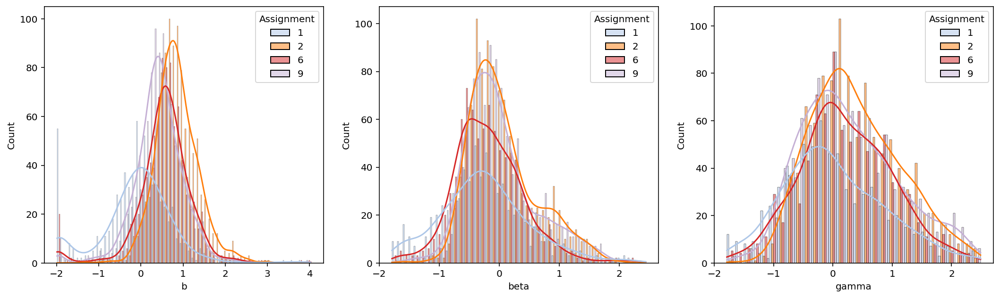

In [753]:
res = vis_params(grid_point_results[-2].param_estimates,assigns_toplot = [1,2,6,9],title='')

**Check marker gene expression for 'type' assignment**

In [626]:
full_annots = pd.read_csv('/home/tchari/metadata/pbmc_markers_merchan.txt',sep='\t',header=None)
full_annots.head()

,0,1
0,"AXL+, SIGLEC6+ dendritic cell","COQ7,CDKN1A,NDRG1,BAIAP2,PIM2,PLAAT3,KLF12,MGL..."
1,Activated B cell,"KRT20,CD19,MS4A1,CD27"
2,"Activated CD4-positive, alpha-beta T cell",IL-7R
3,Activated T cell,"CD38,ICOS,HLA-DRA,IL2RA,ISG20,PRF1,CD3D"
4,Activated effector memory T cell,"CXCR6,CCR4,BTLA,ICOS,TBX21,GZMA,HLA-DRA,HLA-DR..."


In [627]:
check_names = search_data.gene_names

all_annots = []
for n in check_names:
    annots = []
    for i in range(len(full_annots[1])):
        
        if n in full_annots[1][i]:
            annots += [full_annots[0][i]]
    all_annots += [annots]
            
name_annot_dict = dict(zip(check_names,all_annots))
        

In [628]:
inds = []
for i in range(len(all_annots)):
    if len(all_annots[i])<4:
        #if all_annots[i] == ['B cell'] or all_annots[i] == ['Myeloid cell'] or all_annots[i] == ['T cell']:
        inds += [i]
len(inds)

1000

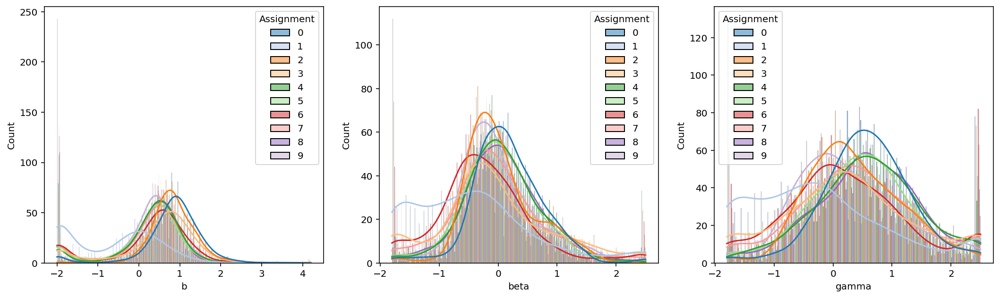

In [629]:
res = vis_params(grid_point_results[-2].param_estimates,assigns_toplot = list(range(10)),title='',to_filt=False)

In [630]:
len(check_names)

1082

In [631]:
# toplot_marks = ['CD300E','FCGR2B','CD40',
#                 'CD69','MS4A1','CD79A','PTPRC',
#                 'CD3D','IL7R','LEF1','TRAC','CD4','CD3D', 'CD3G','CD3E','CD247','CD2','TCF7','CD4','CD69','CCL5',
#       'CD93','CSTA','FPR1','CD14','CD36',
#       'CD79A','CD22','BLK','IGHD','VPREB3','CD28','IRF4','CCR6','GATA3','IL2RA','FOXP1','CD38',
#                'CX3CR1','CD86','ADGRE1','CD33','CD64'] + ['CD14','FCGR3A','FCGR3B','CCR2','CCR5','CCR7',
# 'CD69','ITGAE','CTLA4','NCAM1','FOXP3','STAT4', 'TCF7','IL26',
# 'IL22','IL13','KLRB1','CXCR3','CD38',
# 'CLEC9A','ITGAX','XCR1','CD1C','CD207','ITGAM', 'NOTCH2',
# 'BATF3','CCR7','CD8A','CD8B',
# 'BCL2','BCL6','CD5','CD27','CD79B','SDC1','TLR9','XBP1','GZMB','IL3RA','CD74',
# 'IL7R', 'CCR7','LYZ','S100A4','GNLY', 'NKG7','FCER1A', 'CST3','PPBP','PF4']

toplot_marks = ['CD300E','CD40',
                'CD69','MS4A1',
                'CD3D','IL7R','LEF1','CD4','CD3D',
      'CD14','CD36',
               'CX3CR1','CD86','ADGRE1','CD33','CD64'] + ['CD14','FCGR3A','FCGR3B','CCR2','CCR5','CCR7',
'FOXP3',
'IL7R', 'CCR7','S100A4','GNLY', 'NKG7','FCER1A', 'CST3','CD86','IL13RA1','IL3RA','CST3','GZMB']


toplot_marks = np.unique(toplot_marks)

In [632]:
inds = [list(check_names).index(i) for i in toplot_marks if i in check_names]

In [633]:
toshape = np.array(res['b']-res['gamma'])
toshape = toshape.reshape([10,1082])
toshape.shape

toshape = toshape[:,inds]


In [634]:
df = pd.DataFrame(np.log1p(10**(toshape.T)))
df.index = check_names[inds]


df.head()

,0,1,2,3,4,5,6,7,8,9
ADGRE1,0.169343,0.210546,1.101859,0.005744,0.103760,0.009283,1.872190,0.000032,0.011753,0.922660
CCR7,1.874816,0.065200,0.585418,0.469889,1.838676,0.286237,0.000032,0.103277,1.125753,0.054314
CD300E,0.143520,1.568353,2.735230,0.129502,0.085983,0.115514,2.500766,0.111622,0.066552,2.289547
CD36,0.353245,2.265892,3.335524,2.158412,0.140616,0.179328,1.202006,0.197118,0.179049,3.162465
CD3D,3.386649,0.160244,1.498522,0.895393,2.990434,2.898041,0.136724,1.193660,0.157815,0.347943


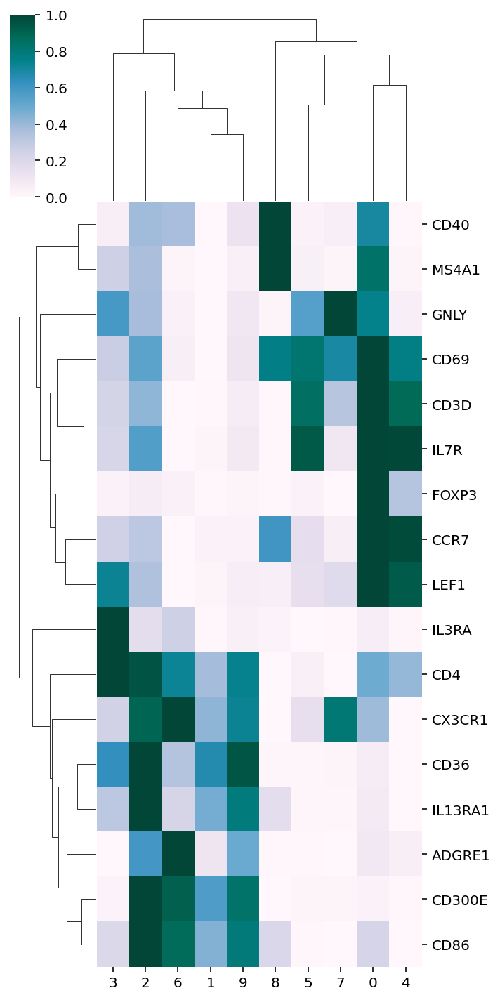

In [636]:
sns.clustermap(df,figsize=(5,10),standard_scale=0,cmap="PuBuGn")

In [637]:
# toshape = -1*np.array(res['beta'])
# toshape = toshape.reshape([10,1082])
# toshape.shape

# toshape = toshape[:,inds]

# df = pd.DataFrame(np.log1p(10**(toshape.T)))
# df.index = check_names[inds]


# df.head()


In [638]:
# sns.clustermap(df,figsize=(10,20),standard_scale=0)

Compare with results from true spliced counts

In [619]:
# Plot clusters with raw counts, pre-gene filter
#Remove BLK, FCGR3B, XCR1,BCL6,SDC1,CD207,IL22,CCR5,IL13,IL26,CTLA4
toplot_marks = ['CD300E','FCGR2B','CD40',
                'CD69','MS4A1','CD79A','PTPRC',
                'CD3D','IL7R','LEF1','TRAC','CD4','CD3D', 'CD3G','CD3E','CD247','CD2','TCF7','CD4','CD69','CCL5',
      'CD93','CSTA','FPR1','CD14','CD36',
      'CD79A','CD22','IGHD','VPREB3','CD28','IRF4','CCR6','GATA3','IL2RA','FOXP1','CD38',
               'CX3CR1','CD86','ADGRE1','CD33','CD64'] + ['CD14','FCGR3A','CCR2','CCR7',
'CD69','ITGAE','NCAM1','FOXP3','STAT4', 'TCF7',
'KLRB1','CXCR3','CD38',
'CLEC9A','ITGAX','CD1C','ITGAM', 'NOTCH2',
'BATF3','CCR7','CD8A','CD8B',
'BCL2','CD5','CD27','CD79B','TLR9','XBP1','GZMB','IL3RA','CD74',
'IL7R', 'CCR7','LYZ','S100A4','GNLY', 'NKG7','FCER1A', 'CST3','PPBP','PF4']

In [620]:
inds = [list(g_names).index(i) for i in np.unique(toplot_marks) if i in g_names]

In [621]:
#Mean per gene for all genes before filtering
raw_clus = s[:,cf[0]].T
print(raw_clus.shape)

tots = np.sum(raw_clus,axis=1)
divids = (1e4/tots)[:,None]
raw_clus = raw_clus*divids
# raw_clus = np.log1p(raw_clus)
print(raw_clus.shape)

assigned = np.unique(grid_point_results[-2].assigns)
mean_g = np.zeros((len(assigned),raw_clus.shape[1]))

for i in range(len(assigned)):
    f = grid_point_results[-2].assigns == assigned[i]
    
    mean_g[i,:] = np.mean(raw_clus[f,:],axis=0)

(10913, 36601)
(10913, 36601)


In [320]:
#beta and gamma decrease --> burst frequency

Quick check of fold changes in params for cell state markers

In [88]:
print(grid_point_results[-2].param_estimates[list(check_names).index('CD4'),:,5])
print(grid_point_results[-2].param_estimates[list(check_names).index('CD4'),:,4])

[0.94235333 1.19613122 1.61868979]
[ 0.85001414 -0.05077839  0.49017717]


In [272]:
precheck = ['FOXP3','CCR7','CD4','CD8A','CD86','CX3CR1','CD40','IL13RA1','GNLY','MS4A1','IL3RA'] #'CCR2','FCGR3A'
cluscheck = 6
opp = 9

In [273]:
for i in precheck:
    logfc = np.log2(10**(grid_point_results[-2].param_estimates[list(check_names).index(i),:,cluscheck]-grid_point_results[-2].param_estimates[list(check_names).index(i),:,opp]))
    print(i+': '+str(logfc))

FOXP3: [-8.74839687 -8.37407627 -9.49435879]
CCR7: [-9.93280832  1.25359351  0.85268913]
CD4: [ 0.68914657 -0.3180662   0.74610672]
CD8A: [-0.03205704 11.35504556 11.68928535]
CD86: [1.72338992 0.60043671 1.41738632]
CX3CR1: [ 1.44752139 -1.38283054  0.28883981]
CD40: [ 1.14804988 -0.21497959 -0.44866425]
IL13RA1: [-0.08052921  1.93483561  2.76170769]
GNLY: [-10.0983758   -8.9451136   -9.11447931]
MS4A1: [-0.02694193 10.79086458  0.62523605]
IL3RA: [ 0.60410971 -0.30719246 -2.15214418]


In [275]:
for i in precheck:
    meanfc = np.log2(mean_g[cluscheck,list(g_names).index(i)]/mean_g[opp,list(g_names).index(i)])
    print(i+': '+str(meanfc))

FOXP3: -0.45965273742384927
CCR7: -inf
CD4: 0.9869548675518569
CD8A: -inf
CD86: 1.1830653788630507
CX3CR1: 2.630101827448259
CD40: 1.288808518344855
IL13RA1: -1.9698474435042488
GNLY: -1.1758597763720988
MS4A1: -inf
IL3RA: 0.9226805480512614


/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log2
  


In [622]:

df = pd.DataFrame(np.log10(mean_g[:,inds].T+1))
df.index = g_names[inds]


df.head()

,0,1,2,3,4,5,6,7,8,9
ADGRE1,0.017494,0.065207,0.111254,0.000000,0.017913,0.002014,0.340787,0.000000,0.001491,0.137233
BATF3,0.005529,0.017237,0.099903,0.000000,0.004035,0.004149,0.280121,0.008998,0.001721,0.034857
BCL2,0.231173,0.026424,0.066651,0.030130,0.289685,0.252618,0.003324,0.099529,0.219965,0.019817
CCL5,0.023055,0.000000,0.004960,0.000000,0.012912,0.088372,0.001593,0.107039,0.000879,0.000622
CCR2,0.028907,0.227886,0.227433,0.325073,0.018445,0.089652,0.000000,0.010416,0.004869,0.257269


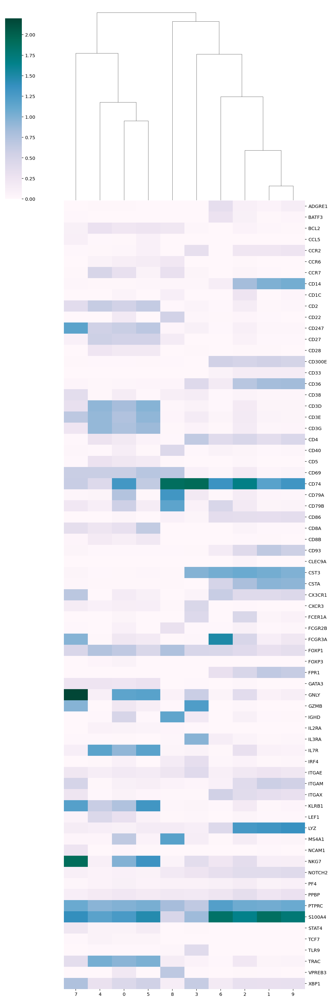

In [624]:
sns.clustermap(df,figsize=(10,30),cmap="PuBuGn",row_cluster=False) 
#Genes used in above heatmaps denoted here

### **Look at Param/Mean Recapitulation**

In [95]:
def check_at_bounds(phys_params,thr=0.01):
    #Check for genes where parameter fits are close to boundary of grid
    x = np.any(np.logical_or(
        np.array(phys_lb)+thr > phys_params,
        np.array(phys_ub)-thr < phys_params) ,1)
    return x

In [96]:
#Plot parameter distributions vs monod param fits
def plot_params(sr,grid_point_results,res_inds=[0,0],clus_inds=[0,0],figsize=(18,18)):
    #FILT FOR NEAR BOUNDS!!
    tab_blue = '#1f77b4'
    tab_orange = '#ff7f0e'
    tab_green = '#2ca02c'
    
    b_sim_monod = sr[res_inds[0]].param_estimates[clus_inds[0]]
    b_sim_mm = grid_point_results[res_inds[1]].param_estimates[:,:,clus_inds[1]]
    
    filt = ~check_at_bounds(b_sim_mm ,thr=0.01)

    n_genes = sr[res_inds[0]].n_genes
    
    rho =[]
    p = []   
    
    

    comps = pd.DataFrame()
    comps['b'] = list(b_sim_monod[filt,0])+list(b_sim_mm[filt,0])
    comps['beta'] = list(b_sim_monod[filt,1])+list(b_sim_mm[filt,1])
    comps['gamma'] = list(b_sim_monod[filt,2])+list(b_sim_mm[filt,2])
    comps['setting'] = ['Monod']*(np.sum(filt)) + ['MM']*(np.sum(filt))

    palette = {'Monod':tab_blue,'MM':tab_green }

    #Plot param histograms
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=figsize)

    #b,beta,gamma histograms
    g=sns.histplot(data=comps,x='b',hue='setting',kde=True,ax=ax[0,0],palette=palette)
    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))
    g2=sns.histplot(data=comps,x='beta',hue='setting',kde=True,ax=ax[0,1],palette=palette)
    sns.move_legend(g2, "upper left", bbox_to_anchor=(1, 1))
    g3=sns.histplot(data=comps,x='gamma',hue='setting',kde=True,ax=ax[0,2],palette=palette)
    sns.move_legend(g3, "upper left", bbox_to_anchor=(1, 1))
    



    #Plot correlations
    comps_monod = comps[comps.setting.isin(['Monod'])]
    comps_mm = comps[comps.setting.isin(['MM'])]
    


    #monod v mm
    g4=sns.scatterplot(x=list(comps_monod['b']),y=list(comps_mm['b']),hue=list(comps_monod['b']),
                    s=50,edgecolor='black',color='cornflowerblue', alpha=0.7,ax=ax[1,0])
    sns.move_legend(g4, "upper left", bbox_to_anchor=(1, 1))
    #ax[2,0].text(x=-1, y=2, s=np.corrcoef(list(comps_monod['b']),list(comps_mm['b']))[0,1])
    
    rho += [np.corrcoef(list(comps_monod['b']),list(comps_mm['b']))[0,1]]
    p += [scipy.stats.spearmanr(list(comps_monod['b']),list(comps_mm['b']))[0]]
    

    sns.scatterplot(x=list(comps_monod['beta']),y=list(comps_mm['beta']),hue=list(comps_monod['b']),
                    s=50,edgecolor='black',color='cornflowerblue', alpha=0.7,ax=ax[1,1],legend=False)
   
    #ax[2,1].text(x=-1, y=0.5, s=np.corrcoef(list(comps_monod['beta']),list(comps_mm['beta']))[0,1])
    rho += [np.corrcoef(list(comps_monod['beta']),list(comps_mm['beta']))[0,1]]
    p += [scipy.stats.spearmanr(list(comps_monod['beta']),list(comps_mm['beta']))[0]]


    sns.scatterplot(x=list(comps_monod['gamma']),y=list(comps_mm['gamma']),hue=list(comps_monod['b']),
                    s=50,edgecolor='black',color='cornflowerblue', alpha=0.7,ax=ax[1,2],legend=False)
    
    #ax[2,2].text(x=-1, y=0.5, s=np.corrcoef(list(comps_monod['gamma']),list(comps_mm['gamma']))[0,1])
    rho += [np.corrcoef(list(comps_monod['gamma']),list(comps_mm['gamma']))[0,1]]
    p += [scipy.stats.spearmanr(list(comps_monod['gamma']),list(comps_mm['gamma']))[0]]
    
    ax[1,0].set_xlabel('Monod')
    ax[1,0].set_ylabel('MM')


    
    
    
    for i, a in enumerate(ax.flat):

        if i not in [0,1,2]:
            bot,top = a.get_ylim()
            l,r = a.get_xlim()

            newl = np.min([bot,l])
            newr = np.max([top,r])

            a.set_xlim((newl,newr))
            a.set_ylim((newl,newr))
            
            a.text(.05,.7,r'$r$ = {:.2f}'.format(rho[i-3]),fontsize=14,transform=a.transAxes)
            a.text(.05,.8,r'$\rho$ = {:.2f}'.format(p[i-3]),fontsize=14,transform=a.transAxes)
            
            a.plot(a.get_xlim(),a.get_xlim(),'--',color=[116/255,112/255,113/255],linewidth=3,alpha=0.4)
        
        
    plt.tight_layout()
    
    plt.show()

In [97]:
#Plot correlation of inferred means to observed means
def plot_means(sd,grid_point_results,res_inds=[0,0],clus_inds=[0,0],figsize=(18,18)):
    
    true_s = sd[res_inds[0]].layers[1,:,:] #gene x cell
    true_u = sd[res_inds[0]].layers[0,:,:]
    mean_s = np.mean(true_s,axis=1)
    mean_u = np.mean(true_u,axis=1)
    print(mean_u.shape)

    mm = grid_point_results[res_inds[1]].param_estimates[:,:,clus_inds[1]] #genes x params
    
    filt = ~check_at_bounds(mm,thr=0.01)
    
    mm_u = (mm[:,0]+(samp_ub[0]+sd[res_inds[0]].gene_log_lengths))-mm[:,1]
    mm_s = (mm[:,0]+samp_ub[1])-mm[:,2]
    print(mm_s.shape)


    
    #gene_log_lengths, samp_ub[0], samp_ub[1], (samp_ub[0]) + np.log10(g_len)
    
    rho =[]
    p = []   
    
    #Plot param histograms
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    
    g=sns.scatterplot(x=list(mean_u[filt & (mean_u!=0)]),y=list(10**mm_u[filt & (mean_u!=0)]),hue=list(mean_u[filt & (mean_u!=0)]),
                    s=50,edgecolor='black',color='cornflowerblue', alpha=0.7,ax=ax[0])
    #ax[2,0].text(x=-1, y=2, s=np.corrcoef(list(comps_monod['b']),list(comps_mm['b']))[0,1])
    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))
    
    rho += [np.corrcoef(list(np.log(mean_u[filt & (mean_u!=0)])),list(np.log(10**mm_u[filt & (mean_u!=0)])))[0,1]]
    p += [scipy.stats.spearmanr(list(mean_u[filt & (mean_u!=0)]),list(10**mm_u[filt & (mean_u!=0)]))[0]]
    
    ax[0].set_xlabel('Obs '+r'$\mu_U$')
    ax[0].set_ylabel('MM '+r'$\mu_U$')
    ax[0].set_xscale('log')
    ax[0].set_yscale('log')

    
    
    g2=sns.scatterplot(x=list(mean_s[filt & (mean_s!=0)]),y=list(10**mm_s[filt & (mean_s!=0)]),hue=list(mean_s[filt & (mean_s!=0)]),
                    s=50,edgecolor='black',color='cornflowerblue', alpha=0.7,ax=ax[1])
    #ax[2,0].text(x=-1, y=2, s=np.corrcoef(list(comps_monod['b']),list(comps_mm['b']))[0,1])
    sns.move_legend(g2, "upper left", bbox_to_anchor=(1, 1))
    
    rho += [np.corrcoef(list(np.log(mean_s[filt & (mean_s!=0)])),list(np.log(10**mm_s[filt & (mean_s!=0)])))[0,1]]
    p += [scipy.stats.spearmanr(list(mean_s[filt & (mean_s!=0)]),list(10**mm_s[filt & (mean_s!=0)]))[0]]
    
    ax[1].set_xlabel('Obs '+r'$\mu_S$')
    ax[1].set_ylabel('MM '+r'$\mu_S$')
    ax[1].set_xscale('log')
    ax[1].set_yscale('log')
    
    for i, a in enumerate(ax.flat):

       
        bot,top = a.get_ylim()
        l,r = a.get_xlim()

        newl = np.min([bot,l])
        newr = np.max([top,r])

        a.set_xlim((newl,newr))
        a.set_ylim((newl,newr))

        a.text(.05,.7,r'$r$ = {:.2f}'.format(rho[i]),fontsize=14,transform=a.transAxes)
        a.text(.05,.8,r'$\rho$ = {:.2f}'.format(p[i]),fontsize=14,transform=a.transAxes)

        a.plot(a.get_xlim(),a.get_xlim(),'--',color=[116/255,112/255,113/255],linewidth=3,alpha=0.4)

        
    plt.tight_layout()
    plt.show()

    
    

In [832]:
dataset_names

['pbmc_10k_v3_Tcells_Monocytes_Bcells_k1',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k3',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k5',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k10',
 'pbmc_10k_v3_Tcells_Monocytes_Bcells_k15',
 'pbmc_10k_v3_Tcells',
 'pbmc_10k_v3_Monocytes',
 'pbmc_10k_v3_Bcells']

(1082,)
(1082,)


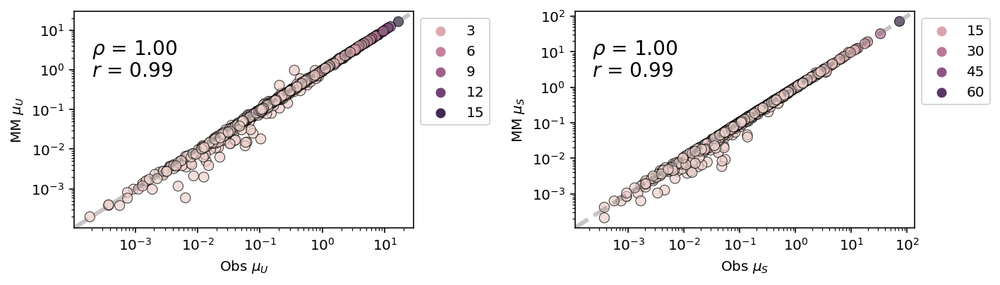

(1082,)
(1082,)


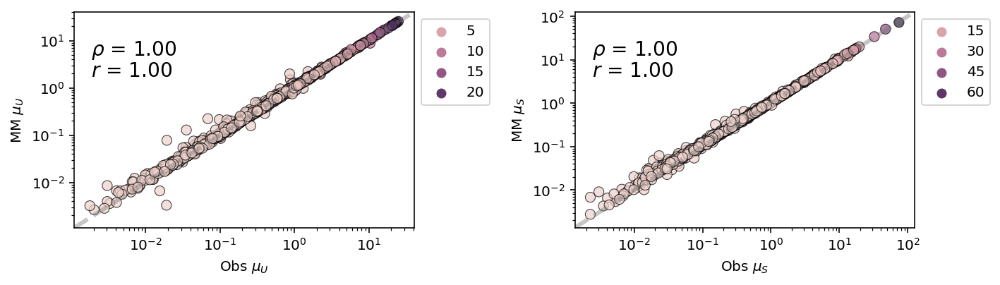

(1082,)
(1082,)


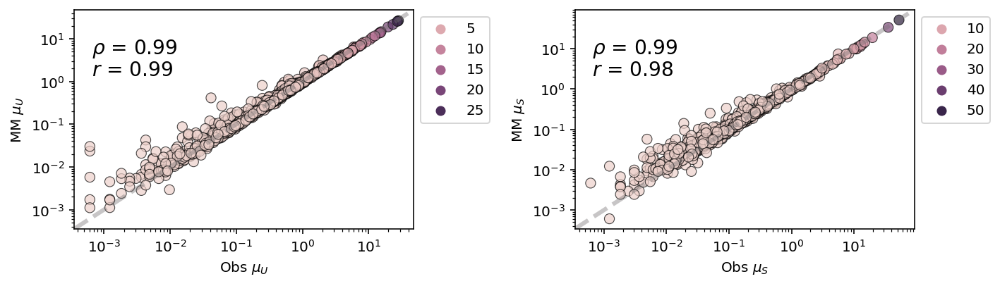

In [99]:
pairs = [(0,0),(1,1),(2,2)] #0-T,1-M,2-B in k=3 MM fits
for p in pairs:
    plot_means(sd,grid_point_results,res_inds=[p[0],1],clus_inds=[0,p[1]],figsize=(10,3))

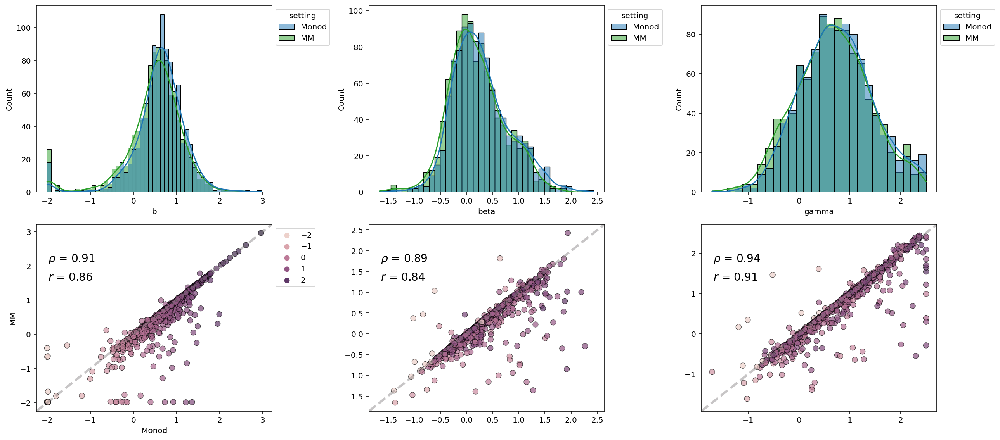

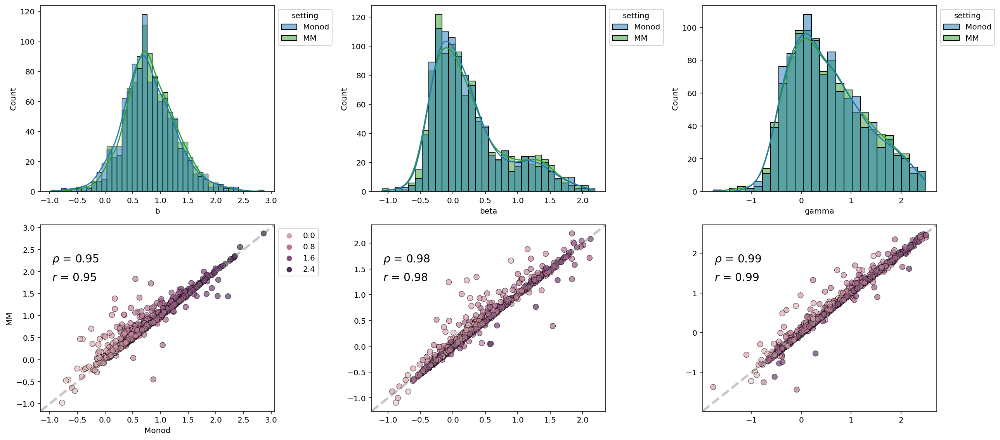

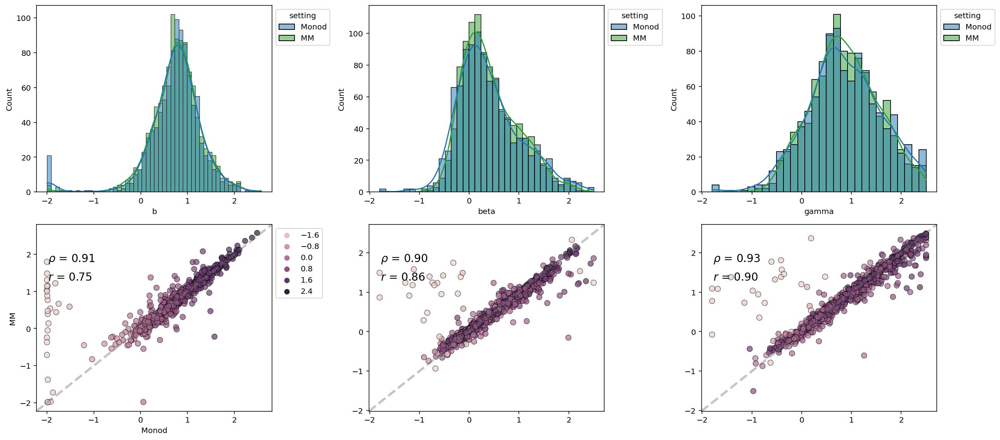

In [100]:
for p in pairs:
    plot_params(sr,grid_point_results,res_inds=[p[0],1],clus_inds=[0,p[1]],figsize=(18,8))

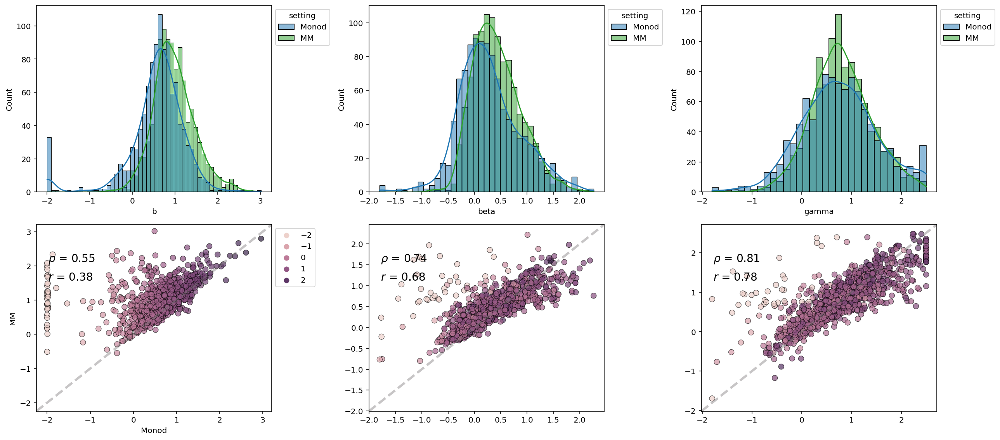

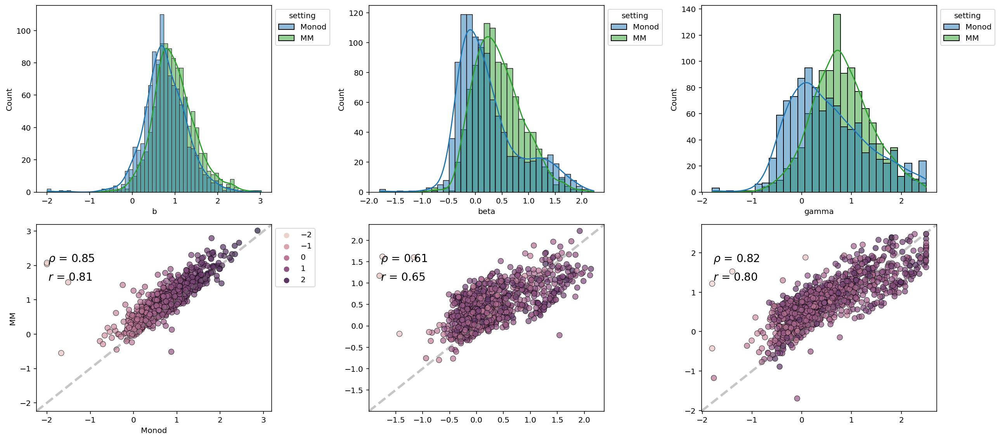

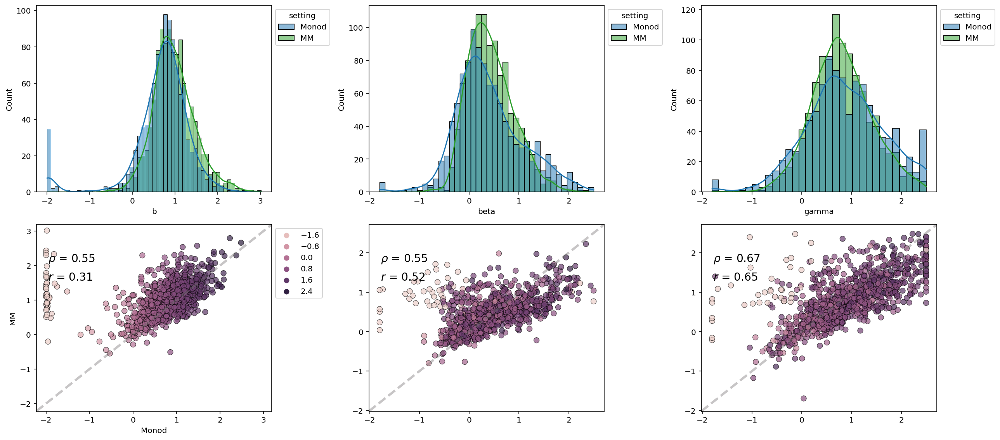

In [101]:
#compare to single-clus (k=0)
for p in pairs:
    plot_params(sr,grid_point_results,res_inds=[p[0],0],clus_inds=[0,0],figsize=(18,8))

### **Find Parameter-DE Genes for k=3 meK-Means Results**

i.e. genes 'DE' in any parameter

In [211]:
c_genes = 'dimgrey'
alpha_genes = 0.1
c_highlight = 'lightcoral'
c_smean_highlight = 'lightseagreen'
alpha_highlight = 0.7
c_baseline = np.asarray([9,160,115])/255
c_singlegene = 'dodgerblue'
ms_genes = 20
ms_highlight = 50
fs_axes = 12
fs_title=14
alpha_line = 0.48
lw = 3
c_baseline_violation = 'blueviolet'
c_identity = 'k'

col_all_par = '#4472C4'
col_b = '#1B9AAA'
col_beta = '#9fcbee'
col_gamma ='#3C50B1'
col_expr = '#9299A0'



In [212]:
#Cell cluster colors
#Bcells': 0, 'Monocytes': 1, 'Tcells':
assign_colors = {'Bcells':'#3274A1','Monocytes':'#B5C8E1','Tcells':'#E1812C','None':'lightgrey'}

In [213]:
assign_dict

{'Bcells': 0, 'Monocytes': 1, 'Tcells': 2}

In [214]:
res_to_use = grid_point_results[1] #params: gene x param x k
mm_dict = {'Bcells': 2, 'Monocytes': 1, 'Tcells': 0 }

In [215]:
par_vals = res_to_use.param_estimates

In [216]:
gf_rej = ~check_at_bounds(par_vals[:,:,2],thr=0.03) & ~check_at_bounds(par_vals[:,:,1],thr=0.03) & ~check_at_bounds(par_vals[:,:,0],thr=0.03)


**Tcells vs other cell types**

In [226]:
thrpars = 2
thrmean = 1

In [227]:
mm_dict

{'Bcells': 2, 'Monocytes': 1, 'Tcells': 0}

In [228]:
k_inds = [[0,1],[0,2]]
sd_inds = [[0,1],[0,2]]
name_inds = [['Tcells','Monocytes'],['Tcells','Bcells']]


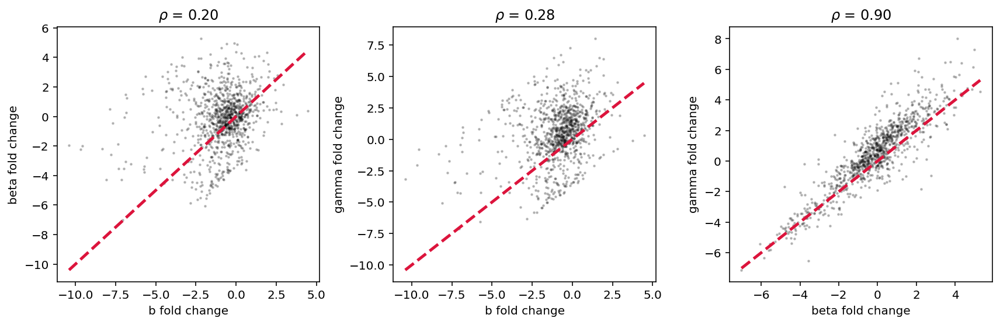

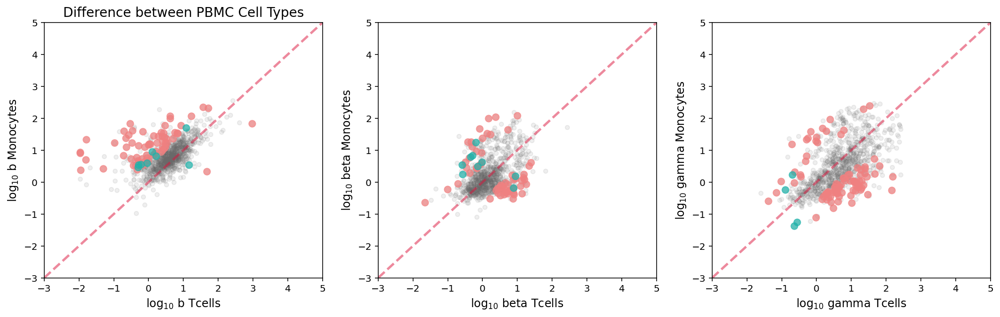

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in true_divide
  if sys.path[0] == '':


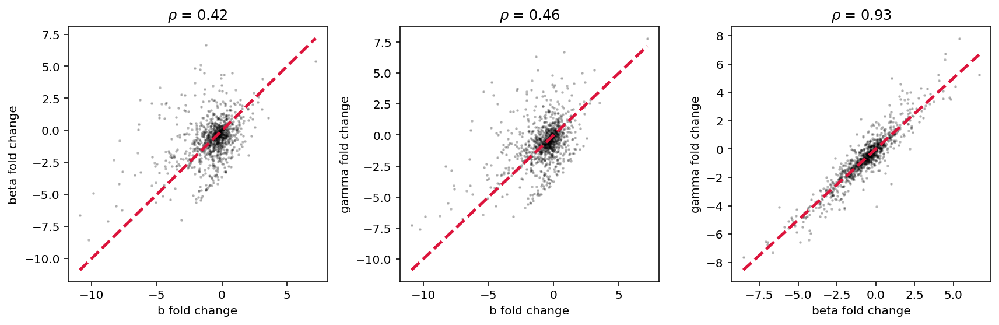

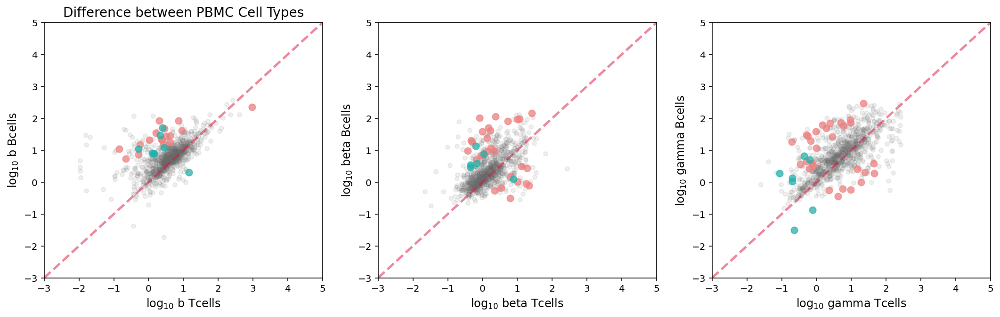

,log2FC,gene,pair,highFC,noSpliceFC,param
0,-1.100247,SPATA5,"[Tcells, Monocytes]",False,False,b
1,-0.182987,TMPO,"[Tcells, Monocytes]",False,False,b
2,-0.893163,CEP170,"[Tcells, Monocytes]",False,False,b
3,-5.236885,ADGRE2,"[Tcells, Monocytes]",False,False,b
4,1.496231,MIS18A,"[Tcells, Monocytes]",False,False,b


In [229]:
all_filt_fcs = pd.DataFrame()
fcs = []
types = []
which_pair = []
highFC = []
spliceFC = []
g_names = []

for K in range(len(k_inds)):

    fc_par = ((par_vals[:,:,k_inds[K][0]]-par_vals[:,:,k_inds[K][1]])/np.log10(2))
    fc_s_par = np.log2(sd[sd_inds[K][0]].layers[1].mean(1)/sd[sd_inds[K][1]].layers[1].mean(1))
    
    fig1,ax1 = plt.subplots(1,3,figsize=(12,4))
    pairs = [[0,1],[0,2],[1,2]]
    parnames = ('b','beta','gamma')
    for j,pair in enumerate(pairs):
        x = fc_par[gf_rej,pair[0]]
        y = fc_par[gf_rej,pair[1]]
        rho = np.corrcoef(x,y)[0,1]
        ax1[j].scatter(x,y,2,'k',alpha=0.2)
        xl = np.linspace(min(x),max(x))
        ax1[j].plot(xl,xl,'--',color='crimson',linewidth=2.5)
        ax1[j].set_xlabel(parnames[pair[0]] + ' fold change')
        ax1[j].set_ylabel(parnames[pair[1]] + ' fold change')
        ax1[j].set_title(r'$\rho$ = '+'{:.2f}'.format(rho))
    fig1.tight_layout()
    
    
    
    deltaB = fc_par[:,0]
    deltaBeta = fc_par[:,1]
    deltaGamma = fc_par[:,2]

    
    fig2,ax2 = plt.subplots(1,3,figsize=(18,5))
    gf_highnoise = (np.abs(deltaB)>thrpars)  \
        & ((sd[sd_inds[K][0]].layers[1].mean(1)>thrmean) | (sd[sd_inds[K][1]].layers[1].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    #For dataframe
    fcs += list(deltaB[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['b']*np.sum(gf_rej)
    
    
    
    #Burst size
    ax2[0].scatter(par_vals[gf_rej,0,k_inds[K][0]],par_vals[gf_rej,0,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[0].scatter(par_vals[gf_onlyhigh,0,k_inds[K][0]],par_vals[gf_onlyhigh,0,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[0].scatter(par_vals[gf_highnoise_meanS,0,k_inds[K][0]],par_vals[gf_highnoise_meanS,0,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[0].set_xlim(xlx)
    ax2[0].set_ylim(xly)

    ax2[0].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[0].set_xlabel(r'$\log_{10}$ b '+name_inds[K][0],fontsize=fs_axes)
    ax2[0].set_ylabel(r'$\log_{10}$ b '+name_inds[K][1],fontsize=fs_axes)
    ax2[0].set_title('Difference between PBMC Cell Types',fontsize=fs_title)
    
    
    #Beta fc
    gf_highnoise = (np.abs(deltaBeta)>thrpars)  \
        & ((sd[sd_inds[K][0]].layers[1].mean(1)>thrmean) | (sd[sd_inds[K][1]].layers[1].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaBeta[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['beta']*np.sum(gf_rej)
    

    ax2[1].scatter(par_vals[gf_rej,1,k_inds[K][0]],par_vals[gf_rej,1,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[1].scatter(par_vals[gf_onlyhigh,1,k_inds[K][0]],par_vals[gf_onlyhigh,1,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[1].scatter(par_vals[gf_highnoise_meanS,1,k_inds[K][0]],par_vals[gf_highnoise_meanS,1,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[1].set_xlim(xlx)
    ax2[1].set_ylim(xly)

    ax2[1].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[1].set_xlabel(r'$\log_{10}$ beta '+name_inds[K][0],fontsize=fs_axes)
    ax2[1].set_ylabel(r'$\log_{10}$ beta '+name_inds[K][1],fontsize=fs_axes)
    
    
    
    #gamma fc
    gf_highnoise = (np.abs(deltaGamma)>thrpars)  \
        & ((sd[sd_inds[K][0]].layers[1].mean(1)>thrmean) | (sd[sd_inds[K][1]].layers[1].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaGamma[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['gamma']*np.sum(gf_rej)

    ax2[2].scatter(par_vals[gf_rej,2,k_inds[K][0]],par_vals[gf_rej,2,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[2].scatter(par_vals[gf_onlyhigh,2,k_inds[K][0]],par_vals[gf_onlyhigh,2,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[2].scatter(par_vals[gf_highnoise_meanS,2,k_inds[K][0]],par_vals[gf_highnoise_meanS,2,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[2].set_xlim(xlx)
    ax2[2].set_ylim(xly)

    ax2[2].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[2].set_xlabel(r'$\log_{10}$ gamma '+name_inds[K][0],fontsize=fs_axes)
    ax2[2].set_ylabel(r'$\log_{10}$ gamma '+name_inds[K][1],fontsize=fs_axes)

    plt.show()

all_filt_fcs['log2FC'] = fcs
all_filt_fcs['gene'] = g_names
all_filt_fcs['pair'] = which_pair
all_filt_fcs['highFC'] = highFC
all_filt_fcs['noSpliceFC'] = spliceFC
all_filt_fcs['param'] = types

all_filt_fcs.head()
    

**Plot -beta vs b and -gamma v b for two cell type comparison**

In [230]:
#Get params for each gene, which cluster it marks, and whether it's DE in any param
def get_gene_DE(all_filt_fcs):
    bs = all_filt_fcs[all_filt_fcs.param.isin(['b'])].log2FC
    betas = all_filt_fcs[all_filt_fcs.param.isin(['beta'])].log2FC
    gammas = all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].log2FC
    highFCs = np.array(all_filt_fcs[all_filt_fcs.param.isin(['b'])].highFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['beta'])].highFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].highFC)
    noSpliceFCs = np.array(all_filt_fcs[all_filt_fcs.param.isin(['b'])].noSpliceFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['beta'])].noSpliceFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].noSpliceFC)

    names = all_filt_fcs[all_filt_fcs.param.isin(['b'])].gene

    dom = []
    for i in range(len(noSpliceFCs)):
        fc_b = list(all_filt_fcs[all_filt_fcs.param.isin(['b'])].iloc[[i]].log2FC)[0]
        fc_beta = list(all_filt_fcs[all_filt_fcs.param.isin(['beta'])].iloc[[i]].log2FC)[0]
        fc_gamma = list(all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].iloc[[i]].log2FC)[0]

        sig_b = list(np.array(all_filt_fcs[all_filt_fcs.param.isin(['b'])].iloc[[i]].highFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['b'])].iloc[[i]].noSpliceFC))[0]
        sig_beta = list(np.array(all_filt_fcs[all_filt_fcs.param.isin(['beta'])].iloc[[i]].highFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['beta'])].iloc[[i]].noSpliceFC))[0]

        sig_gamma = list(np.array(all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].iloc[[i]].highFC) | np.array(all_filt_fcs[all_filt_fcs.param.isin(['gamma'])].iloc[[i]].noSpliceFC))[0]


        pairs = list(all_filt_fcs[all_filt_fcs.param.isin(['b'])].iloc[[i]].pair)[0]

        #Don't call decrease in freq, increase in burst a 'marker'
        if (fc_b > 0 and sig_b) | (fc_beta > 0 and sig_beta)  | (fc_gamma > 0 and sig_gamma):
            dom += [pairs[0]]
        elif (fc_b < 0 and sig_b) | (fc_beta < 0 and sig_beta)  | (fc_gamma < 0 and sig_gamma):
            dom += [pairs[1]]
        else:
            dom += ['None']


    return bs,betas,gammas,dom,highFCs,noSpliceFCs,names


*Tcells vs Monocytes*

In [234]:
sub = all_filt_fcs[all_filt_fcs.pair.isin([['Tcells', 'Monocytes']])]
outs = get_gene_DE(sub)
names_plot = ['KLF4','IL13RA1','CD69','CD52']
mark_plot = ['Monocytes','Monocytes','Tcells','Tcells']
xpos = [-1,-2,-2.75,4]
ypos = [-4,-3,5,-0.4]
arrow = [True,True,True,True]

In [235]:
# np.array(outs[6])[np.array(outs[3])=='Monocytes']

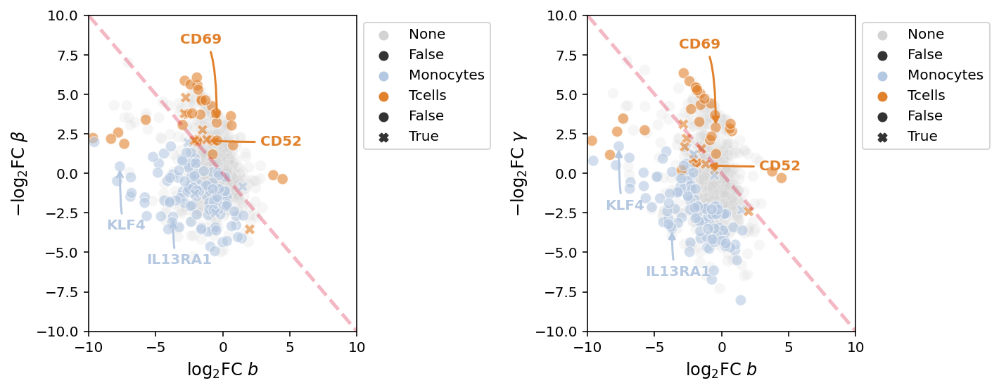

In [236]:
fig,ax = plt.subplots(1,2,figsize=(10,4))

name_inds = [list(outs[6]).index(i) for i in names_plot]

labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[1][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs=='None']),alpha=0.2,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[1][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs!='None']),alpha=0.6,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[1])[name_inds[n]]
    if arrow[n]:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-10,10])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[0].set_xlim(xlx)
ax[0].set_ylim(xly)

ax[0].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[0].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[0].set_ylabel(r'$-\log_{2}$FC $\beta$ ',fontsize=fs_axes)




labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[2][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs=='None']),alpha=0.2,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[2][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs!='None']),alpha=0.6,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[2])[name_inds[n]]
    if arrow[n]:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="-|>",connectionstyle="angle3,angleA=0,angleB=-90",
                                     lw=1.5,))
    else:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

        
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-10,10])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[1].set_xlim(xlx)
ax[1].set_ylim(xly)

ax[1].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[1].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[1].set_ylabel(r'$-\log_{2}$FC $\gamma$ ',fontsize=fs_axes)

plt.tight_layout()
plt.show()



In [237]:
sd_inds

[[0, 1], [0, 2]]

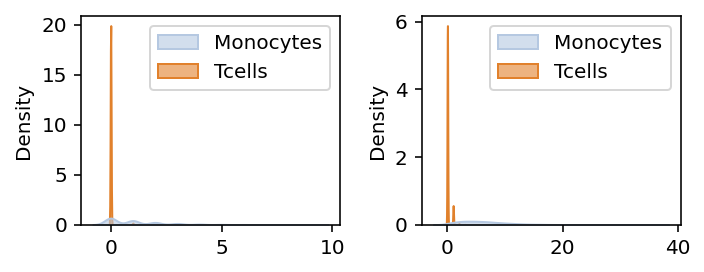

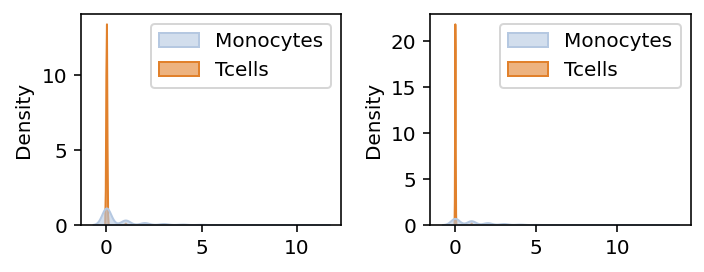

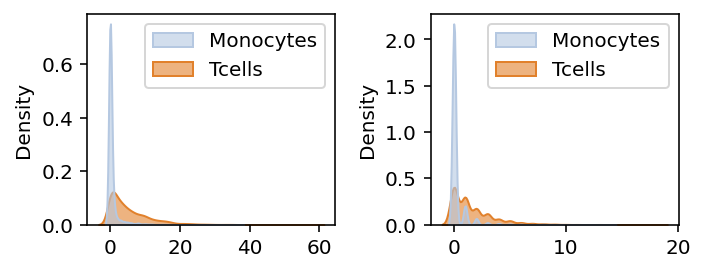

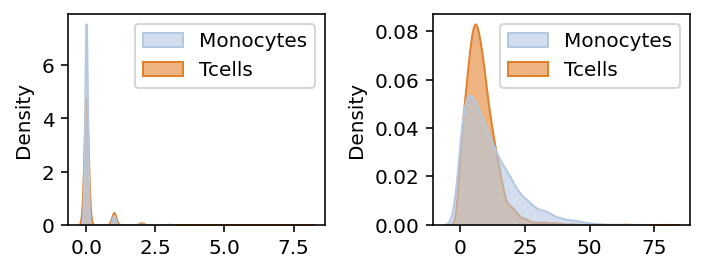

In [185]:
#Count distribution ,nascent mature, for select genes
count_plot = ['KLF4','IL13RA1','CD69','CD52']
K=0
s_l6 = sd[sd_inds[K][0]].layers[1]
s_vip = sd[sd_inds[K][1]].layers[1]
u_l6 = sd[sd_inds[K][0]].layers[0]
u_vip = sd[sd_inds[K][1]].layers[0]

labs = ['Tcells']*s_l6.shape[1] + ['Monocytes']*s_vip.shape[1]
u = np.concatenate((u_l6,u_vip),axis=1)
s = np.concatenate((s_l6,s_vip),axis=1)

for i in count_plot:
    ind = list(sd[sd_inds[K][0]].gene_names).index(i)
    fig,ax = plt.subplots(1,2,figsize=(5,2))
    sns.kdeplot(u[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[0])
    sns.kdeplot(s[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[1])
    plt.tight_layout()
    plt.show()


In [186]:
sig_genes = list(sub.gene[sub.param.isin(['b'])][np.array(outs[4]) | np.array(outs[5])])

In [187]:
sub2 = sub[sub.gene.isin(sig_genes)]

count_num_params = []
for i in range(len(sub2)):
    g = list(sub2.iloc[[i]].gene)[0]
    num = max(np.sum(sub2[sub2.gene.isin([g])].highFC),np.sum(sub2[sub2.gene.isin([g])].noSpliceFC))
    count_num_params += [num]
    
sub2['numDE'] = count_num_params
sub2.head()

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,log2FC,gene,pair,highFC,noSpliceFC,param,numDE
14,-3.081360,PTPRE,"[Tcells, Monocytes]",True,False,b,1
23,-0.440694,CD69,"[Tcells, Monocytes]",False,False,b,2
36,0.769929,CST7,"[Tcells, Monocytes]",False,False,b,1
38,-2.970015,CTSS,"[Tcells, Monocytes]",True,False,b,2
45,-1.221254,KLF10,"[Tcells, Monocytes]",False,False,b,1


In [188]:
sub2 = sub2.sort_values('numDE')

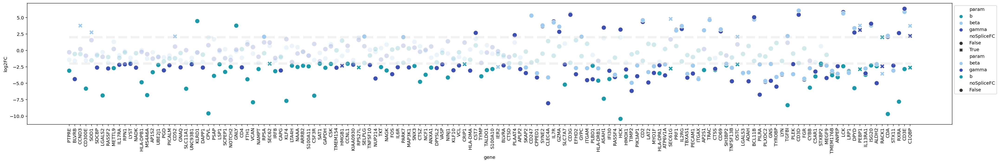

In [189]:
param_colors = {'b':col_b, 'beta':col_beta, 'gamma':col_gamma}
plt.figure(figsize=(30,5))

plt.plot(sub2.gene,[2]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3,)
plt.plot(sub2.gene,[-2]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3)


g=sns.scatterplot(data=sub2[(np.abs(sub2.log2FC)>2) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=1.0)

sns.scatterplot(data=sub2[~(np.abs(sub2.log2FC)>2) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=0.2)

_ = plt.xticks(rotation=90)
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()

*Tcells vs Bcells*

In [262]:
sub = all_filt_fcs[all_filt_fcs.pair.isin([['Tcells', 'Bcells']])]
outs = get_gene_DE(sub)

names_plot = ['PAX5','NCF1','CD247','CD3E']
mark_plot = ['Bcells','Bcells','Tcells','Tcells']
xpos = [0.5,2,0.1,1]
ypos = [-4.5,0.5,0.3,-5]
arrow = [True,True,False,True]

In [263]:
# names_plot = []

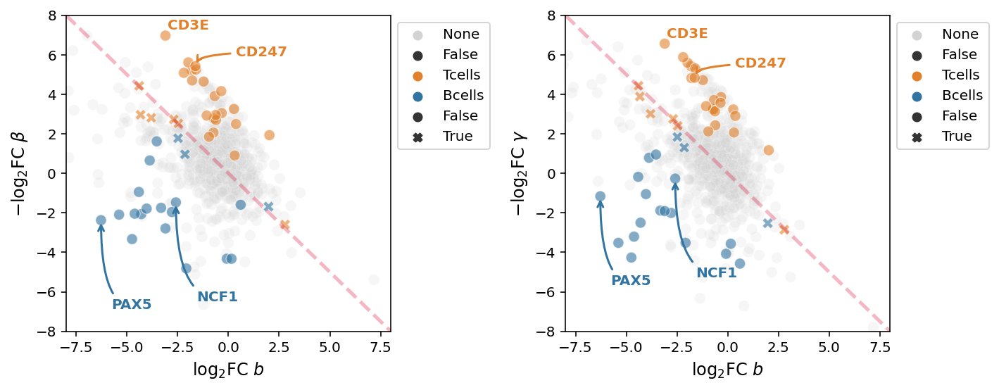

In [264]:
fig,ax = plt.subplots(1,2,figsize=(10,4))

name_inds = [list(outs[6]).index(i) for i in names_plot]

labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[1][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs=='None']),alpha=0.2,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[1][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs!='None']),alpha=0.6,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[1])[name_inds[n]]
    if arrow[n]:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[0].set_xlim(xlx)
ax[0].set_ylim(xly)

ax[0].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[0].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[0].set_ylabel(r'$-\log_{2}$FC $\beta$ ',fontsize=fs_axes)




labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[2][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs=='None']),alpha=0.2,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[2][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs!='None']),alpha=0.6,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[2])[name_inds[n]]
    if arrow[n]:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

        
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[1].set_xlim(xlx)
ax[1].set_ylim(xly)

ax[1].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[1].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[1].set_ylabel(r'$-\log_{2}$FC $\gamma$ ',fontsize=fs_axes)

plt.tight_layout()
plt.show()



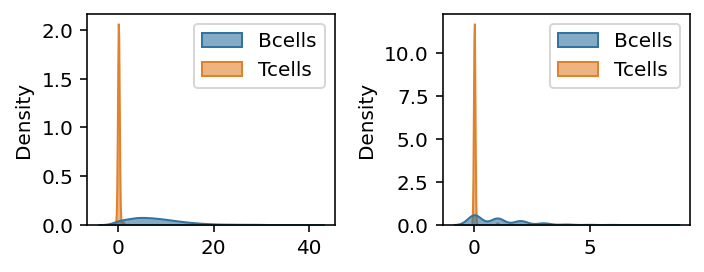

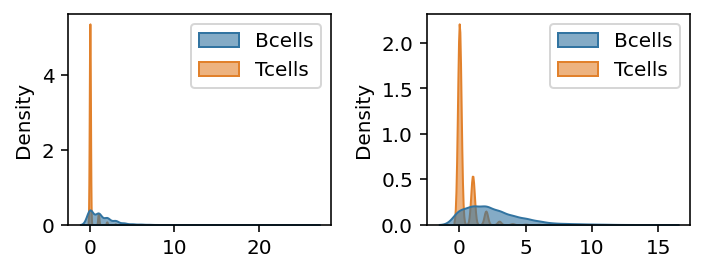

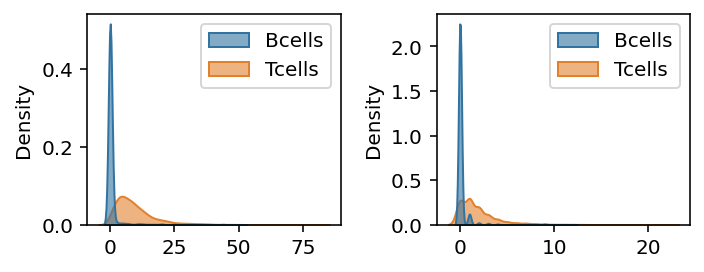

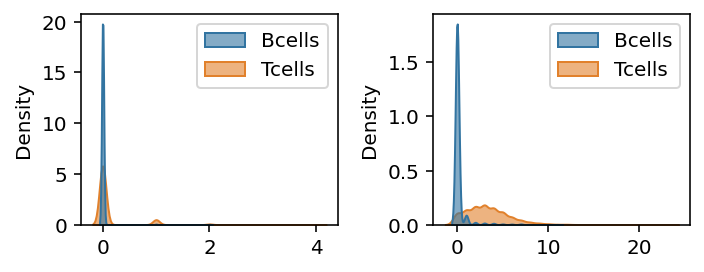

In [265]:
#Count distribution ,nascent mature, for select genes
count_plot = ['PAX5','NCF1','CD247','CD3E']
K=1
s_l6 = sd[sd_inds[K][0]].layers[1]
s_l23 = sd[sd_inds[K][1]].layers[1]
u_l6 = sd[sd_inds[K][0]].layers[0]
u_l23 = sd[sd_inds[K][1]].layers[0]

labs = ['Tcells']*s_l6.shape[1] + ['Bcells']*s_l23.shape[1]
u = np.concatenate((u_l6,u_l23),axis=1)
s = np.concatenate((s_l6,s_l23),axis=1)

for i in count_plot:
    ind = list(sd[sd_inds[K][0]].gene_names).index(i)
    fig,ax = plt.subplots(1,2,figsize=(5,2))
    sns.kdeplot(u[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[0])
    sns.kdeplot(s[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[1])
    plt.tight_layout()
    plt.show()


In [241]:
sig_genes = list(sub.gene[sub.param.isin(['b'])][np.array(outs[4]) | np.array(outs[5])])

In [242]:
sub2 = sub[sub.gene.isin(sig_genes)]

count_num_params = []
for i in range(len(sub2)):
    g = list(sub2.iloc[[i]].gene)[0]
    num = max(np.sum(sub2[sub2.gene.isin([g])].highFC),np.sum(sub2[sub2.gene.isin([g])].noSpliceFC))
    count_num_params += [num]
    
sub2['numDE'] = count_num_params
sub2.head()

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,log2FC,gene,pair,highFC,noSpliceFC,param,numDE
2919,-0.327867,CST7,"[Tcells, Bcells]",False,False,b,2
2977,-6.278662,PAX5,"[Tcells, Bcells]",True,False,b,2
2997,-4.295686,TCF4,"[Tcells, Bcells]",True,False,b,3
3009,2.790495,RACK1,"[Tcells, Bcells]",False,True,b,3
3020,-4.617813,BANK1,"[Tcells, Bcells]",True,False,b,3


In [243]:
sub2 = sub2.sort_values('numDE')

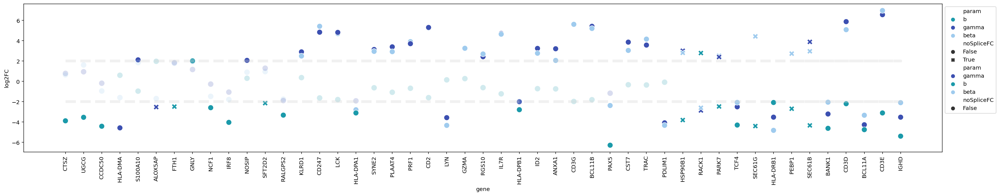

In [244]:
param_colors = {'b':col_b, 'beta':col_beta, 'gamma':col_gamma}
plt.figure(figsize=(25,5))

plt.plot(sub2.gene,[2]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3,)
plt.plot(sub2.gene,[-2]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3)


g=sns.scatterplot(data=sub2[(np.abs(sub2.log2FC)>2) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=1.0)

sns.scatterplot(data=sub2[~(np.abs(sub2.log2FC)>2) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=0.2)

_ = plt.xticks(rotation=90)
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()

In [674]:
res_to_use = grid_point_results[-1]
list(np.unique(res_to_use.assigns)).index(1)

ValueError: 1 is not in list

In [675]:
np.unique(res_to_use.assigns)

array([ 0,  2,  3,  4,  7,  8,  9, 11, 13])

In [692]:
res_to_use.all_klds[0].shape

(1082, 15)

In [695]:
d = [i[:,2] for i in res_to_use.all_klds]
d[0].shape

(1082,)

In [700]:
np.sum(res_to_use.assigns == 4)

3175

### **Find Parameter-DE Genes for k=10 meK-Means Results**

i.e. genes 'DE' in any parameter

In [639]:
c_genes = 'dimgrey'
alpha_genes = 0.1
c_highlight = 'lightcoral'
c_smean_highlight = 'lightseagreen'
alpha_highlight = 0.7
c_baseline = np.asarray([9,160,115])/255
c_singlegene = 'dodgerblue'
ms_genes = 20
ms_highlight = 50
fs_axes = 12
fs_title=14
alpha_line = 0.48
lw = 3
c_baseline_violation = 'blueviolet'
c_identity = 'k'

col_all_par = '#4472C4'
col_b = '#1B9AAA'
col_beta = '#9fcbee'
col_gamma ='#3C50B1'
col_expr = '#9299A0'




In [640]:
#Cell cluster colors
#Bcells': 0, 'Monocytes': 1, 'Tcells':
# assign_colors = {'Bcells':'#3274A1','Monocytes':'#B5C8E1','Tcells':'#E1812C','None':'lightgrey'}

assign_colors = {'FOXP3+ Cells': '#504b47', 'Low Expr. Monocytes': '#b5d3e1', 'Intermediate Monocytes': '#b8b5e1' , 
                'Dendritic Cells': '#204a67', 
           'CD4+ T-cells': '#e1ae2c', 'CD8+ T-cells': '#e1542c',
          'Non-Classical Monocytes': '#b5dee1', 'Natural Killer Cells': '#a95c18', 
           'B-cells': '#3274A1' , 'Classical Monocytes': '#7fa0cb','None':'lightgrey'}

print(assign_dict)

res_to_use = grid_point_results[-2] #params: gene x param x k
mm_dict = {'FOXP3+ Cells': 0, 'Low Expr. Monocytes': 1, 'Intermediate Monocytes': 2 , 'Dendritic Cells': 3, 
           'CD4+ T-cells': 4, 'CD8+ T-cells': 5,
          'Non-Classical Monocytes': 6, 'Natural Killer Cells': 7, 
           'B-cells': 8 , 'Classical Monocytes': 9}

par_vals = res_to_use.param_estimates



{'Bcells': 0, 'Monocytes': 1, 'Tcells': 2}


**Gene Markers for clusters 6vs9, 2vs9 (monocyte types)**

(CD86, CX3CR1, IL13RA1..GNLY,MS4A1)


In [641]:
gf_rej = ~check_at_bounds(par_vals[:,:,2],thr=0.03) & ~check_at_bounds(par_vals[:,:,6],thr=0.03) & ~check_at_bounds(par_vals[:,:,9],thr=0.03)


In [642]:
thrpars = 1.3 #2
thrmean = 1

k_inds = [[6,9],[2,6]]
#sd_inds = [[1,1],[1,1]]
name_inds = [['Non-Classical Monocytes','Classical Monocytes'],['Intermediate Monocytes','Non-Classical Monocytes']]


In [643]:
raw = dataset_strings[0]+'/raw.sd' #0:len(chosen)*num_ks
sd2 = monod.analysis.load_search_data(raw)

INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/raw.sd.


/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log2
  del sys.path[0]


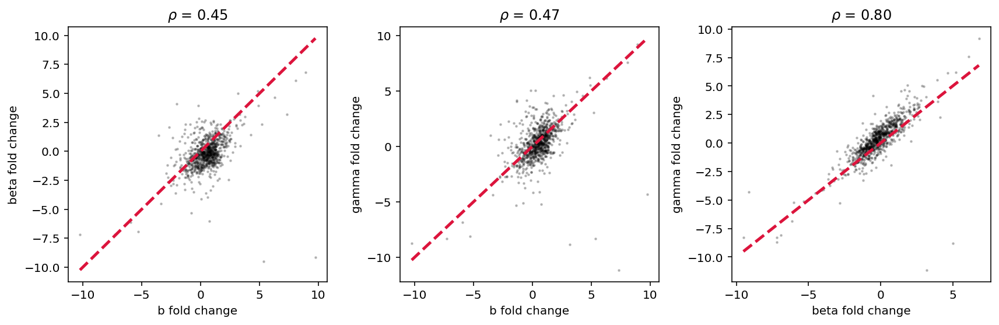

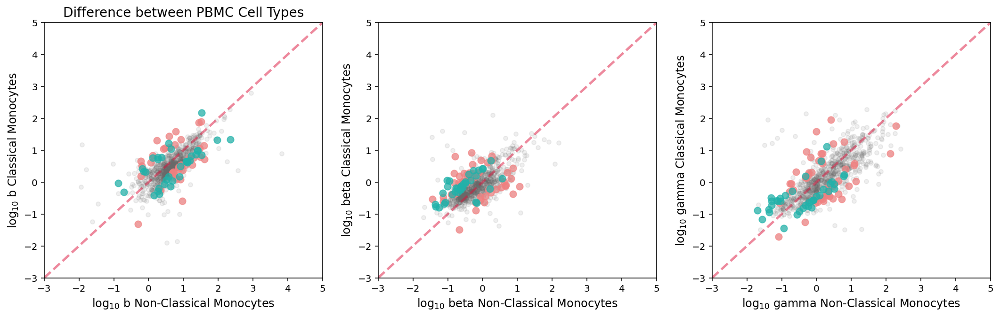

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]


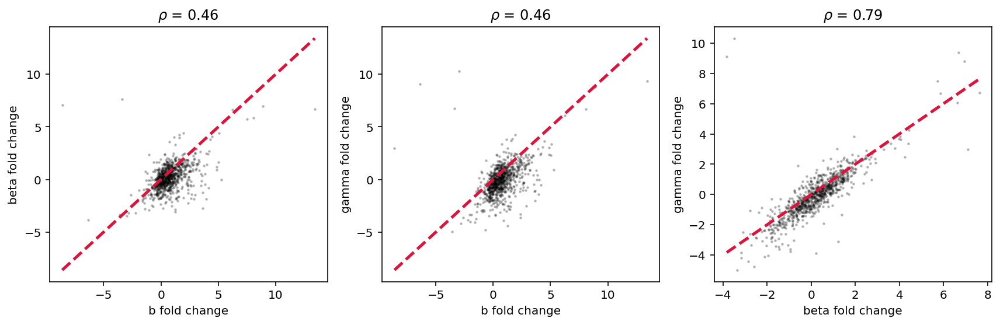

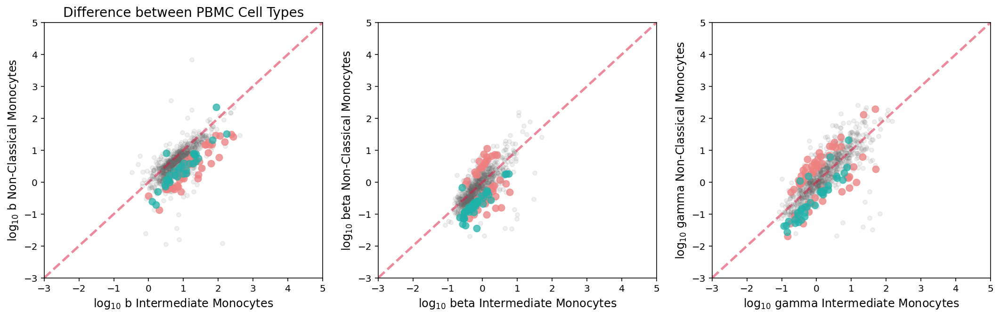

,log2FC,gene,pair,highFC,noSpliceFC,param
0,-0.098102,SPATA5,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b
1,1.399374,TMPO,"[Non-Classical Monocytes, Classical Monocytes]",True,False,b
2,-0.565100,CEP170,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b
3,-0.501578,ADGRE2,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b
4,-0.610179,EVL,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b


In [644]:
#Subset sd for clustered barcodes
all_filt_fcs = pd.DataFrame()
fcs = []
types = []
which_pair = []
highFC = []
spliceFC = []
g_names = []

for K in range(len(k_inds)):

    fc_par = ((par_vals[:,:,k_inds[K][0]]-par_vals[:,:,k_inds[K][1]])/np.log10(2))
    fc_s_par = np.log2(sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)/sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1))
    
    fig1,ax1 = plt.subplots(1,3,figsize=(12,4))
    pairs = [[0,1],[0,2],[1,2]]
    parnames = ('b','beta','gamma')
    for j,pair in enumerate(pairs):
        x = fc_par[gf_rej,pair[0]]
        y = fc_par[gf_rej,pair[1]]
        rho = np.corrcoef(x,y)[0,1]
        ax1[j].scatter(x,y,2,'k',alpha=0.2)
        xl = np.linspace(min(x),max(x))
        ax1[j].plot(xl,xl,'--',color='crimson',linewidth=2.5)
        ax1[j].set_xlabel(parnames[pair[0]] + ' fold change')
        ax1[j].set_ylabel(parnames[pair[1]] + ' fold change')
        ax1[j].set_title(r'$\rho$ = '+'{:.2f}'.format(rho))
    fig1.tight_layout()
    
    
    
    deltaB = fc_par[:,0]
    deltaBeta = fc_par[:,1]
    deltaGamma = fc_par[:,2]

    
    fig2,ax2 = plt.subplots(1,3,figsize=(18,5))
    gf_highnoise = (np.abs(deltaB)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    #For dataframe
    fcs += list(deltaB[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['b']*np.sum(gf_rej)
    
    
    
    #Burst size
    ax2[0].scatter(par_vals[gf_rej,0,k_inds[K][0]],par_vals[gf_rej,0,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[0].scatter(par_vals[gf_onlyhigh,0,k_inds[K][0]],par_vals[gf_onlyhigh,0,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[0].scatter(par_vals[gf_highnoise_meanS,0,k_inds[K][0]],par_vals[gf_highnoise_meanS,0,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[0].set_xlim(xlx)
    ax2[0].set_ylim(xly)

    ax2[0].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[0].set_xlabel(r'$\log_{10}$ b '+name_inds[K][0],fontsize=fs_axes)
    ax2[0].set_ylabel(r'$\log_{10}$ b '+name_inds[K][1],fontsize=fs_axes)
    ax2[0].set_title('Difference between PBMC Cell Types',fontsize=fs_title)
    
    
    #Beta fc
    gf_highnoise = (np.abs(deltaBeta)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaBeta[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['beta']*np.sum(gf_rej)
    

    ax2[1].scatter(par_vals[gf_rej,1,k_inds[K][0]],par_vals[gf_rej,1,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[1].scatter(par_vals[gf_onlyhigh,1,k_inds[K][0]],par_vals[gf_onlyhigh,1,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[1].scatter(par_vals[gf_highnoise_meanS,1,k_inds[K][0]],par_vals[gf_highnoise_meanS,1,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[1].set_xlim(xlx)
    ax2[1].set_ylim(xly)

    ax2[1].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[1].set_xlabel(r'$\log_{10}$ beta '+name_inds[K][0],fontsize=fs_axes)
    ax2[1].set_ylabel(r'$\log_{10}$ beta '+name_inds[K][1],fontsize=fs_axes)
    
    
    
    #gamma fc
    gf_highnoise = (np.abs(deltaGamma)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaGamma[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['gamma']*np.sum(gf_rej)

    ax2[2].scatter(par_vals[gf_rej,2,k_inds[K][0]],par_vals[gf_rej,2,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[2].scatter(par_vals[gf_onlyhigh,2,k_inds[K][0]],par_vals[gf_onlyhigh,2,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[2].scatter(par_vals[gf_highnoise_meanS,2,k_inds[K][0]],par_vals[gf_highnoise_meanS,2,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[2].set_xlim(xlx)
    ax2[2].set_ylim(xly)

    ax2[2].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[2].set_xlabel(r'$\log_{10}$ gamma '+name_inds[K][0],fontsize=fs_axes)
    ax2[2].set_ylabel(r'$\log_{10}$ gamma '+name_inds[K][1],fontsize=fs_axes)

    plt.show()

all_filt_fcs['log2FC'] = fcs
all_filt_fcs['gene'] = g_names
all_filt_fcs['pair'] = which_pair
all_filt_fcs['highFC'] = highFC
all_filt_fcs['noSpliceFC'] = spliceFC
all_filt_fcs['param'] = types

all_filt_fcs.head()
    

In [645]:
#6vs9
sub = all_filt_fcs[all_filt_fcs.pair.isin([['Non-Classical Monocytes', 'Classical Monocytes']])]
outs = get_gene_DE(sub)

names_plot = ['CD86','CX3CR1','CD36']
mark_plot = ['Non-Classical Monocytes','Non-Classical Monocytes','Classical Monocytes']
xpos = [2.5,2,0.1]
ypos = [-2,1.5,-4]
arrow = [True,True,True,True]

In [646]:
# names_plot = []

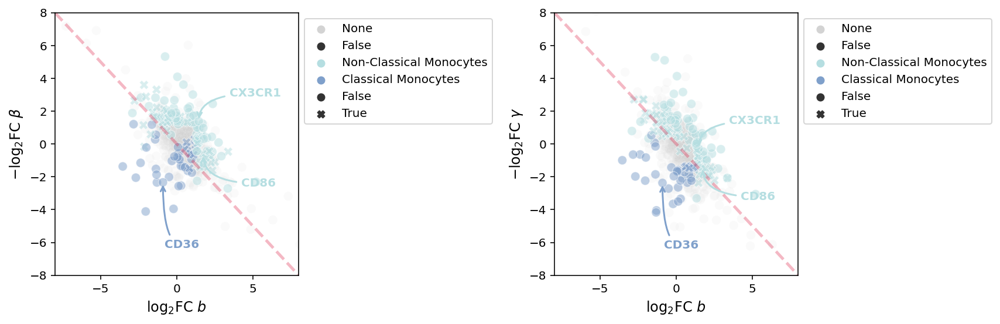

In [647]:
fig,ax = plt.subplots(1,2,figsize=(12,4))

name_inds = [list(outs[6]).index(i) for i in names_plot]

labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[1][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[1][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[1])[name_inds[n]]
    if arrow[n]:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[0].set_xlim(xlx)
ax[0].set_ylim(xly)

ax[0].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[0].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[0].set_ylabel(r'$-\log_{2}$FC $\beta$ ',fontsize=fs_axes)




labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[2][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[2][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[2])[name_inds[n]]
    if arrow[n]:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

        
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[1].set_xlim(xlx)
ax[1].set_ylim(xly)

ax[1].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[1].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[1].set_ylabel(r'$-\log_{2}$FC $\gamma$ ',fontsize=fs_axes)

plt.tight_layout()
plt.show()



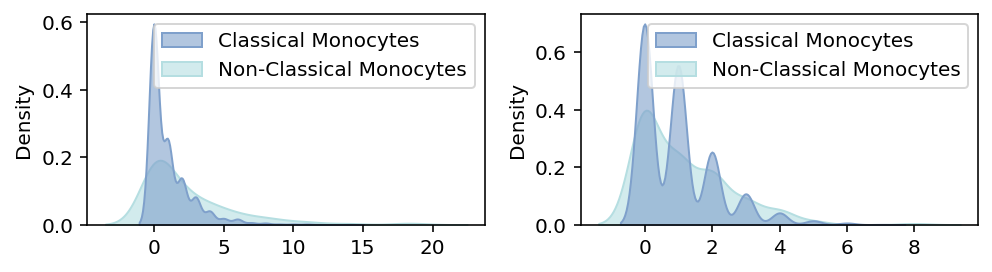

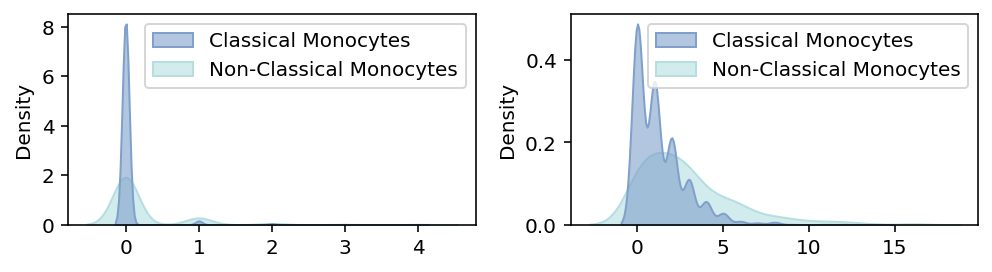

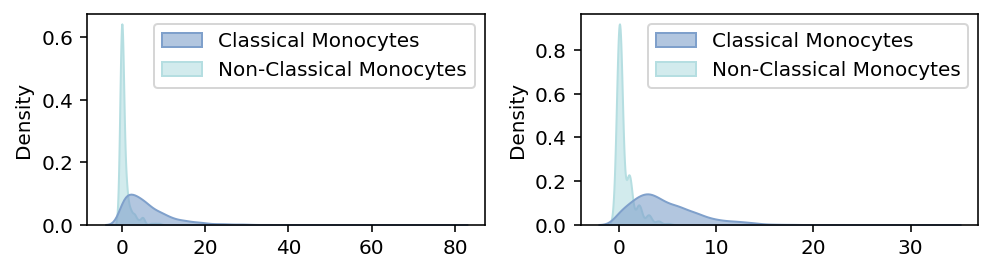

In [648]:
#Count distribution ,nascent mature, for select genes
count_plot = ['CD86','CX3CR1','CD36']
K=1
s_l6 = sd2.layers[1][:,res_to_use.assigns ==6]
s_l23 = sd2.layers[1][:,res_to_use.assigns ==9]
u_l6 = sd2.layers[0][:,res_to_use.assigns ==6]
u_l23 = sd2.layers[0][:,res_to_use.assigns ==9]

labs = ['Non-Classical Monocytes']*s_l6.shape[1] + ['Classical Monocytes']*s_l23.shape[1]
u = np.concatenate((u_l6,u_l23),axis=1)
s = np.concatenate((s_l6,s_l23),axis=1)

for i in count_plot:
    ind = list(sd2.gene_names).index(i)
    fig,ax = plt.subplots(1,2,figsize=(7,2))
    sns.kdeplot(u[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[0])
    sns.kdeplot(s[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[1])
    plt.tight_layout()
    plt.show()


In [649]:
sig_genes = list(sub.gene[sub.param.isin(['b'])][np.array(outs[4]) | np.array(outs[5])])

sub2 = sub[sub.gene.isin(sig_genes)]

count_num_params = []
for i in range(len(sub2)):
    g = list(sub2.iloc[[i]].gene)[0]
    num = max(np.sum(sub2[sub2.gene.isin([g])].highFC),np.sum(sub2[sub2.gene.isin([g])].noSpliceFC))
    count_num_params += [num]
    
sub2['numDE'] = count_num_params
sub2.head()

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,log2FC,gene,pair,highFC,noSpliceFC,param,numDE
1,1.399374,TMPO,"[Non-Classical Monocytes, Classical Monocytes]",True,False,b,1
3,-0.501578,ADGRE2,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b,2
5,0.393917,SORL1,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b,2
13,0.131758,PTPRE,"[Non-Classical Monocytes, Classical Monocytes]",False,False,b,1
14,1.610600,NBEAL2,"[Non-Classical Monocytes, Classical Monocytes]",False,True,b,1


In [650]:
sub2 = sub2.sort_values('numDE')


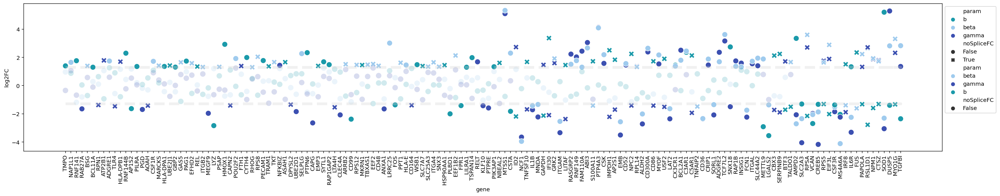

In [651]:
param_colors = {'b':col_b, 'beta':col_beta, 'gamma':col_gamma}
plt.figure(figsize=(25,5))

plt.plot(sub2.gene,[thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3,)
plt.plot(sub2.gene,[-thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3)


g=sns.scatterplot(data=sub2[(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=1.0)

sns.scatterplot(data=sub2[~(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=0.2)

_ = plt.xticks(rotation=90)
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()

In [652]:
all_filt_fcs[all_filt_fcs.gene.isin(['CD86'])]

,log2FC,gene,pair,highFC,noSpliceFC,param
654,1.723390,CD86,"[Non-Classical Monocytes, Classical Monocytes]",False,True,b
1494,-0.600437,CD86,"[Non-Classical Monocytes, Classical Monocytes]",False,False,beta
2334,-1.417386,CD86,"[Non-Classical Monocytes, Classical Monocytes]",False,True,gamma
3174,-0.488377,CD86,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,b
4014,0.668770,CD86,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,beta
4854,0.965128,CD86,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,gamma


In [653]:
#2vs6
sub = all_filt_fcs[all_filt_fcs.pair.isin([['Intermediate Monocytes', 'Non-Classical Monocytes']])]
outs = get_gene_DE(sub)

names_plot = ['CD36','CX3CR1','CD86']
mark_plot = ['Intermediate Monocytes','Non-Classical Monocytes','None']
xpos = [2.5,-4.5,-5]
ypos = [2,-2.5,0.5]
arrow = [True,True,True,True]

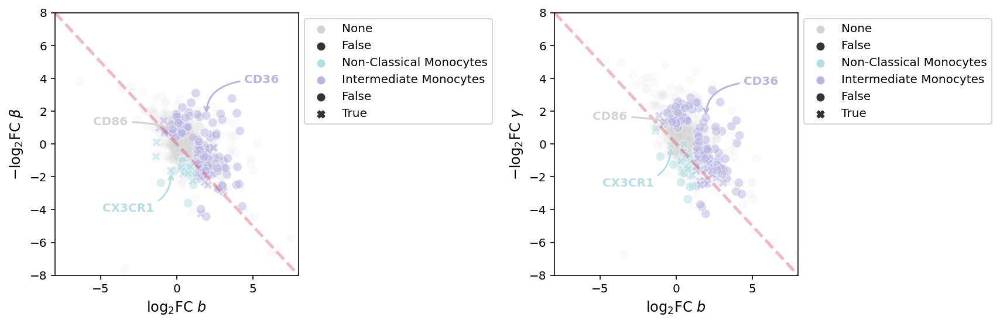

In [654]:
fig,ax = plt.subplots(1,2,figsize=(12,4))

name_inds = [list(outs[6]).index(i) for i in names_plot]

labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[1][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[1][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[1])[name_inds[n]]
    if arrow[n]:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[0].set_xlim(xlx)
ax[0].set_ylim(xly)

ax[0].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[0].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[0].set_ylabel(r'$-\log_{2}$FC $\beta$ ',fontsize=fs_axes)




labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[2][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[2][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[2])[name_inds[n]]
    if arrow[n]:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

        
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-8,8])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[1].set_xlim(xlx)
ax[1].set_ylim(xly)

ax[1].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[1].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[1].set_ylabel(r'$-\log_{2}$FC $\gamma$ ',fontsize=fs_axes)

plt.tight_layout()
plt.show()



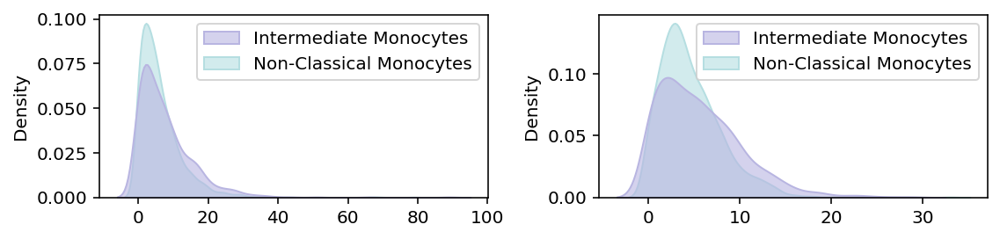

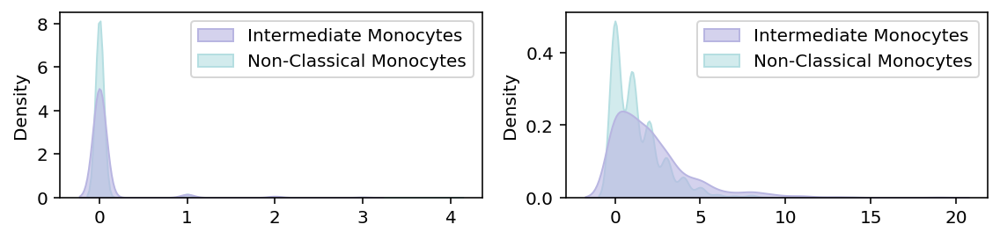

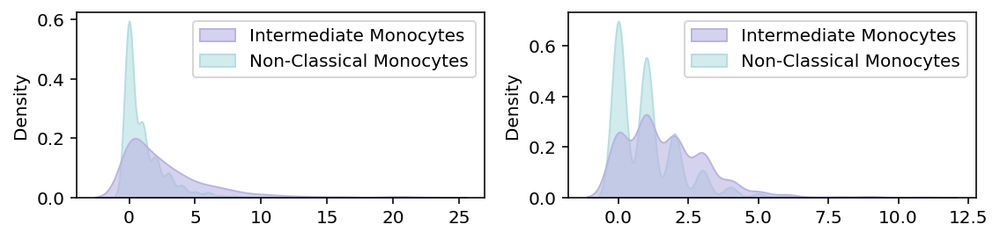

In [656]:
#Count distribution ,nascent mature, for select genes
count_plot = ['CD36','CX3CR1','CD86']
K=1
s_l6 = sd2.layers[1][:,res_to_use.assigns ==2]
s_l23 = sd2.layers[1][:,res_to_use.assigns ==9]
u_l6 = sd2.layers[0][:,res_to_use.assigns ==2]
u_l23 = sd2.layers[0][:,res_to_use.assigns ==9]

labs = ['Intermediate Monocytes']*s_l6.shape[1] + ['Non-Classical Monocytes']*s_l23.shape[1]
u = np.concatenate((u_l6,u_l23),axis=1)
s = np.concatenate((s_l6,s_l23),axis=1)

for i in count_plot:
    ind = list(sd2.gene_names).index(i)
    fig,ax = plt.subplots(1,2,figsize=(8,2))
    sns.kdeplot(u[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[0])
    sns.kdeplot(s[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[1])
    plt.tight_layout()
    plt.show()


In [657]:
sig_genes = list(sub.gene[sub.param.isin(['b'])][np.array(outs[4]) | np.array(outs[5])])

sub2 = sub[sub.gene.isin(sig_genes)]

count_num_params = []
for i in range(len(sub2)):
    g = list(sub2.iloc[[i]].gene)[0]
    num = max(np.sum(sub2[sub2.gene.isin([g])].highFC),np.sum(sub2[sub2.gene.isin([g])].noSpliceFC))
    count_num_params += [num]
    
sub2['numDE'] = count_num_params
sub2.head()

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,log2FC,gene,pair,highFC,noSpliceFC,param,numDE
2523,0.917850,ADGRE2,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,b,2
2525,1.384631,SORL1,"[Intermediate Monocytes, Non-Classical Monocytes]",True,False,b,1
2533,0.611376,PTPRE,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,b,1
2554,0.481891,FCER1G,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,b,1
2561,0.642745,KLF10,"[Intermediate Monocytes, Non-Classical Monocytes]",False,False,b,1


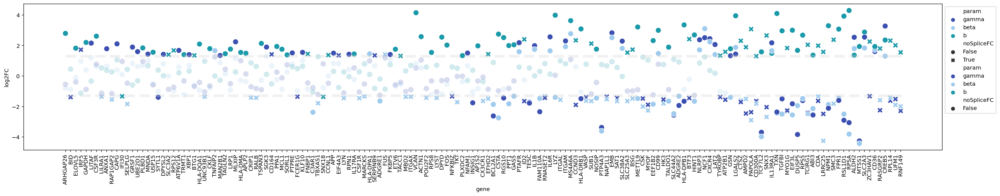

In [658]:
sub2 = sub2.sort_values('numDE')

param_colors = {'b':col_b, 'beta':col_beta, 'gamma':col_gamma}
plt.figure(figsize=(25,5))

plt.plot(sub2.gene,[thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3,)
plt.plot(sub2.gene,[-thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3)


g=sns.scatterplot(data=sub2[(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=1.0)

sns.scatterplot(data=sub2[~(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=0.2)

_ = plt.xticks(rotation=90)
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()

**Gene Markers for clusters 3 v 7 (NKs vs DCs types)**

(GNLY, MS4A1)


In [527]:
gf_rej = ~check_at_bounds(par_vals[:,:,3],thr=0.01) & ~check_at_bounds(par_vals[:,:,7],thr=0.01)


In [528]:
thrpars = 2 #2
thrmean = 1

k_inds = [[7,3]]
#sd_inds = [[1,1],[1,1]]
name_inds = [['Natural Killer Cells','Dendritic Cells']]


In [529]:
raw = dataset_strings[0]+'/raw.sd' #0:len(chosen)*num_ks
sd2 = monod.analysis.load_search_data(raw)

INFO:root:Search data loaded from ./fits/gg_230501_025_pbmc_MM_1/pbmc_10k_v3_Tcells_Monocytes_Bcells_k1/raw.sd.


/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log2
  del sys.path[0]


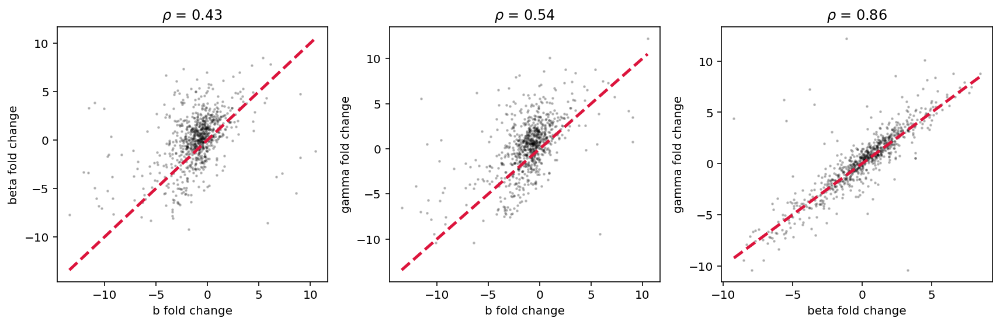

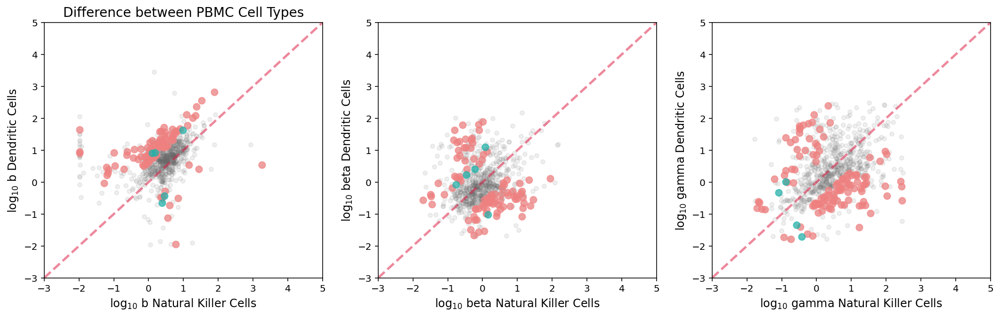

,log2FC,gene,pair,highFC,noSpliceFC,param
0,-0.722840,SPATA5,"[Natural Killer Cells, Dendritic Cells]",False,False,b
1,0.567161,TMPO,"[Natural Killer Cells, Dendritic Cells]",False,False,b
2,-0.506338,CEP170,"[Natural Killer Cells, Dendritic Cells]",False,False,b
3,-1.959833,EVL,"[Natural Killer Cells, Dendritic Cells]",False,False,b
4,-2.263111,SORL1,"[Natural Killer Cells, Dendritic Cells]",True,False,b


In [530]:
#Subset sd for clustered barcodes
all_filt_fcs = pd.DataFrame()
fcs = []
types = []
which_pair = []
highFC = []
spliceFC = []
g_names = []

for K in range(len(k_inds)):

    fc_par = ((par_vals[:,:,k_inds[K][0]]-par_vals[:,:,k_inds[K][1]])/np.log10(2))
    fc_s_par = np.log2(sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)/sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1))
    
    fig1,ax1 = plt.subplots(1,3,figsize=(12,4))
    pairs = [[0,1],[0,2],[1,2]]
    parnames = ('b','beta','gamma')
    for j,pair in enumerate(pairs):
        x = fc_par[gf_rej,pair[0]]
        y = fc_par[gf_rej,pair[1]]
        rho = np.corrcoef(x,y)[0,1]
        ax1[j].scatter(x,y,2,'k',alpha=0.2)
        xl = np.linspace(min(x),max(x))
        ax1[j].plot(xl,xl,'--',color='crimson',linewidth=2.5)
        ax1[j].set_xlabel(parnames[pair[0]] + ' fold change')
        ax1[j].set_ylabel(parnames[pair[1]] + ' fold change')
        ax1[j].set_title(r'$\rho$ = '+'{:.2f}'.format(rho))
    fig1.tight_layout()
    
    
    
    deltaB = fc_par[:,0]
    deltaBeta = fc_par[:,1]
    deltaGamma = fc_par[:,2]

    
    fig2,ax2 = plt.subplots(1,3,figsize=(18,5))
    gf_highnoise = (np.abs(deltaB)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    #For dataframe
    fcs += list(deltaB[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['b']*np.sum(gf_rej)
    
    
    
    #Burst size
    ax2[0].scatter(par_vals[gf_rej,0,k_inds[K][0]],par_vals[gf_rej,0,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[0].scatter(par_vals[gf_onlyhigh,0,k_inds[K][0]],par_vals[gf_onlyhigh,0,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[0].scatter(par_vals[gf_highnoise_meanS,0,k_inds[K][0]],par_vals[gf_highnoise_meanS,0,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[0].set_xlim(xlx)
    ax2[0].set_ylim(xly)

    ax2[0].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[0].set_xlabel(r'$\log_{10}$ b '+name_inds[K][0],fontsize=fs_axes)
    ax2[0].set_ylabel(r'$\log_{10}$ b '+name_inds[K][1],fontsize=fs_axes)
    ax2[0].set_title('Difference between PBMC Cell Types',fontsize=fs_title)
    
    
    #Beta fc
    gf_highnoise = (np.abs(deltaBeta)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaBeta[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['beta']*np.sum(gf_rej)
    

    ax2[1].scatter(par_vals[gf_rej,1,k_inds[K][0]],par_vals[gf_rej,1,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[1].scatter(par_vals[gf_onlyhigh,1,k_inds[K][0]],par_vals[gf_onlyhigh,1,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[1].scatter(par_vals[gf_highnoise_meanS,1,k_inds[K][0]],par_vals[gf_highnoise_meanS,1,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[1].set_xlim(xlx)
    ax2[1].set_ylim(xly)

    ax2[1].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[1].set_xlabel(r'$\log_{10}$ beta '+name_inds[K][0],fontsize=fs_axes)
    ax2[1].set_ylabel(r'$\log_{10}$ beta '+name_inds[K][1],fontsize=fs_axes)
    
    
    
    #gamma fc
    gf_highnoise = (np.abs(deltaGamma)>thrpars)  \
        & ((sd2.layers[1][:,res_to_use.assigns ==k_inds[K][0]].mean(1)>thrmean) | (sd2.layers[1][:,res_to_use.assigns ==k_inds[K][1]].mean(1)>thrmean)) \
        & gf_rej
    
    gf_highnoise_meanS = gf_highnoise & (np.abs(fc_s_par)<1) & gf_rej
    
    gf_onlyhigh = gf_highnoise & ~(np.abs(fc_s_par)<1) & gf_rej
    
    fcs += list(-1*deltaGamma[gf_rej])
    g_names += list(search_data.gene_names[gf_rej])
    which_pair += [name_inds[K]]*np.sum(gf_rej)
    highFC += list(gf_onlyhigh[gf_rej])
    spliceFC += list(gf_highnoise_meanS[gf_rej])
    types += ['gamma']*np.sum(gf_rej)

    ax2[2].scatter(par_vals[gf_rej,2,k_inds[K][0]],par_vals[gf_rej,2,k_inds[K][1]],ms_genes,c_genes,alpha=alpha_genes)
    ax2[2].scatter(par_vals[gf_onlyhigh,2,k_inds[K][0]],par_vals[gf_onlyhigh,2,k_inds[K][1]],ms_highlight,c_highlight,alpha=alpha_highlight)
    ax2[2].scatter(par_vals[gf_highnoise_meanS,2,k_inds[K][0]],par_vals[gf_highnoise_meanS,2,k_inds[K][1]],ms_highlight,c_smean_highlight,alpha=alpha_highlight)


    xl =np.asarray([-3,5])
    xlx = [xl[0],xl[1]]
    xly = [xl[0],xl[1]]
    ax2[2].set_xlim(xlx)
    ax2[2].set_ylim(xly)

    ax2[2].plot(xl,xl,'--',linewidth=2.5,c='crimson',alpha=0.5)

    ax2[2].set_xlabel(r'$\log_{10}$ gamma '+name_inds[K][0],fontsize=fs_axes)
    ax2[2].set_ylabel(r'$\log_{10}$ gamma '+name_inds[K][1],fontsize=fs_axes)

    plt.show()

all_filt_fcs['log2FC'] = fcs
all_filt_fcs['gene'] = g_names
all_filt_fcs['pair'] = which_pair
all_filt_fcs['highFC'] = highFC
all_filt_fcs['noSpliceFC'] = spliceFC
all_filt_fcs['param'] = types

all_filt_fcs.head()
    

In [531]:
all_filt_fcs[all_filt_fcs.gene.isin(['GNLY'])]

,log2FC,gene,pair,highFC,noSpliceFC,param
606,-3.105697,GNLY,"[Natural Killer Cells, Dendritic Cells]",True,False,b
1383,5.754874,GNLY,"[Natural Killer Cells, Dendritic Cells]",True,False,beta
2160,6.485462,GNLY,"[Natural Killer Cells, Dendritic Cells]",True,False,gamma


In [565]:
#3v7
sub = all_filt_fcs[all_filt_fcs.pair.isin([['Natural Killer Cells','Dendritic Cells']])]
outs = get_gene_DE(sub)

names_plot = ['GNLY','IL3RA']
mark_plot = ['Natural Killer Cells','Dendritic Cells']
xpos = [3.5,-11]
ypos = [3,-0.2]
arrow = [True,True,True,True]

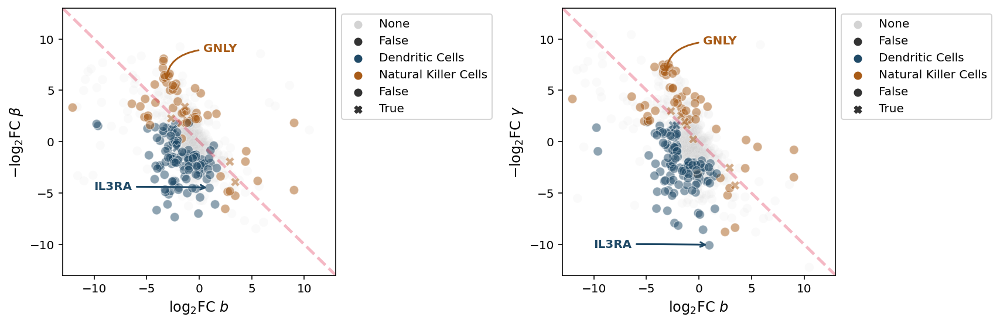

In [566]:
fig,ax = plt.subplots(1,2,figsize=(12,4))

name_inds = [list(outs[6]).index(i) for i in names_plot]

labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[1][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[1][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[0],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[1])[name_inds[n]]
    if arrow[n]:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[0].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-13,13])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[0].set_xlim(xlx)
ax[0].set_ylim(xly)

ax[0].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[0].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[0].set_ylabel(r'$-\log_{2}$FC $\beta$ ',fontsize=fs_axes)




labs = np.array(outs[3])
g=sns.scatterplot(x=list(outs[0][labs =='None']),y=list(outs[2][labs=='None']),hue=list(pd.Categorical(outs[3])[labs=='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs=='None']),alpha=0.1,s=60)

sns.scatterplot(x=list(outs[0][labs!='None']),y=list(outs[2][labs!='None']),hue=list(pd.Categorical(outs[3])[labs!='None']),
                  palette=assign_colors,ax=ax[1],style=list(outs[5][labs!='None']),alpha=0.5,s=60)

#Annotate genes
for n in range(len(names_plot)):
    x=list(outs[0])[name_inds[n]]
    y=list(outs[2])[name_inds[n]]
    if arrow[n]:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),weight="bold", color=assign_colors[mark_plot[n]],
                   arrowprops = dict(color=assign_colors[mark_plot[n]],  
                                     arrowstyle="->",connectionstyle="angle3,angleA=0,angleB=-90",lw=1.5))
    else:
        ax[1].annotate(names_plot[n], (x, y), xytext=(x+xpos[n], y+ypos[n]),color=assign_colors[mark_plot[n]],weight="bold")

        
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

xl =np.asarray([-13,13])
xlx = [xl[0],xl[1]]
xly = [xl[0],xl[1]]
ax[1].set_xlim(xlx)
ax[1].set_ylim(xly)

ax[1].plot(xl,-xl,'--',linewidth=2.5,c='crimson',alpha=0.3)

ax[1].set_xlabel(r'$\log_{2}$FC $b$ ',fontsize=fs_axes)
ax[1].set_ylabel(r'$-\log_{2}$FC $\gamma$ ',fontsize=fs_axes)

plt.tight_layout()
plt.show()



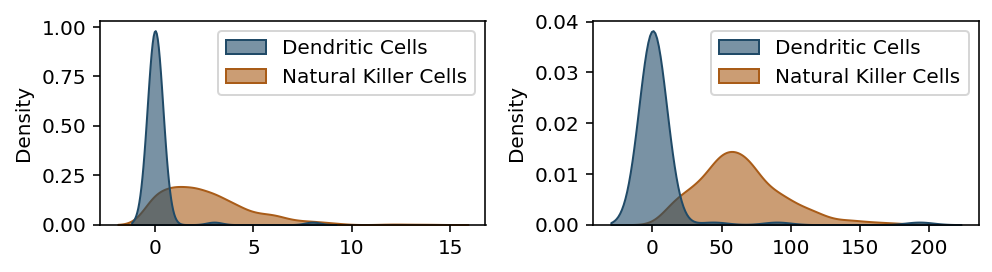

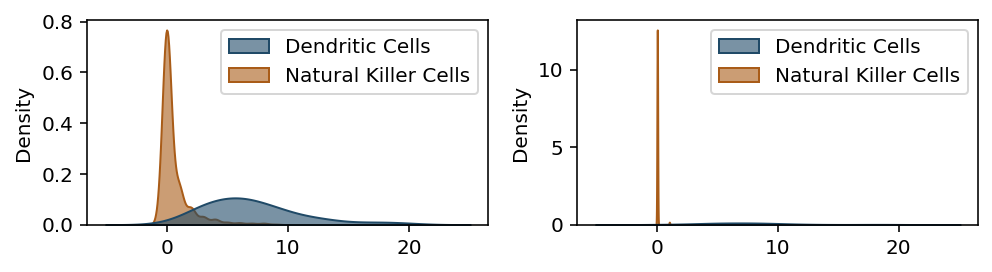

In [536]:
#Count distribution ,nascent mature, for select genes
count_plot = ['GNLY', 'IL3RA']
K=1
s_l6 = sd2.layers[1][:,res_to_use.assigns ==7]
s_l23 = sd2.layers[1][:,res_to_use.assigns ==3]
u_l6 = sd2.layers[0][:,res_to_use.assigns ==7]
u_l23 = sd2.layers[0][:,res_to_use.assigns ==3]

labs = ['Natural Killer Cells']*s_l6.shape[1] + ['Dendritic Cells']*s_l23.shape[1]
u = np.concatenate((u_l6,u_l23),axis=1)
s = np.concatenate((s_l6,s_l23),axis=1)

for i in count_plot:
    ind = list(sd2.gene_names).index(i)
    fig,ax = plt.subplots(1,2,figsize=(7,2))
    sns.kdeplot(u[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[0])
    sns.kdeplot(s[ind,:],alpha=0.6,hue=pd.Categorical(labs),palette=assign_colors,fill=True,
                common_norm=False,ax=ax[1])
    plt.tight_layout()
    plt.show()


In [537]:
sig_genes = list(sub.gene[sub.param.isin(['b'])][np.array(outs[4]) | np.array(outs[5])])

sub2 = sub[sub.gene.isin(sig_genes)]

count_num_params = []
for i in range(len(sub2)):
    g = list(sub2.iloc[[i]].gene)[0]
    num = max(np.sum(sub2[sub2.gene.isin([g])].highFC),np.sum(sub2[sub2.gene.isin([g])].noSpliceFC))
    count_num_params += [num]
    
sub2['numDE'] = count_num_params
sub2.head()

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,log2FC,gene,pair,highFC,noSpliceFC,param,numDE
4,-2.263111,SORL1,"[Natural Killer Cells, Dendritic Cells]",True,False,b,1
8,-2.244652,FOXP1,"[Natural Killer Cells, Dendritic Cells]",True,False,b,1
11,-4.916456,PTPRE,"[Natural Killer Cells, Dendritic Cells]",True,False,b,1
32,9.031261,CST7,"[Natural Killer Cells, Dendritic Cells]",True,False,b,3
35,-0.494066,CTSS,"[Natural Killer Cells, Dendritic Cells]",False,False,b,1


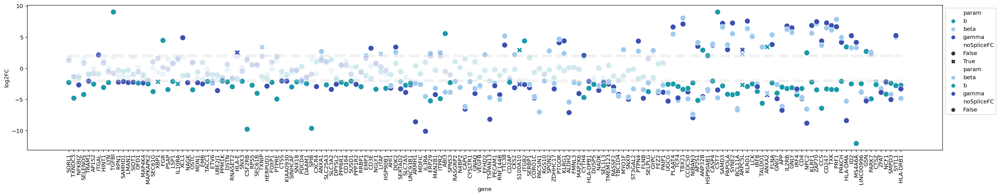

In [538]:
sub2 = sub2.sort_values('numDE')

param_colors = {'b':col_b, 'beta':col_beta, 'gamma':col_gamma}
plt.figure(figsize=(25,5))

plt.plot(sub2.gene,[thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3,)
plt.plot(sub2.gene,[-thrpars]*len(sub2.gene),'--',c='lightgrey',linewidth=5.0,alpha=0.3)


g=sns.scatterplot(data=sub2[(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=1.0)

sns.scatterplot(data=sub2[~(np.abs(sub2.log2FC)>thrpars) ],x='gene',y='log2FC',
                  hue='param',style='noSpliceFC',palette=param_colors,s=100,alpha=0.2)

_ = plt.xticks(rotation=90)
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()

,b,beta,gamma,Assignment
0,0.290360,-0.159923,0.547318,0
1,1.187905,0.014106,0.616108,0
2,0.767230,0.130241,0.770030,0
3,1.559143,1.396041,2.500000,0
4,0.885024,0.637393,0.910402,0
...,...,...,...,...
10815,-0.793132,-0.335908,-0.353093,9
10816,0.994510,1.339944,1.257594,9
10817,0.745760,-0.479950,-0.117596,9
10818,-0.302476,-0.518810,-0.128136,9
